In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 325s - loss: 1.4572e-04
Epoch 2/10
 - 327s - loss: 1.9020e-05
Epoch 3/10
 - 326s - loss: 1.2917e-05
Epoch 4/10
 - 327s - loss: 1.1604e-05
Epoch 5/10
 - 325s - loss: 1.0818e-05
Epoch 6/10
 - 326s - loss: 1.0419e-05
Epoch 7/10
 - 324s - loss: 1.0032e-05
Epoch 8/10
 - 325s - loss: 9.8125e-06
Epoch 9/10
 - 324s - loss: 9.4536e-06
Epoch 10/10
 - 320s - loss: 9.1288e-06


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.3291 RMSE


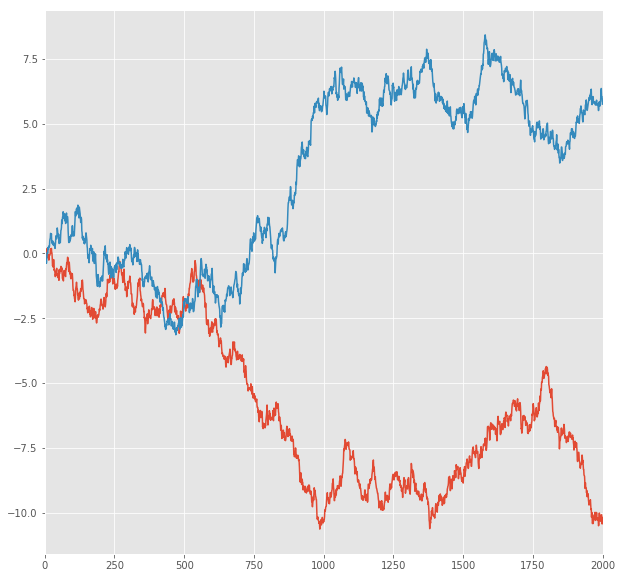

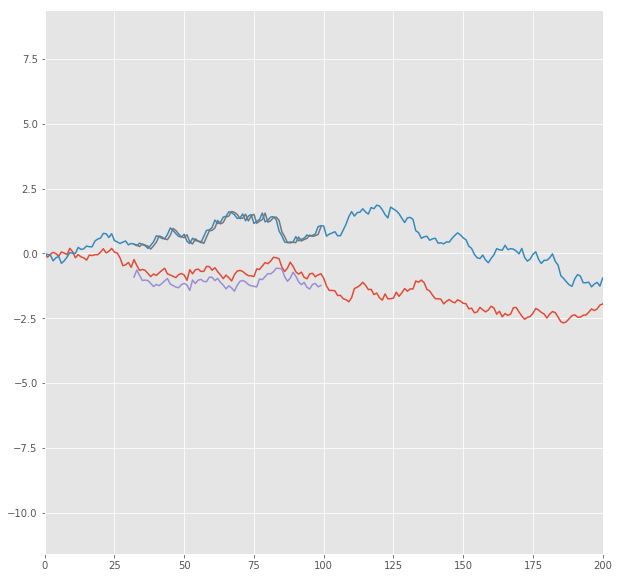

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.4540 RMSE
Predict Score for 1 -steps forecast: 0.4349 RMSE
Error Test Score for 1 -steps forecast: 0.1476 RMSE
RT Test Score for 1 -steps forecast: 0.1300 RMSE
Error Test Corr for 1 -steps forecast: 0.9609
RT Test Corr for 1 -steps forecast: 0.9486


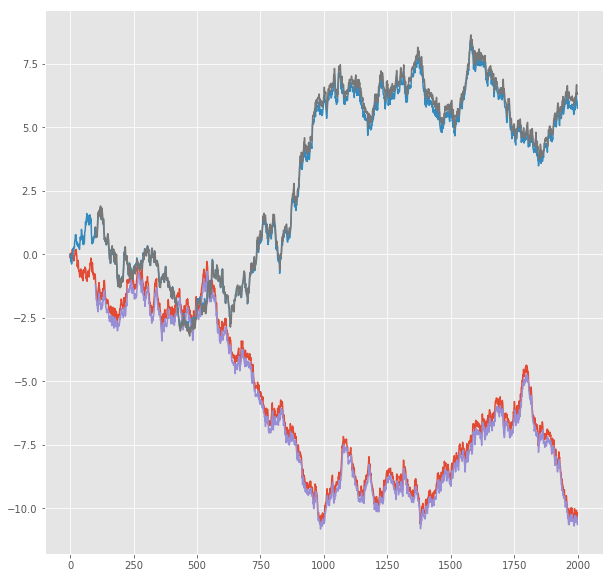

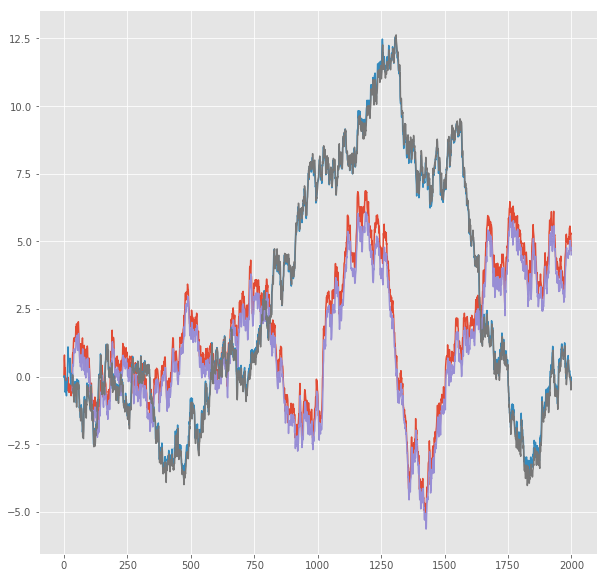

R^2 score for regression on Error: 0.9233
k = 0.9959


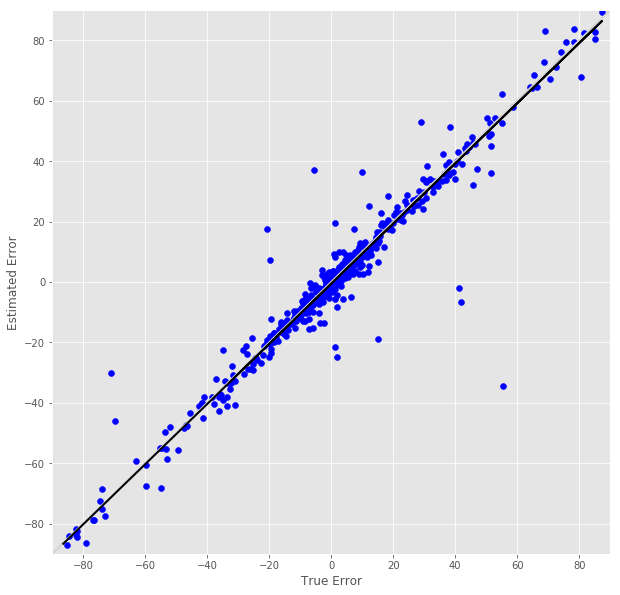

R^2 score for regression on RT: 0.8998
k = 0.9816


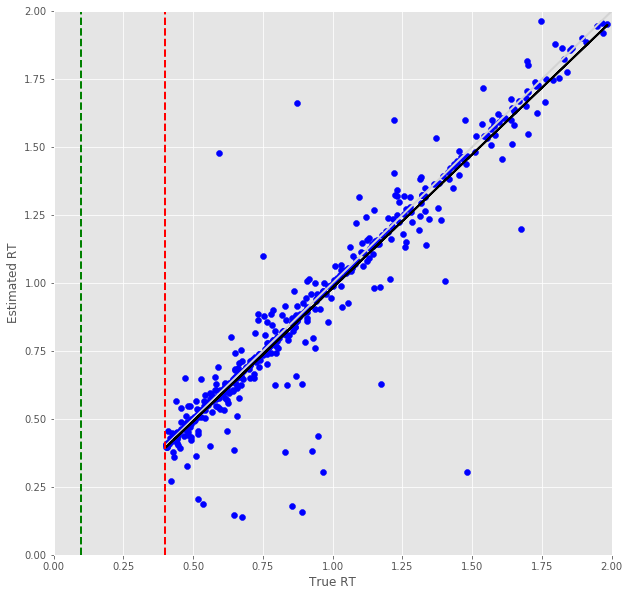

Error Prediction Score: 0.1344 RMSE
RT Prediction Score: 0.1069 RMSE
Error Prediction Corr: 0.9576
RT Prediction Corr: 0.9658
R^2 score for regression on Error: 0.9169
k = 0.9900


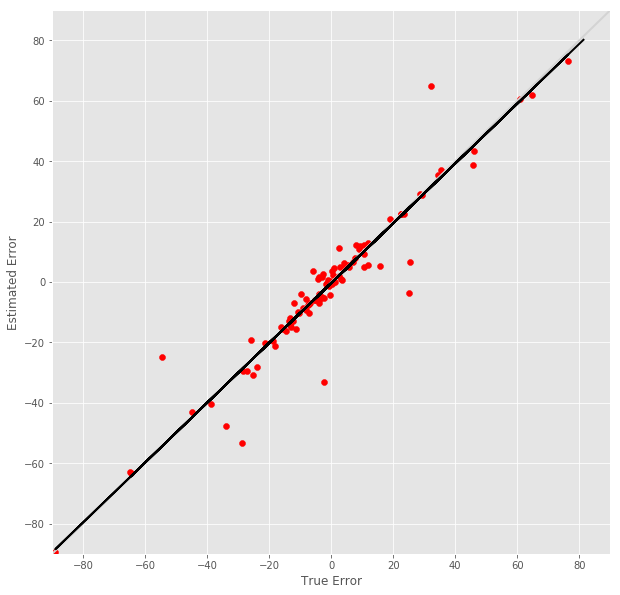

R^2 score for regression on RT: 0.9327
k = 0.9741


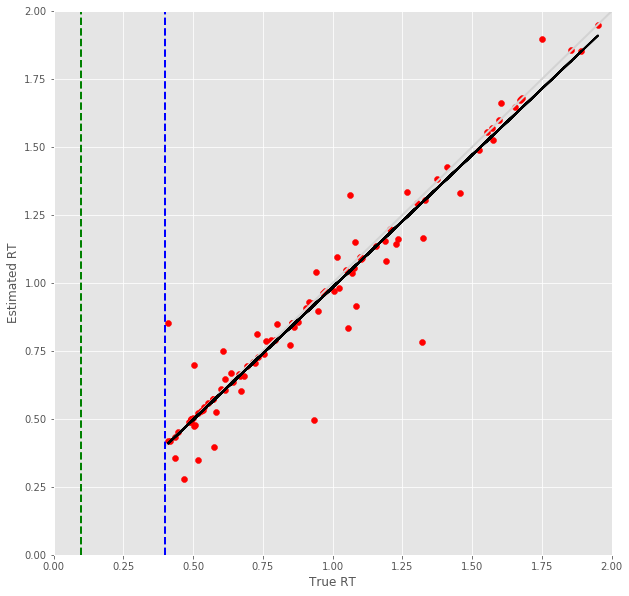

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.8507 RMSE
Predict Score for 2 -steps forecast: 0.8164 RMSE
Error Test Score for 2 -steps forecast: 0.2158 RMSE
RT Test Score for 2 -steps forecast: 0.2075 RMSE
Error Test Corr for 2 -steps forecast: 0.9216
RT Test Corr for 2 -steps forecast: 0.8674


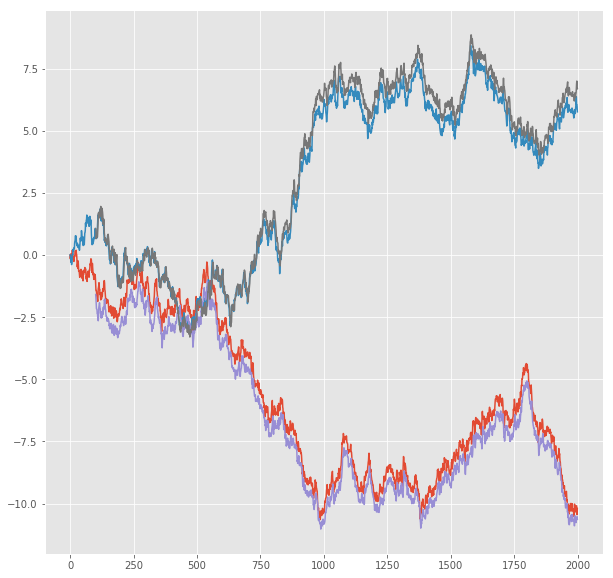

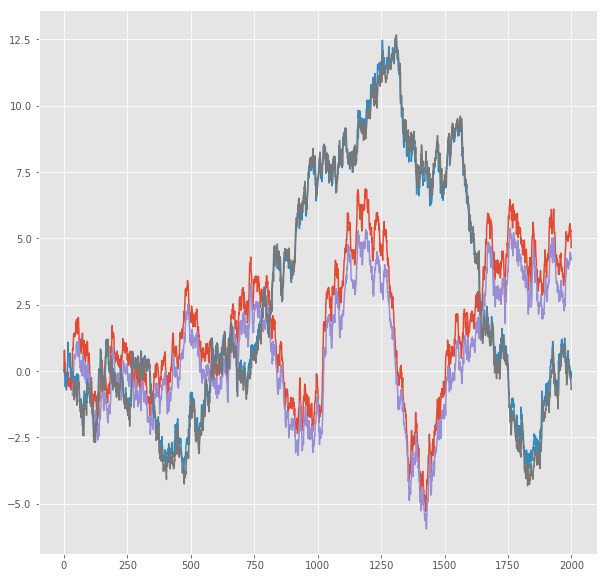

R^2 score for regression on Error: 0.8494
k = 0.9963


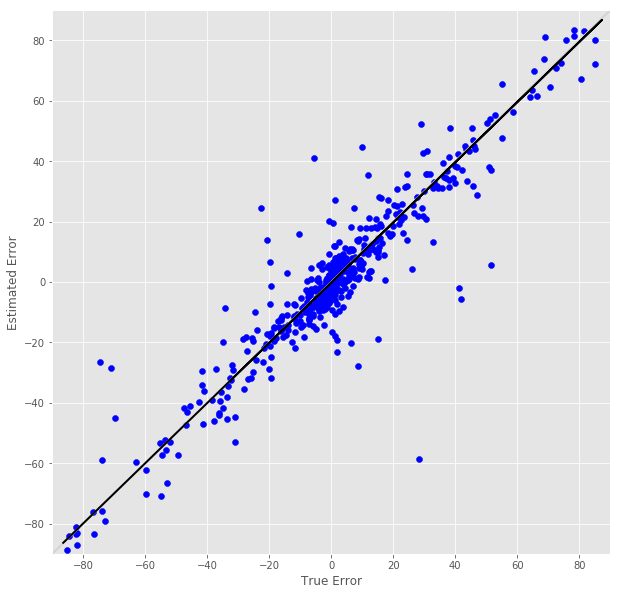

R^2 score for regression on RT: 0.7525
k = 0.9010


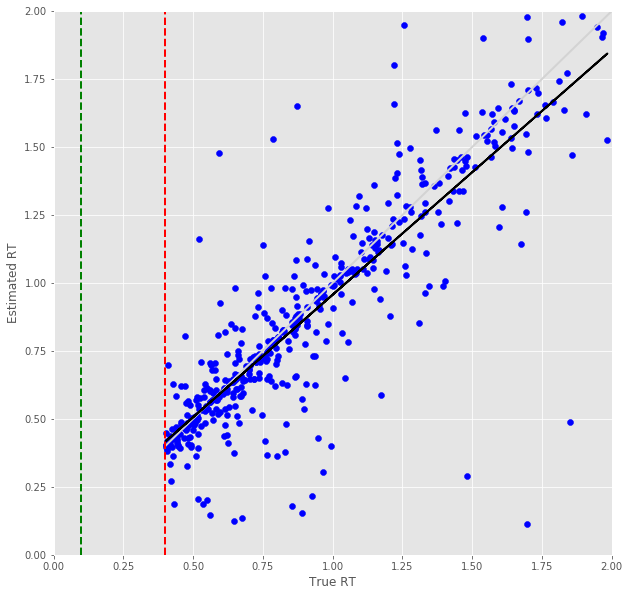

Error Prediction Score: 0.2443 RMSE
RT Prediction Score: 0.1949 RMSE
Error Prediction Corr: 0.8790
RT Prediction Corr: 0.8904
R^2 score for regression on Error: 0.7727
k = 0.9935


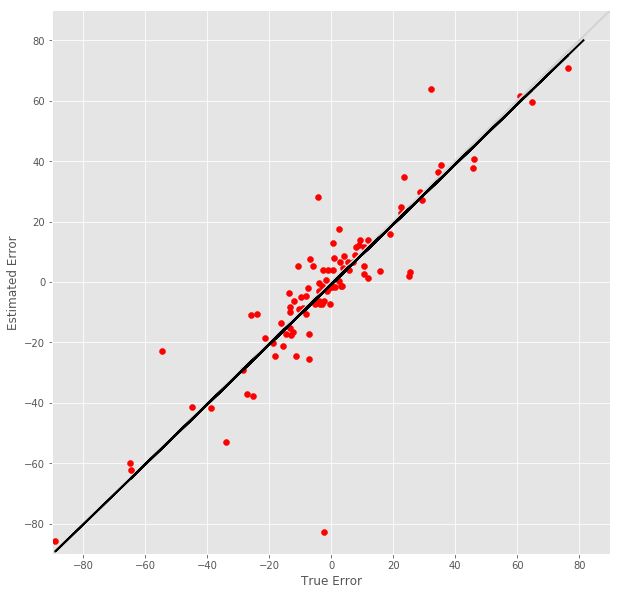

R^2 score for regression on RT: 0.7928
k = 0.9524


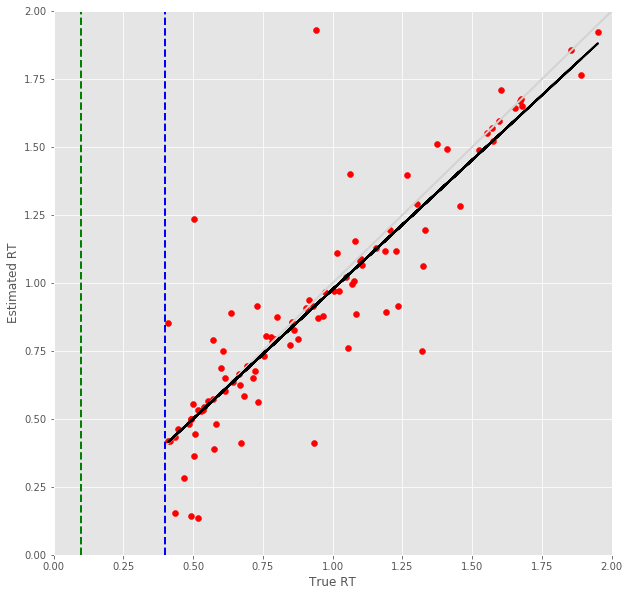

3 -step(s) forecast:
Test Score for 3 -steps forecast: 1.2171 RMSE
Predict Score for 3 -steps forecast: 1.1714 RMSE
Error Test Score for 3 -steps forecast: 0.2857 RMSE
RT Test Score for 3 -steps forecast: 0.2999 RMSE
Error Test Corr for 3 -steps forecast: 0.8784
RT Test Corr for 3 -steps forecast: 0.7302


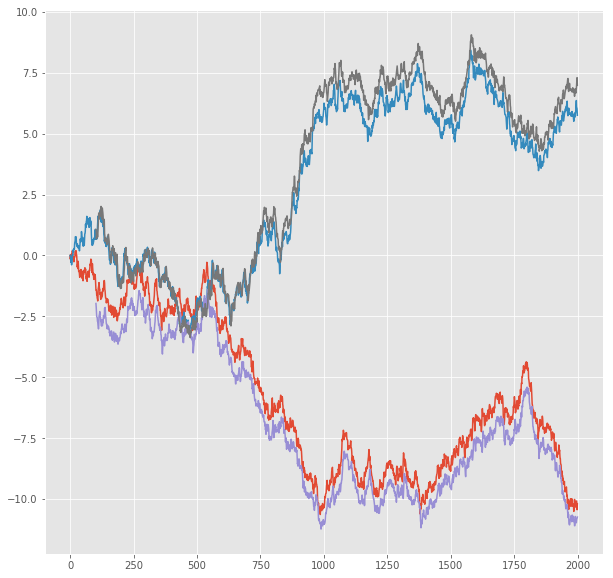

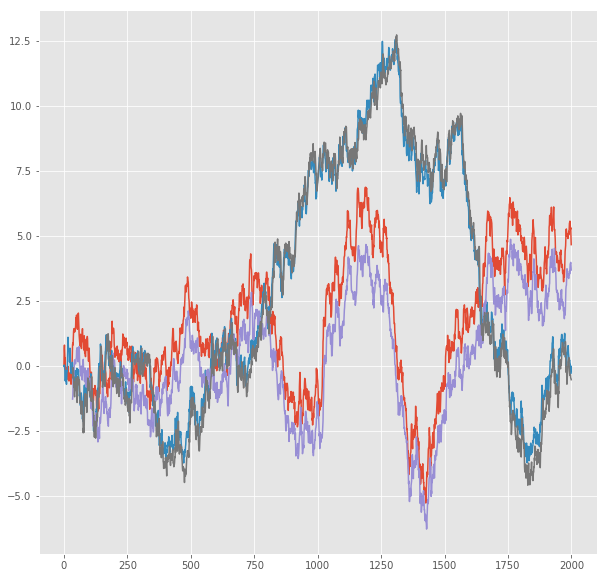

R^2 score for regression on Error: 0.7716
k = 1.0142


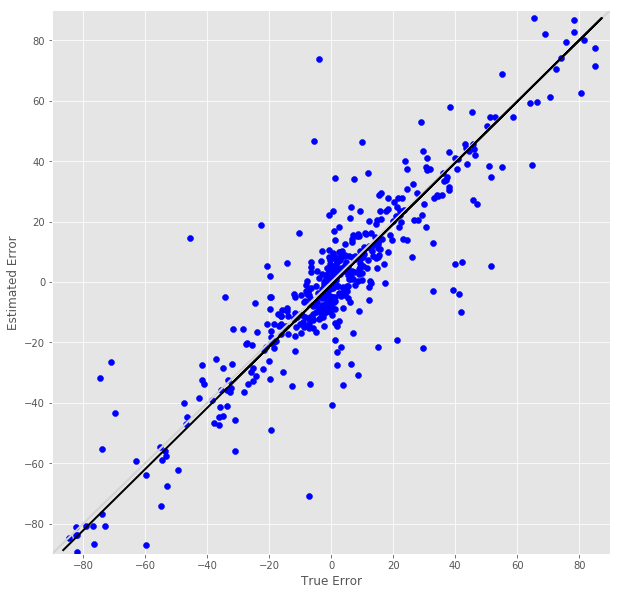

R^2 score for regression on RT: 0.5332
k = 0.7661


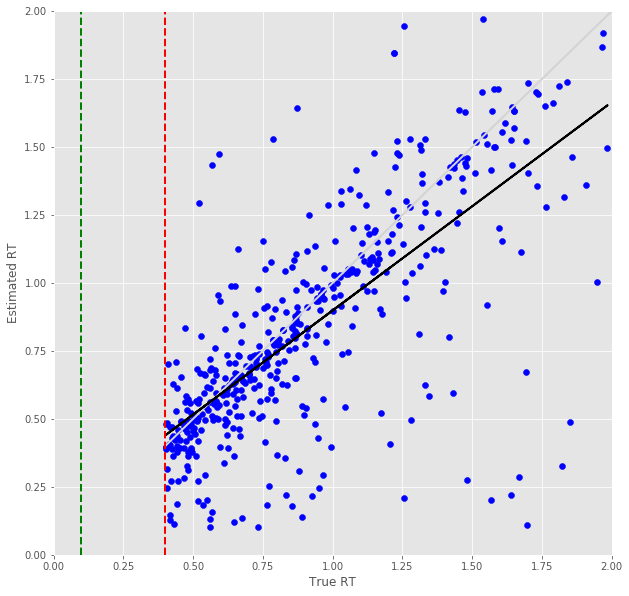

Error Prediction Score: 0.2701 RMSE
RT Prediction Score: 0.2231 RMSE
Error Prediction Corr: 0.8440
RT Prediction Corr: 0.8643
R^2 score for regression on Error: 0.7124
k = 0.9235


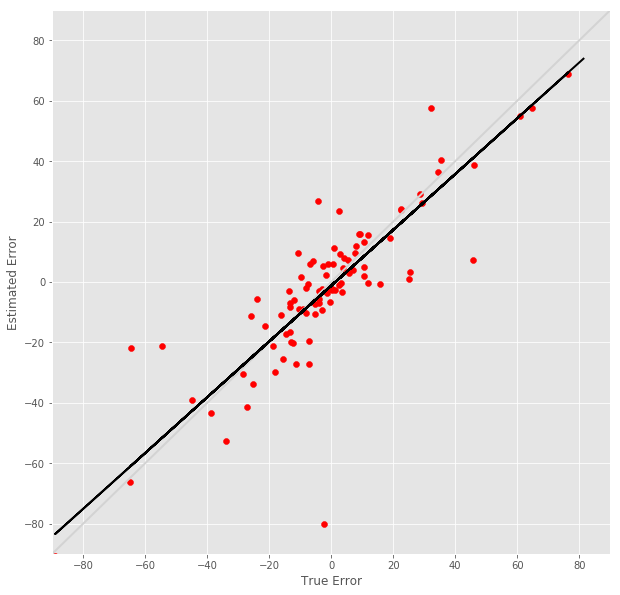

R^2 score for regression on RT: 0.7470
k = 0.9400


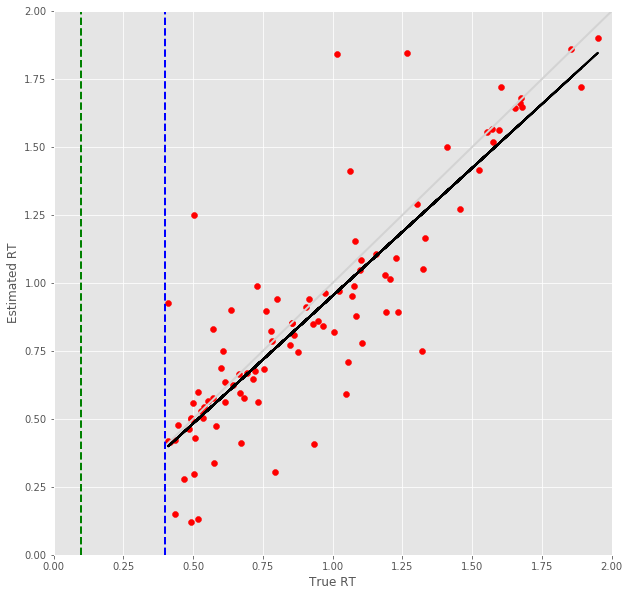

4 -step(s) forecast:
Test Score for 4 -steps forecast: 1.5594 RMSE
Predict Score for 4 -steps forecast: 1.5051 RMSE
Error Test Score for 4 -steps forecast: 0.3419 RMSE
RT Test Score for 4 -steps forecast: 0.3597 RMSE
Error Test Corr for 4 -steps forecast: 0.8347
RT Test Corr for 4 -steps forecast: 0.6346


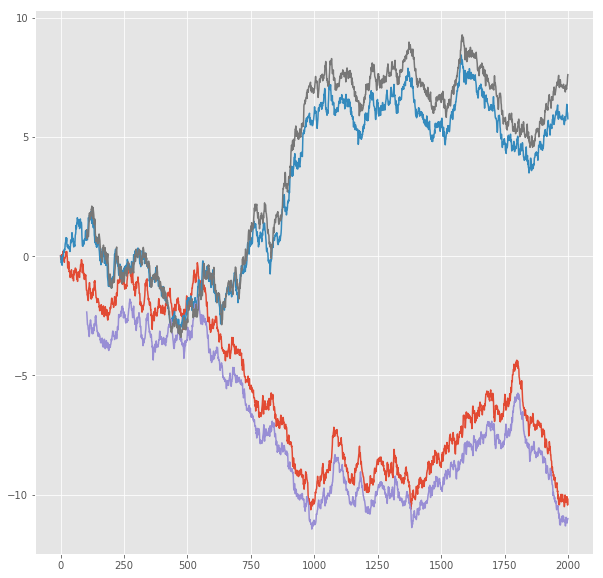

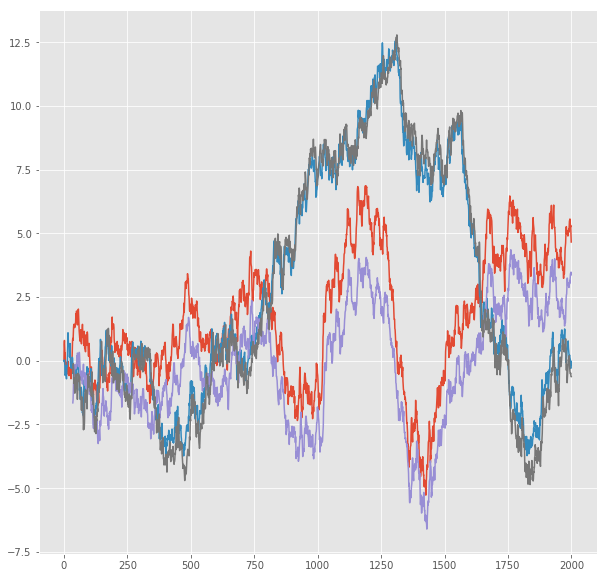

R^2 score for regression on Error: 0.6968
k = 0.9984


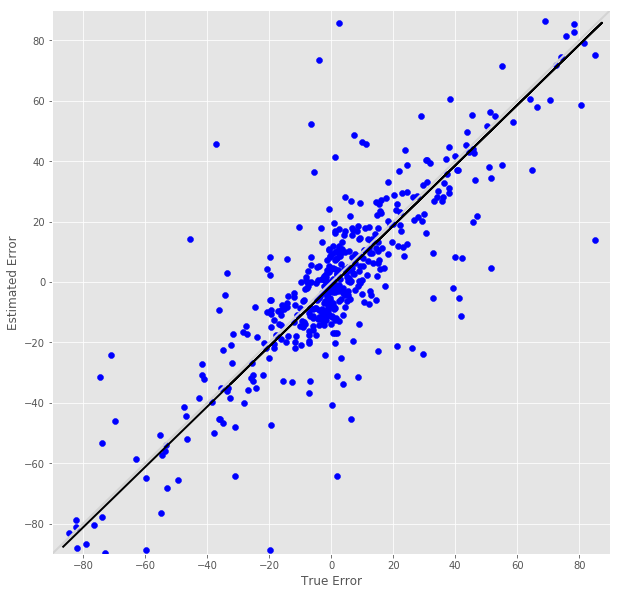

R^2 score for regression on RT: 0.4028
k = 0.6732


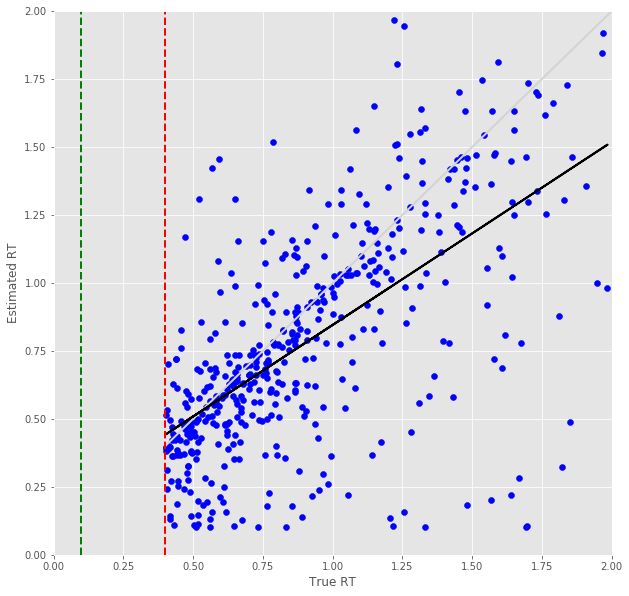

Error Prediction Score: 0.3244 RMSE
RT Prediction Score: 0.2675 RMSE
Error Prediction Corr: 0.8088
RT Prediction Corr: 0.8111
R^2 score for regression on Error: 0.6541
k = 0.9705


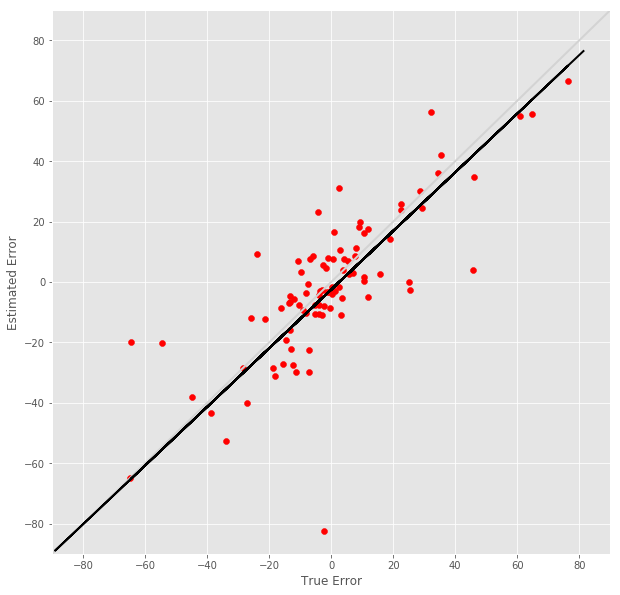

R^2 score for regression on RT: 0.6579
k = 0.8961


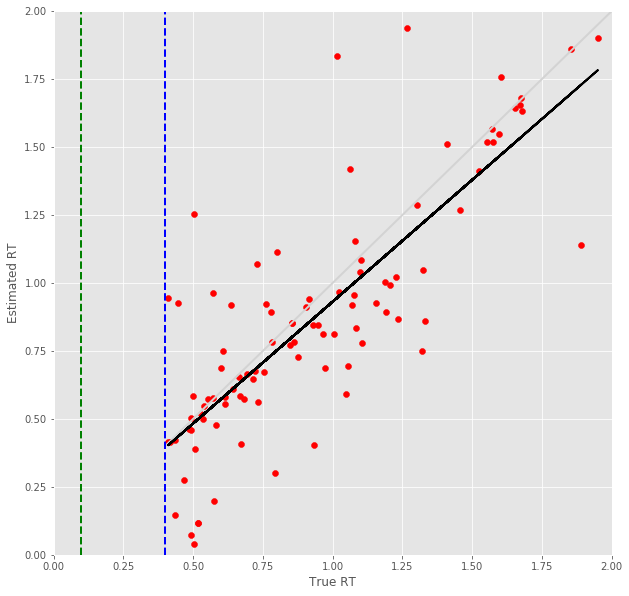

5 -step(s) forecast:
Test Score for 5 -steps forecast: 1.8786 RMSE
Predict Score for 5 -steps forecast: 1.8179 RMSE
Error Test Score for 5 -steps forecast: 0.3855 RMSE
RT Test Score for 5 -steps forecast: 0.4149 RMSE
Error Test Corr for 5 -steps forecast: 0.7999
RT Test Corr for 5 -steps forecast: 0.5379


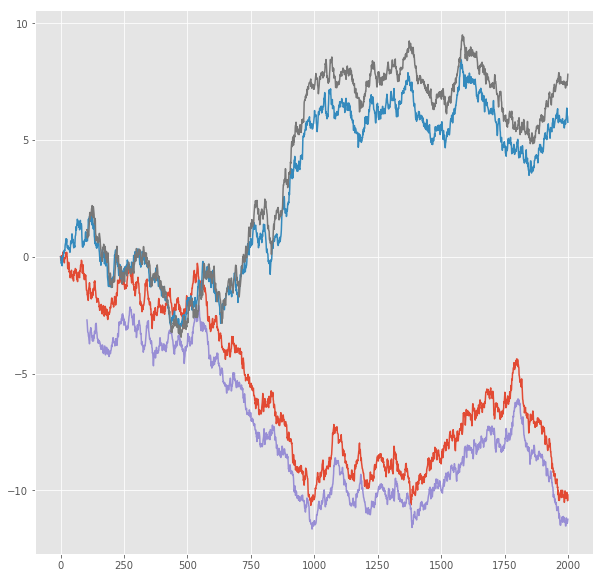

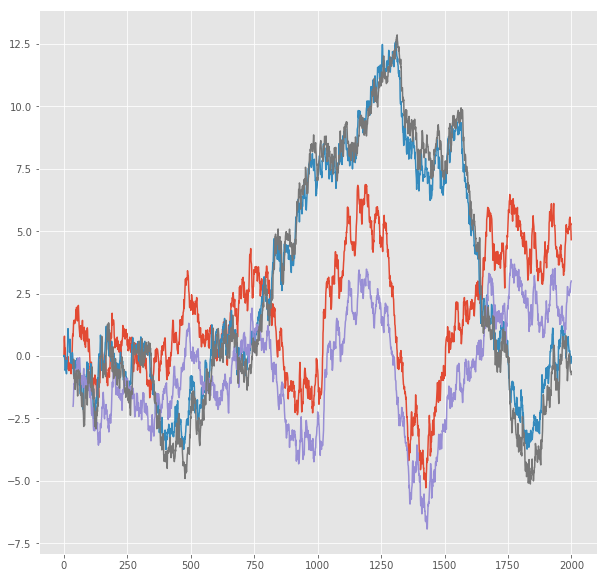

R^2 score for regression on Error: 0.6398
k = 0.9881


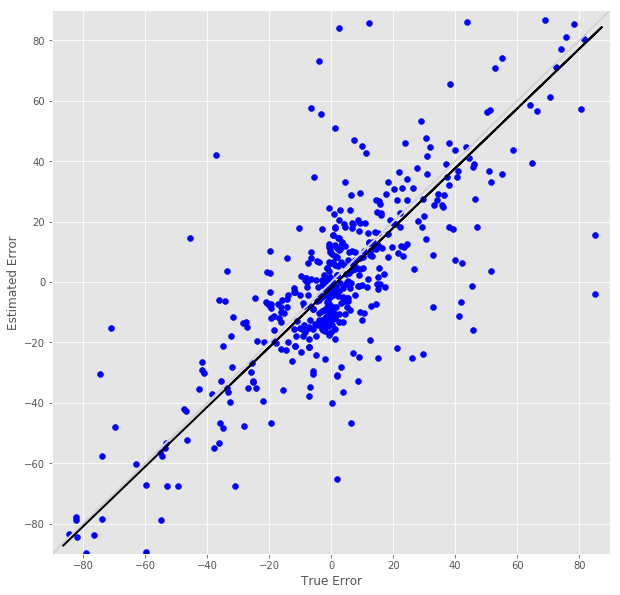

R^2 score for regression on RT: 0.2894
k = 0.5870


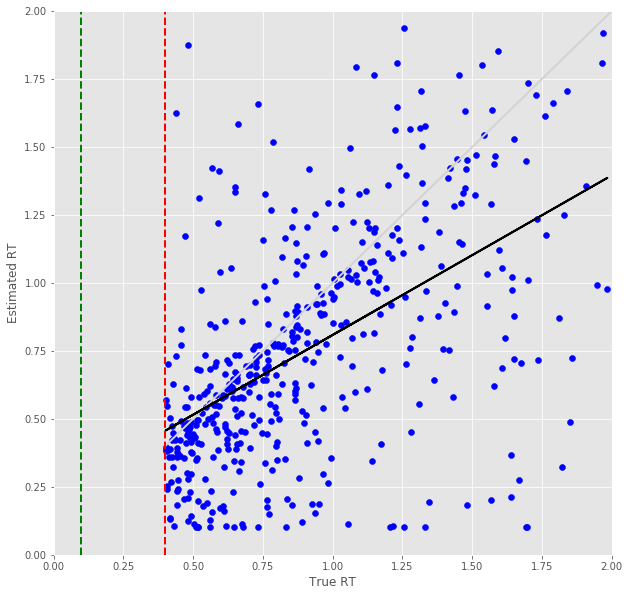

Error Prediction Score: 0.3582 RMSE
RT Prediction Score: 0.3336 RMSE
Error Prediction Corr: 0.7771
RT Prediction Corr: 0.7292
R^2 score for regression on Error: 0.6038
k = 0.9580


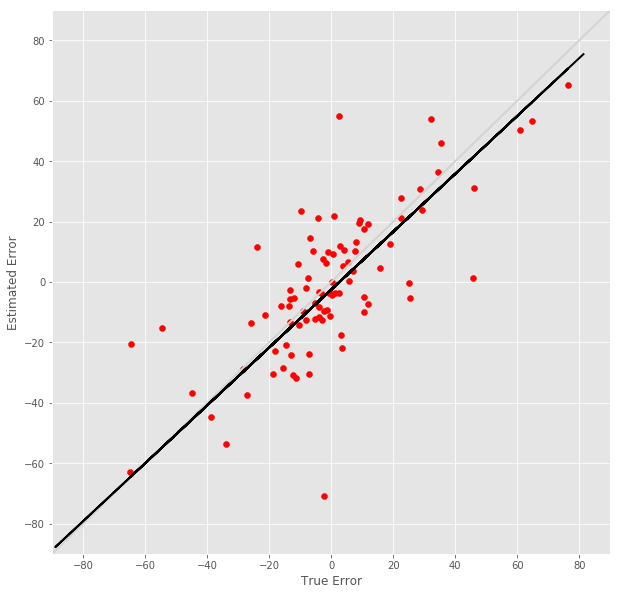

R^2 score for regression on RT: 0.5317
k = 0.8225


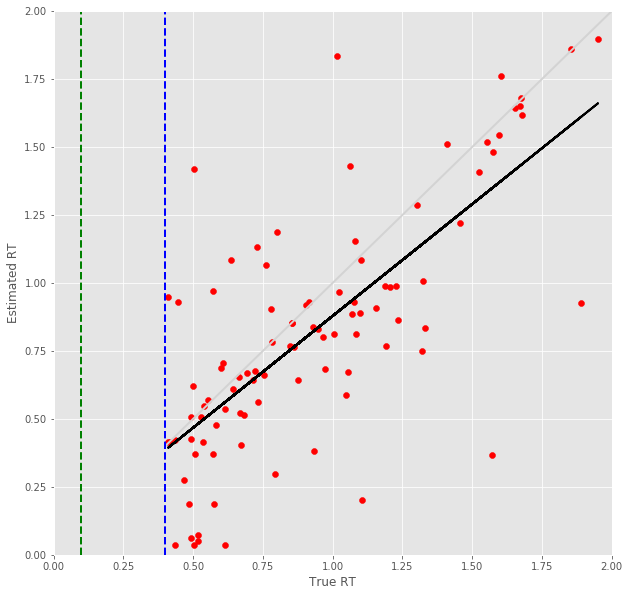

6 -step(s) forecast:
Test Score for 6 -steps forecast: 2.1819 RMSE
Predict Score for 6 -steps forecast: 2.1163 RMSE
Error Test Score for 6 -steps forecast: 0.4056 RMSE
RT Test Score for 6 -steps forecast: 0.4597 RMSE
Error Test Corr for 6 -steps forecast: 0.7799
RT Test Corr for 6 -steps forecast: 0.4764


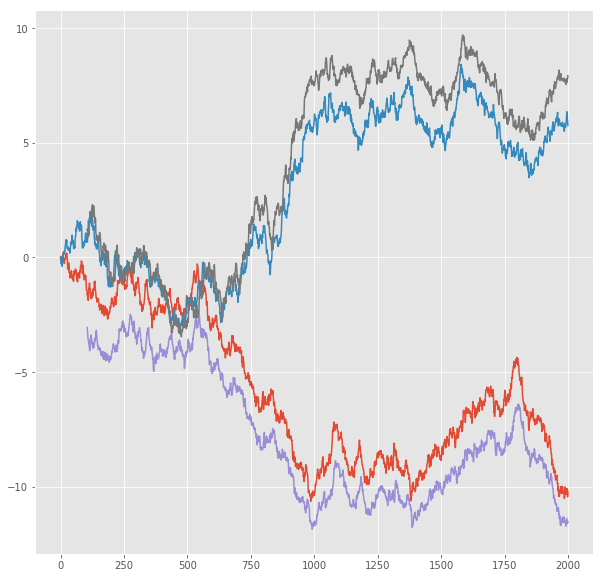

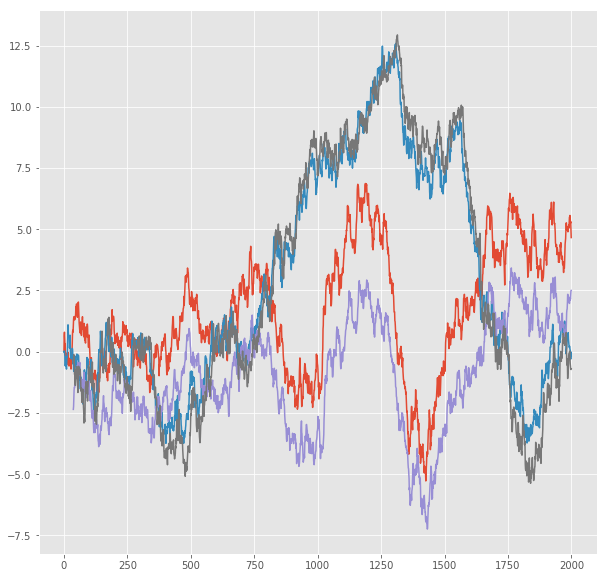

R^2 score for regression on Error: 0.6082
k = 0.9732


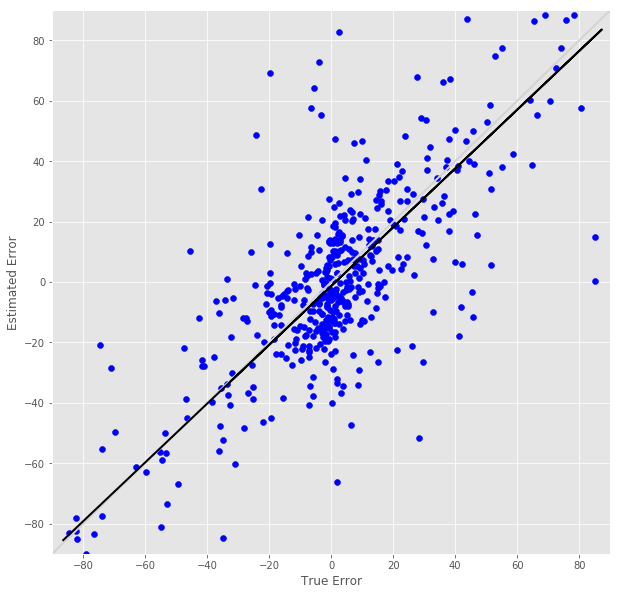

R^2 score for regression on RT: 0.2270
k = 0.5427


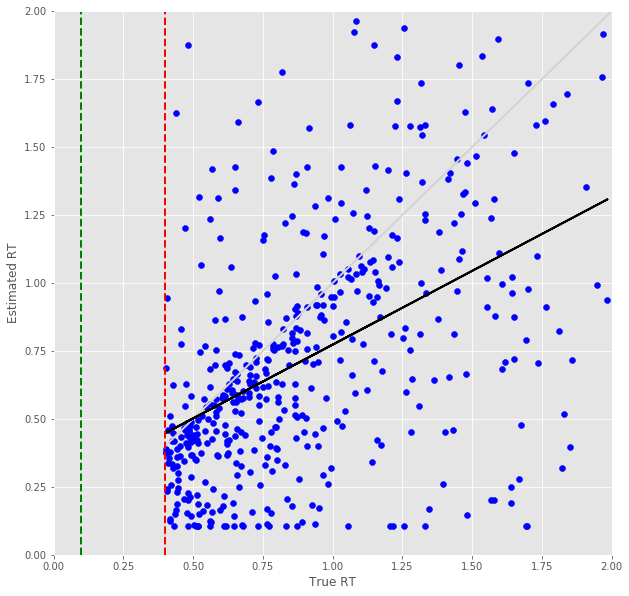

Error Prediction Score: 0.3701 RMSE
RT Prediction Score: 0.3582 RMSE
Error Prediction Corr: 0.7668
RT Prediction Corr: 0.6942
R^2 score for regression on Error: 0.5880
k = 0.9596


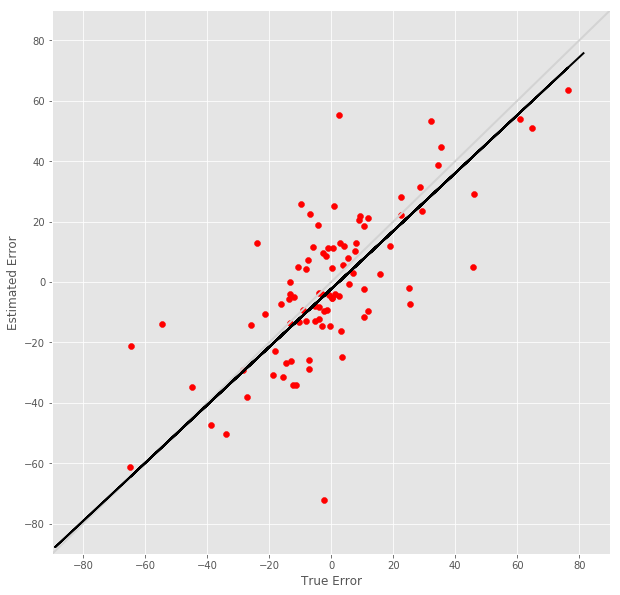

R^2 score for regression on RT: 0.4819
k = 0.7908


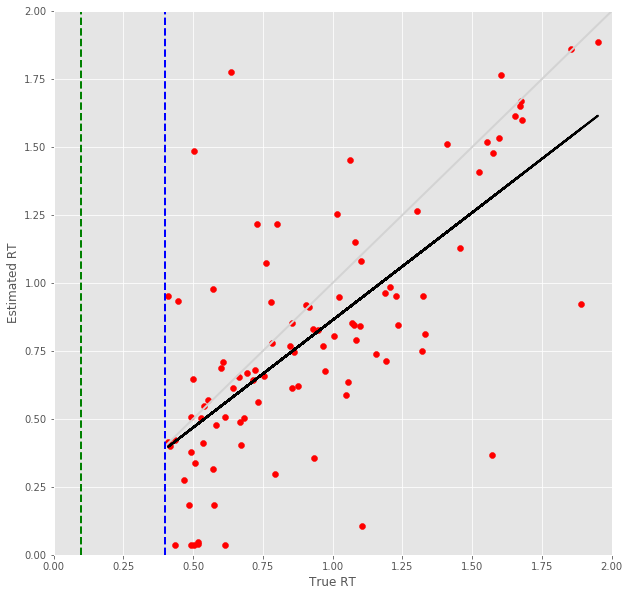

7 -step(s) forecast:
Test Score for 7 -steps forecast: 2.4757 RMSE
Predict Score for 7 -steps forecast: 2.4062 RMSE
Error Test Score for 7 -steps forecast: 0.4433 RMSE
RT Test Score for 7 -steps forecast: 0.5040 RMSE
Error Test Corr for 7 -steps forecast: 0.7544
RT Test Corr for 7 -steps forecast: 0.4131


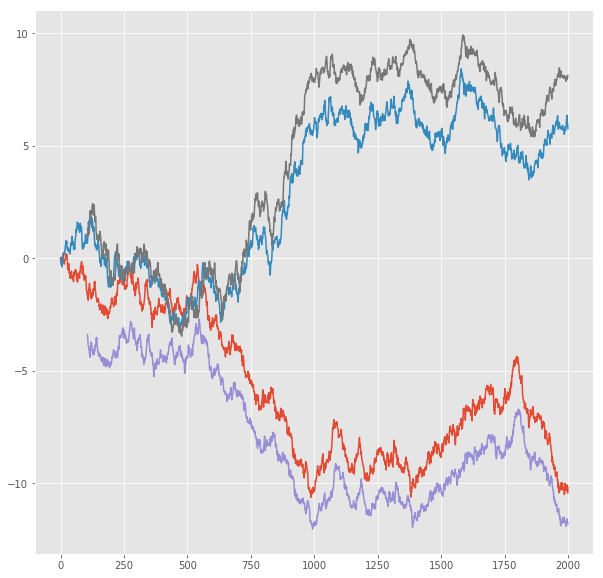

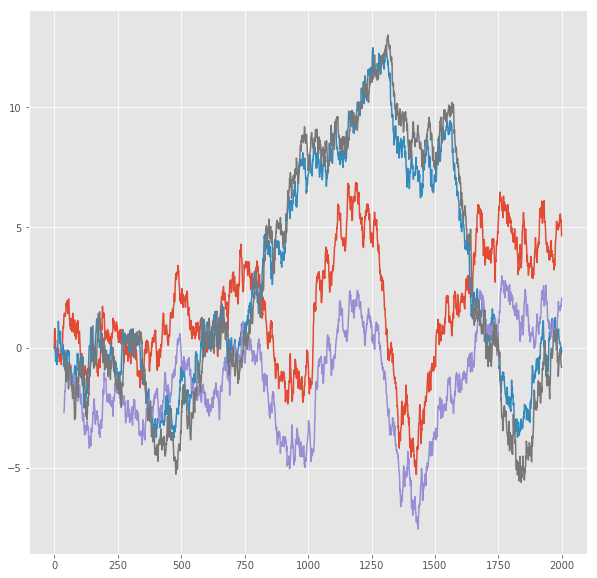

R^2 score for regression on Error: 0.5692
k = 0.9810


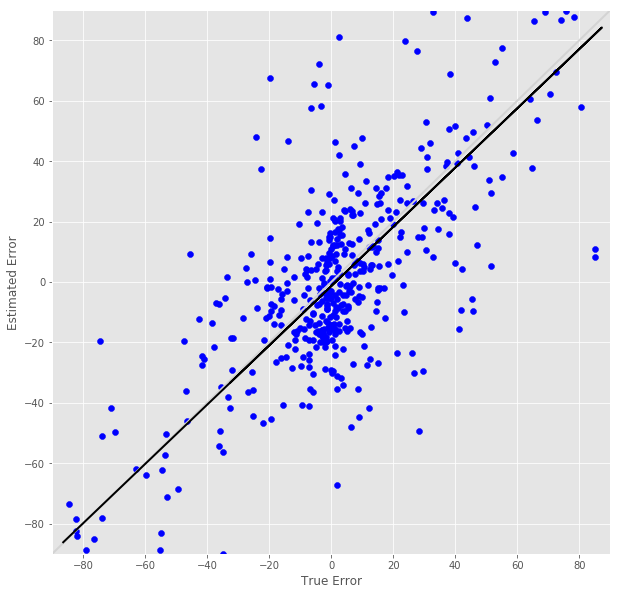

R^2 score for regression on RT: 0.1707
k = 0.4745


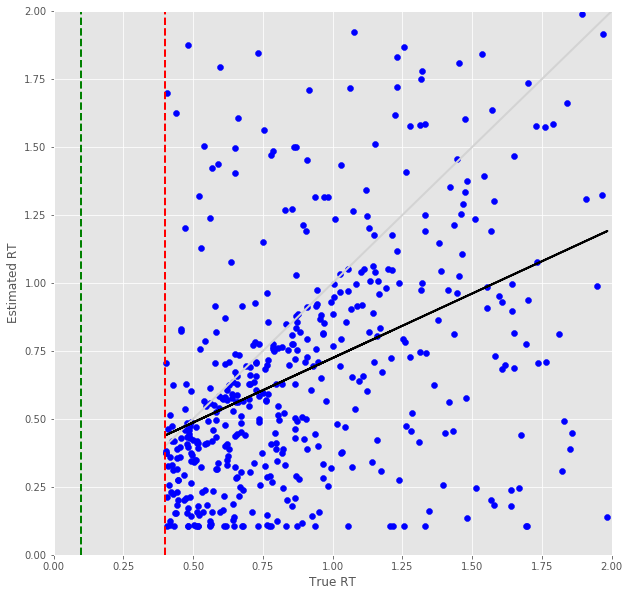

Error Prediction Score: 0.4311 RMSE
RT Prediction Score: 0.4294 RMSE
Error Prediction Corr: 0.7495
RT Prediction Corr: 0.6015
R^2 score for regression on Error: 0.5618
k = 1.0637


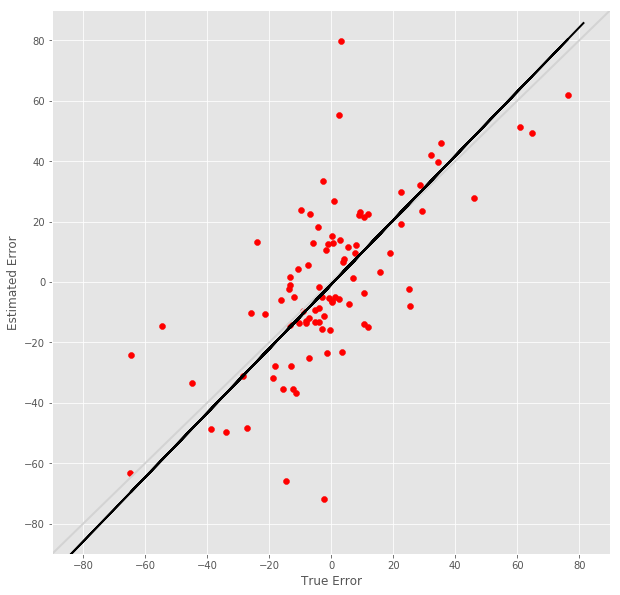

R^2 score for regression on RT: 0.3618
k = 0.7306


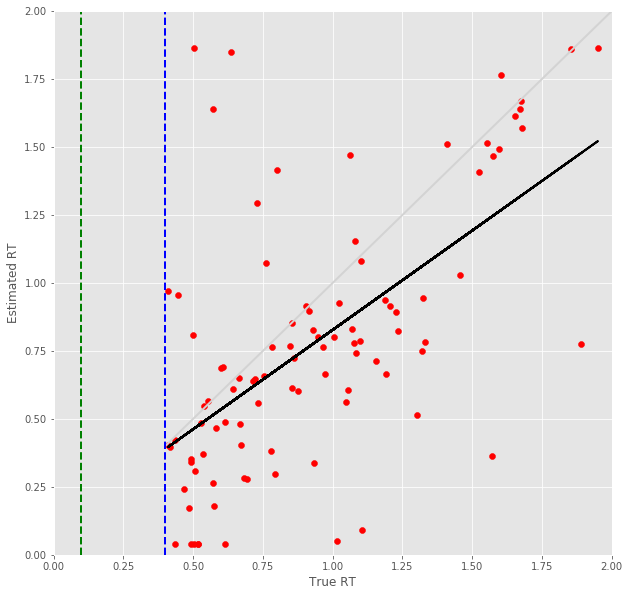

8 -step(s) forecast:
Test Score for 8 -steps forecast: 2.7643 RMSE
Predict Score for 8 -steps forecast: 2.6916 RMSE
Error Test Score for 8 -steps forecast: 0.4766 RMSE
RT Test Score for 8 -steps forecast: 0.5397 RMSE
Error Test Corr for 8 -steps forecast: 0.7377
RT Test Corr for 8 -steps forecast: 0.3653


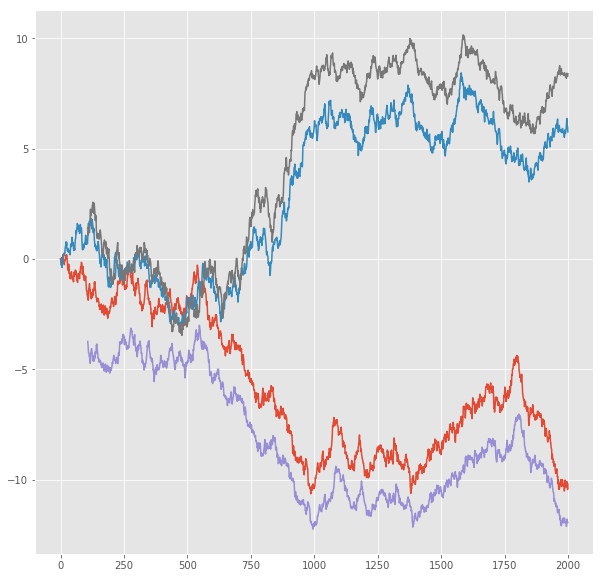

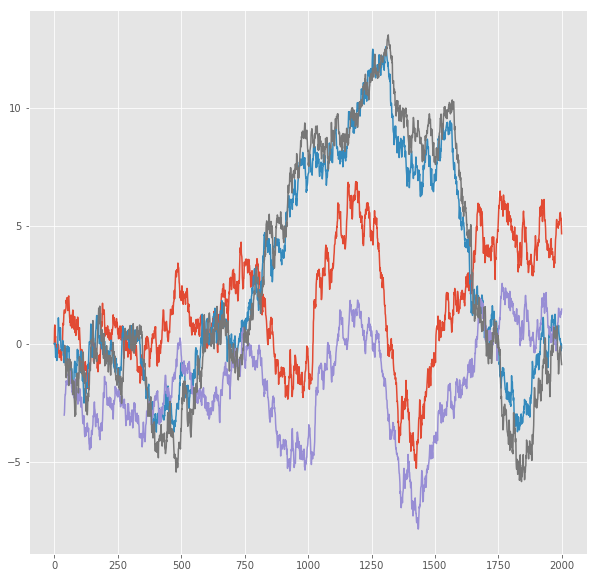

R^2 score for regression on Error: 0.5441
k = 1.0064


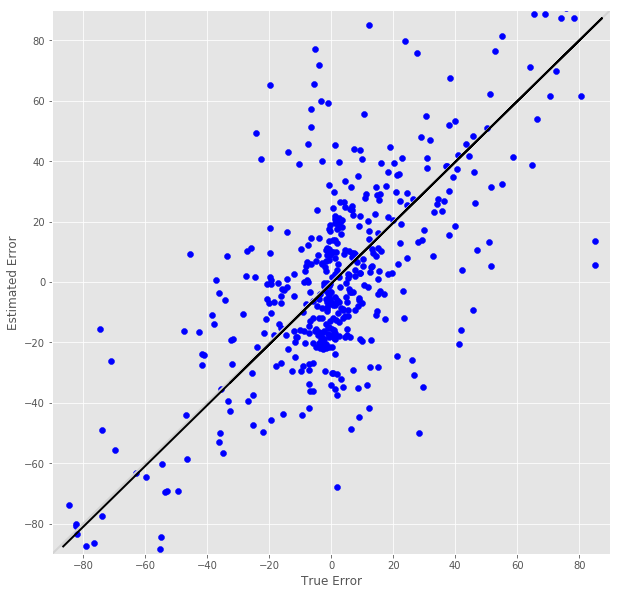

R^2 score for regression on RT: 0.1335
k = 0.4147


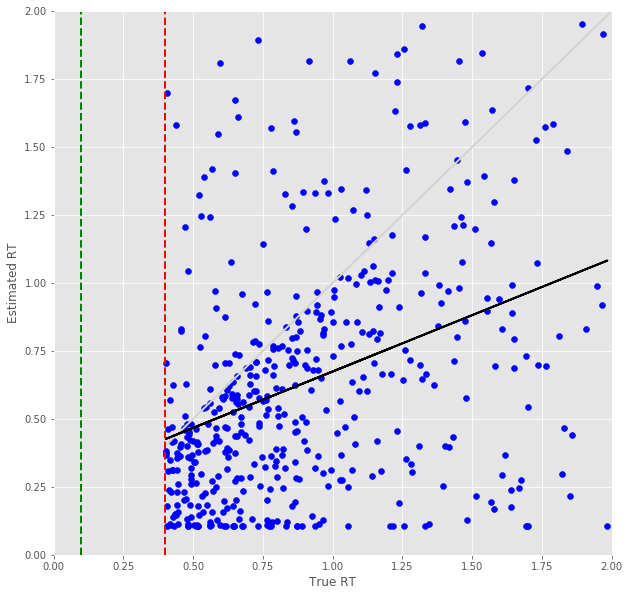

Error Prediction Score: 0.4877 RMSE
RT Prediction Score: 0.4891 RMSE
Error Prediction Corr: 0.7037
RT Prediction Corr: 0.5280
R^2 score for regression on Error: 0.4952
k = 1.0451


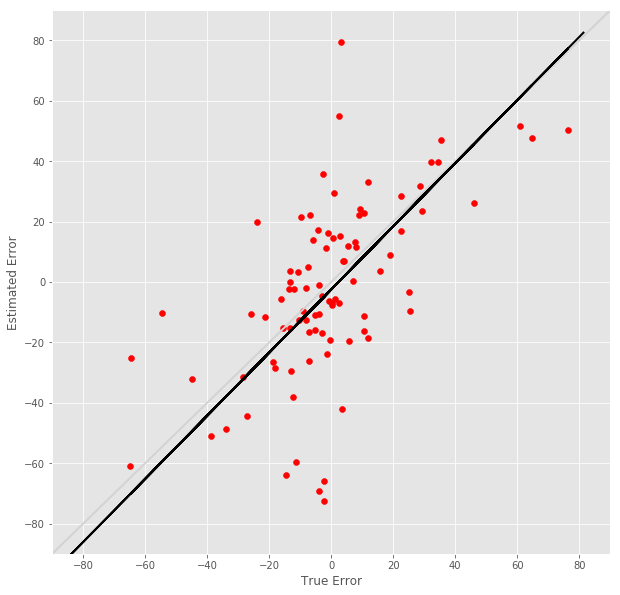

R^2 score for regression on RT: 0.2788
k = 0.6362


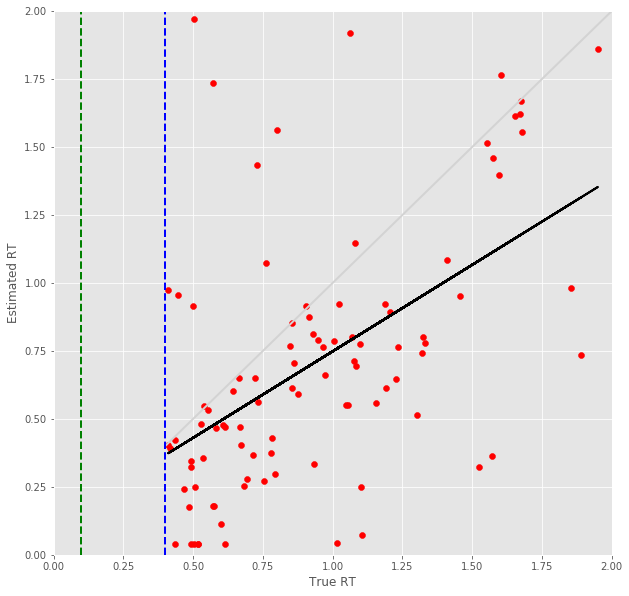

9 -step(s) forecast:
Test Score for 9 -steps forecast: 3.0496 RMSE
Predict Score for 9 -steps forecast: 2.9741 RMSE
Error Test Score for 9 -steps forecast: 0.5238 RMSE
RT Test Score for 9 -steps forecast: 0.5764 RMSE
Error Test Corr for 9 -steps forecast: 0.7071
RT Test Corr for 9 -steps forecast: 0.3463


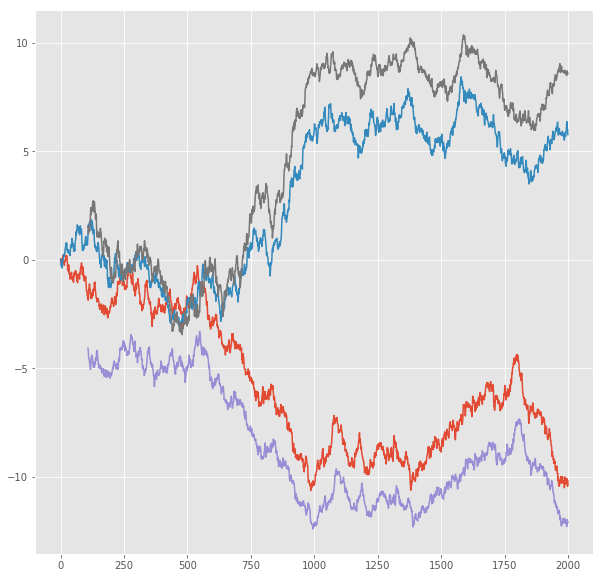

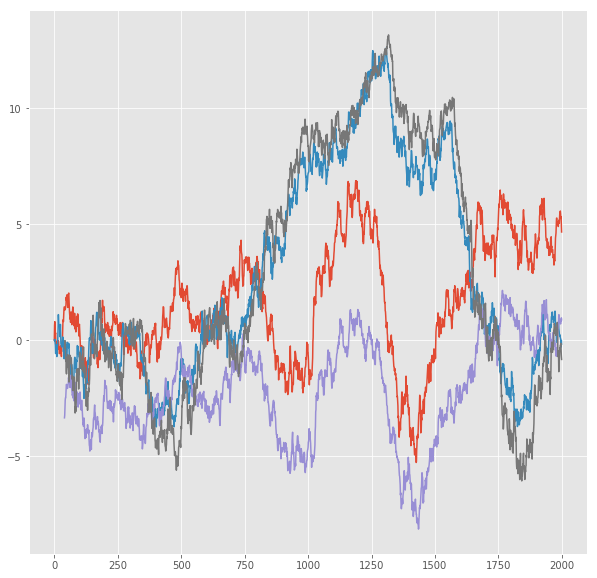

R^2 score for regression on Error: 0.5000
k = 1.0076


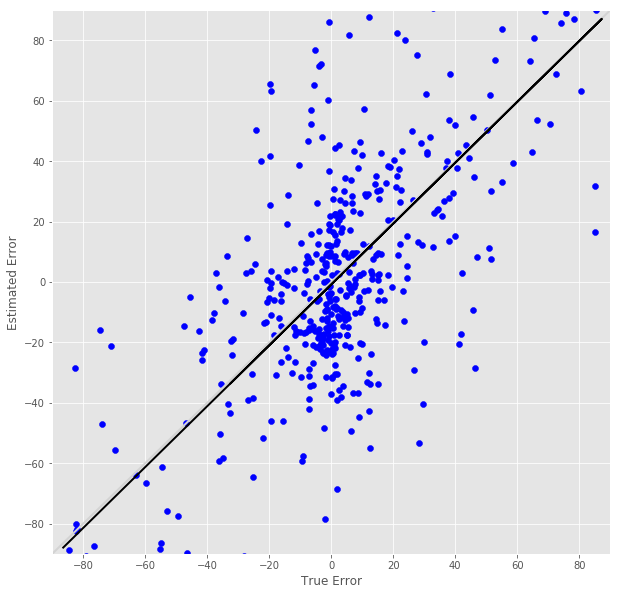

R^2 score for regression on RT: 0.1199
k = 0.3947


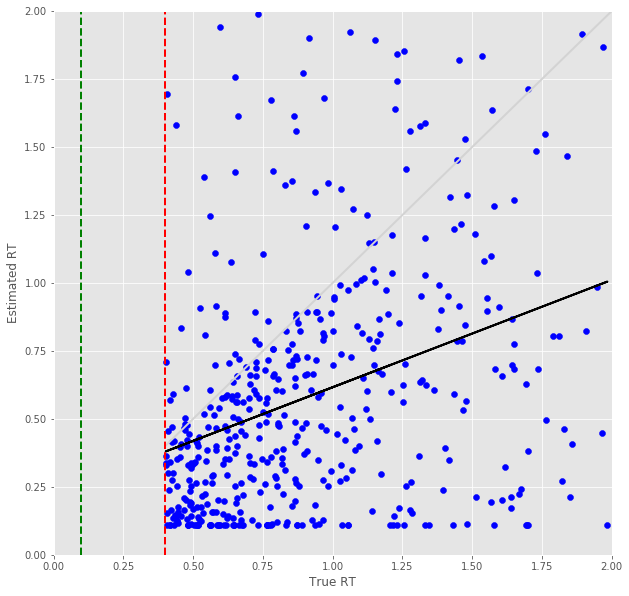

Error Prediction Score: 0.5295 RMSE
RT Prediction Score: 0.5383 RMSE
Error Prediction Corr: 0.6669
RT Prediction Corr: 0.4622
R^2 score for regression on Error: 0.4447
k = 1.0157


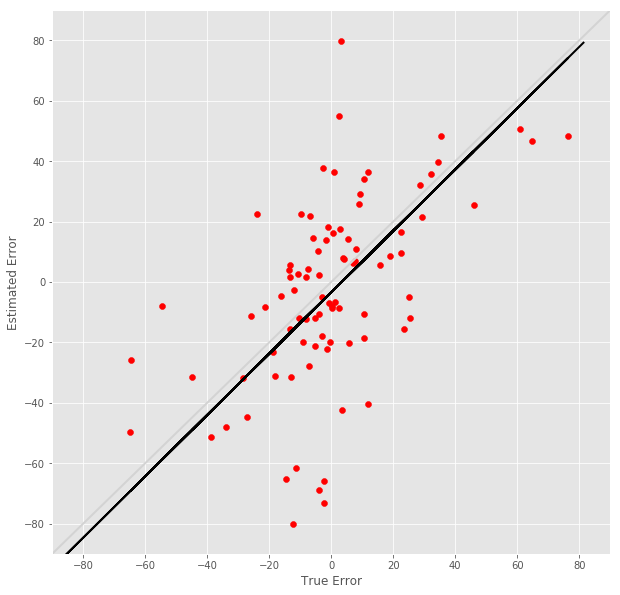

R^2 score for regression on RT: 0.2137
k = 0.4932


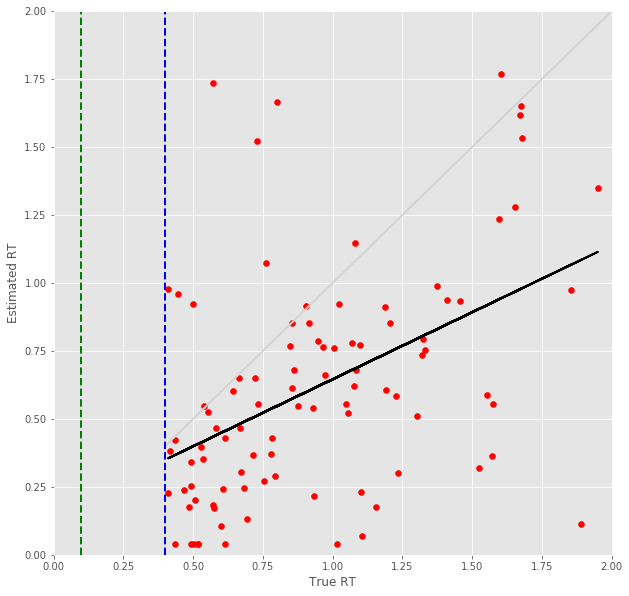

10 -step(s) forecast:
Test Score for 10 -steps forecast: 3.3323 RMSE
Predict Score for 10 -steps forecast: 3.2543 RMSE
Error Test Score for 10 -steps forecast: 0.5698 RMSE
RT Test Score for 10 -steps forecast: 0.5954 RMSE
Error Test Corr for 10 -steps forecast: 0.6812
RT Test Corr for 10 -steps forecast: 0.3479


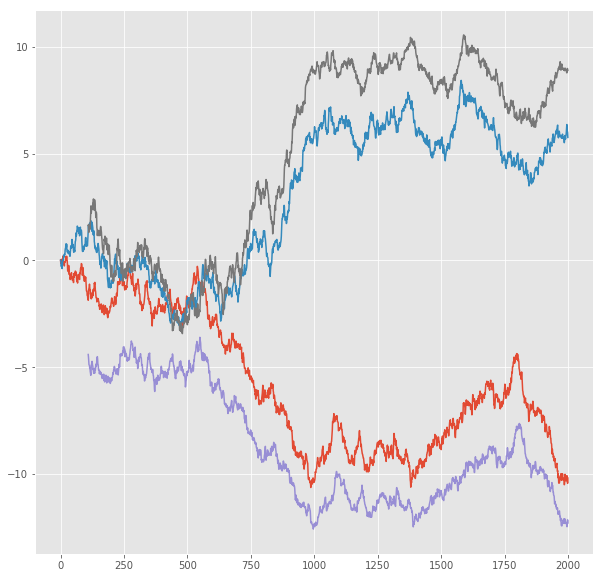

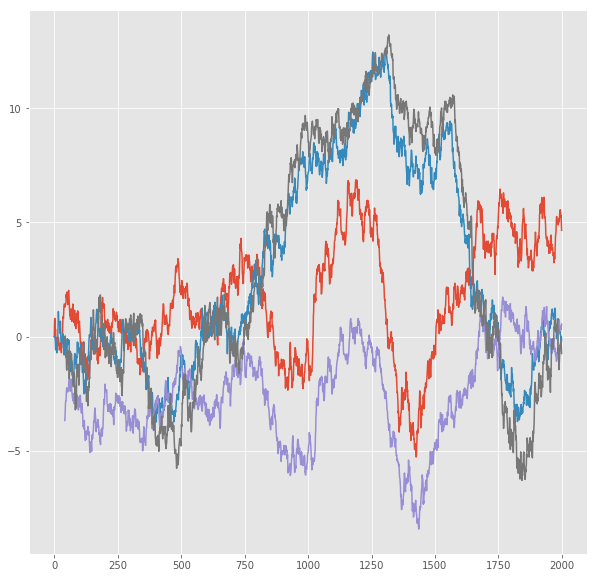

R^2 score for regression on Error: 0.4641
k = 1.0171


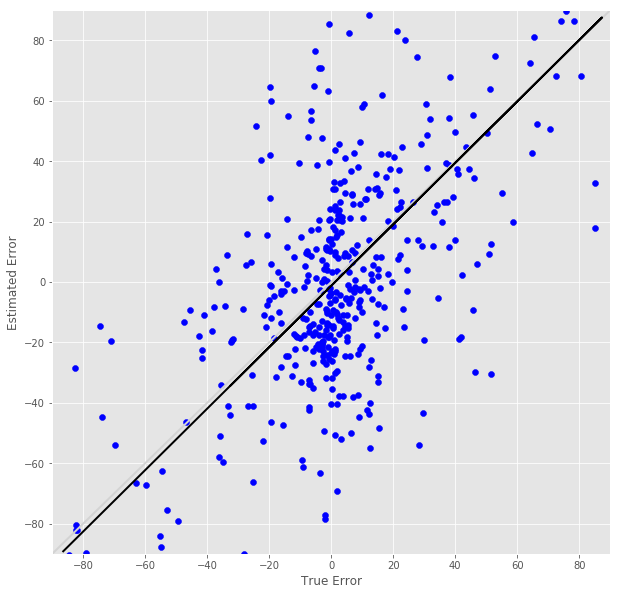

R^2 score for regression on RT: 0.1211
k = 0.3818


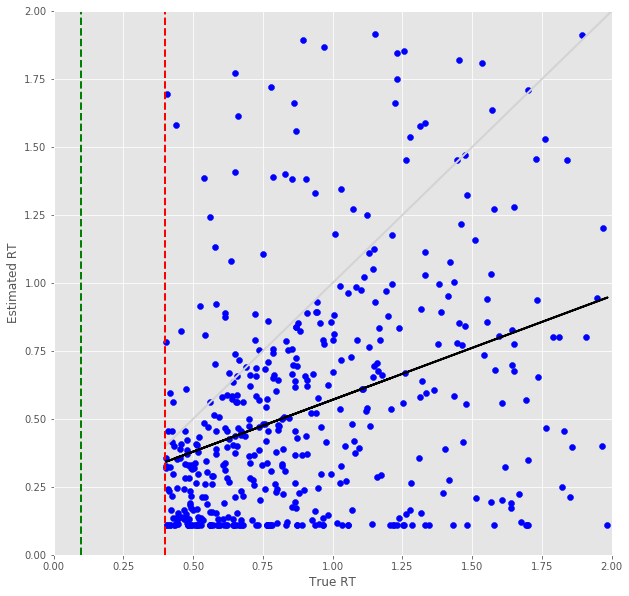

Error Prediction Score: 0.5452 RMSE
RT Prediction Score: 0.5858 RMSE
Error Prediction Corr: 0.6575
RT Prediction Corr: 0.3943
R^2 score for regression on Error: 0.4323
k = 1.0223


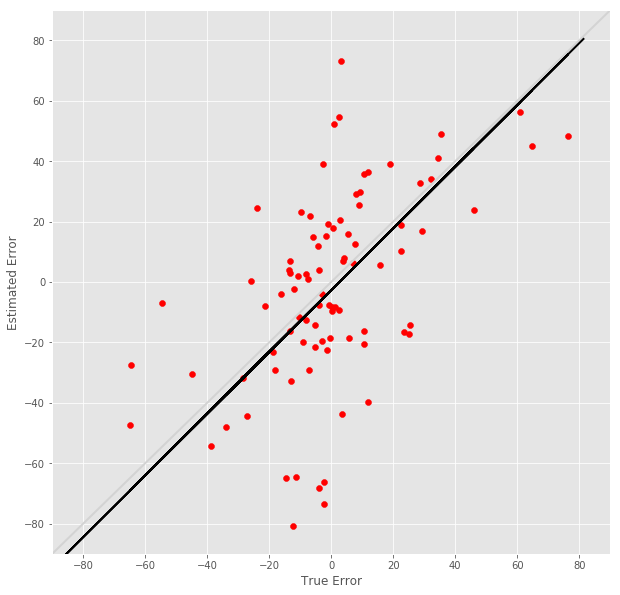

R^2 score for regression on RT: 0.1555
k = 0.4252


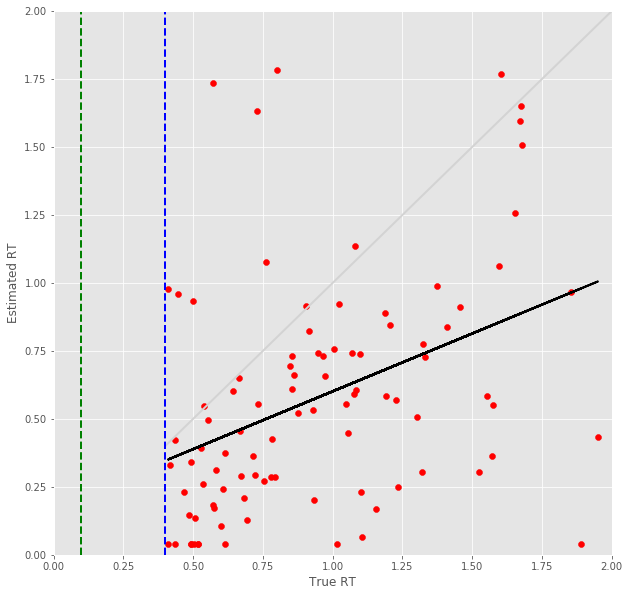

11 -step(s) forecast:
Test Score for 11 -steps forecast: 3.6124 RMSE
Predict Score for 11 -steps forecast: 3.5321 RMSE
Error Test Score for 11 -steps forecast: 0.5988 RMSE
RT Test Score for 11 -steps forecast: 0.6226 RMSE
Error Test Corr for 11 -steps forecast: 0.6612
RT Test Corr for 11 -steps forecast: 0.3359


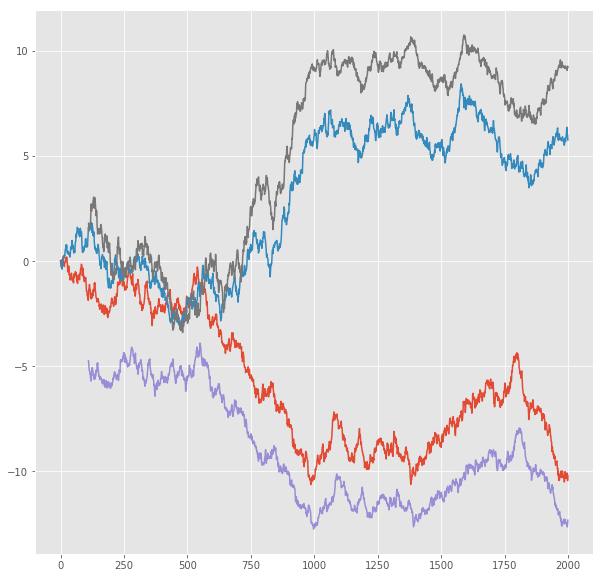

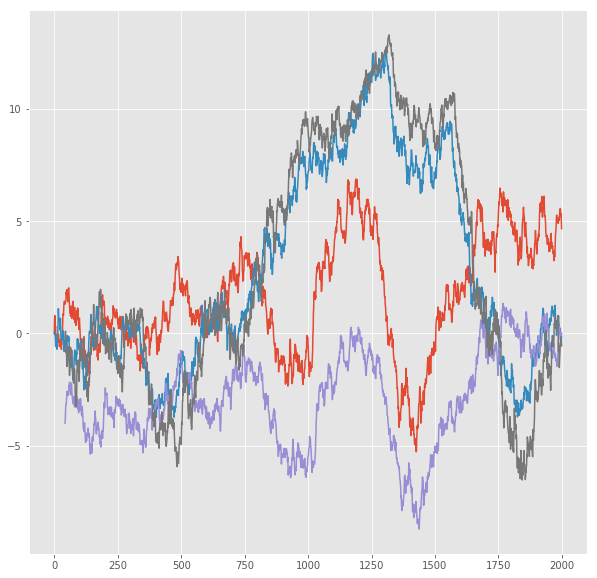

R^2 score for regression on Error: 0.4372
k = 1.0123


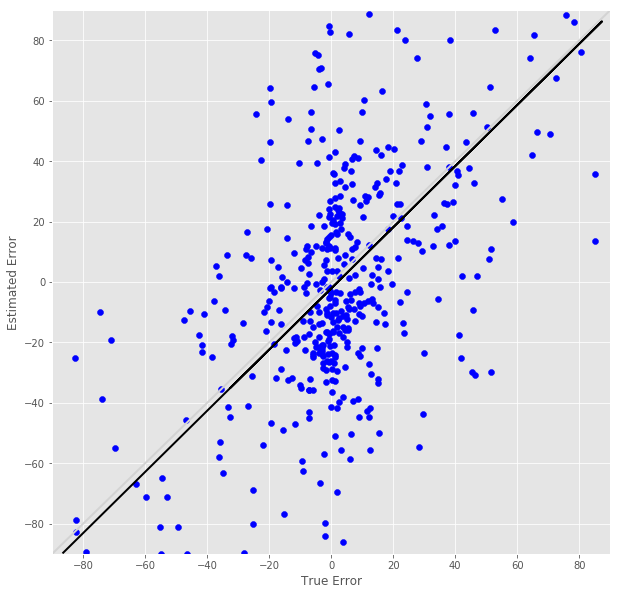

R^2 score for regression on RT: 0.1128
k = 0.3680


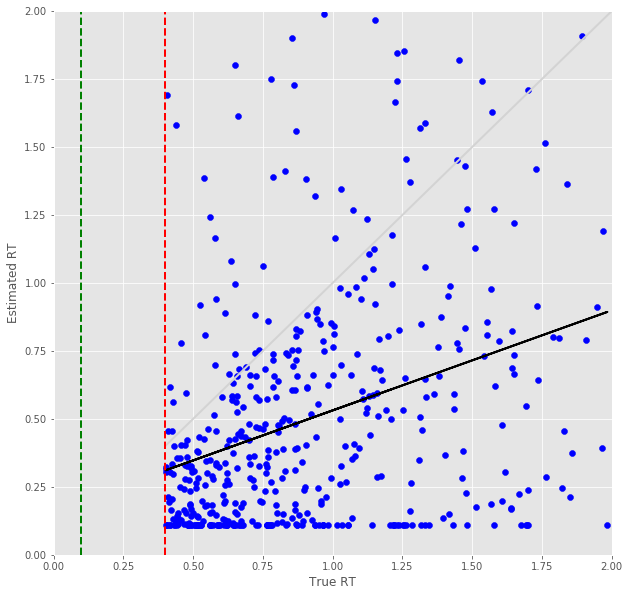

Error Prediction Score: 0.5728 RMSE
RT Prediction Score: 0.6097 RMSE
Error Prediction Corr: 0.6208
RT Prediction Corr: 0.3598
R^2 score for regression on Error: 0.3854
k = 0.9745


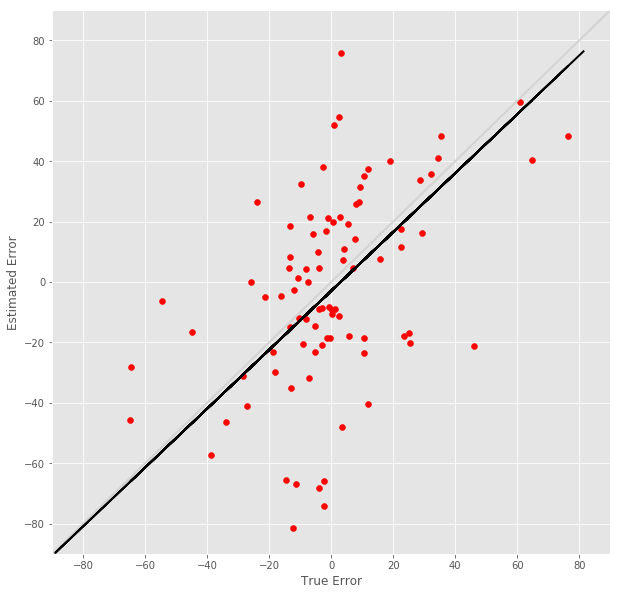

R^2 score for regression on RT: 0.1294
k = 0.3769


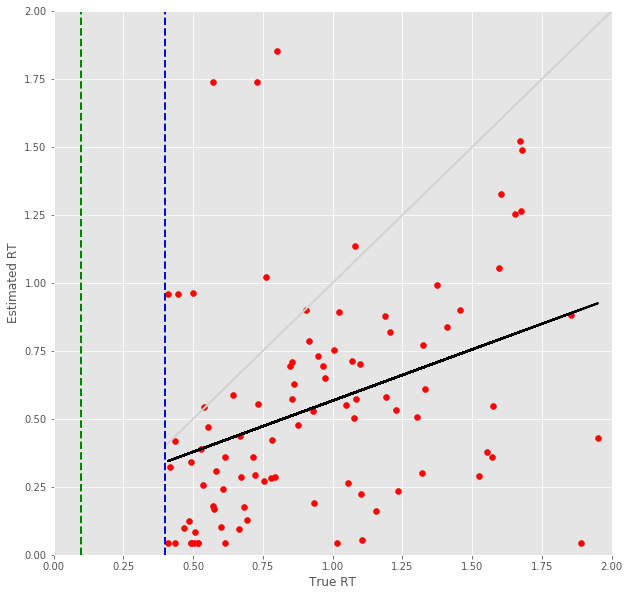

12 -step(s) forecast:
Test Score for 12 -steps forecast: 3.8898 RMSE
Predict Score for 12 -steps forecast: 3.8072 RMSE
Error Test Score for 12 -steps forecast: 0.6351 RMSE
RT Test Score for 12 -steps forecast: 0.6466 RMSE
Error Test Corr for 12 -steps forecast: 0.6427
RT Test Corr for 12 -steps forecast: 0.3411


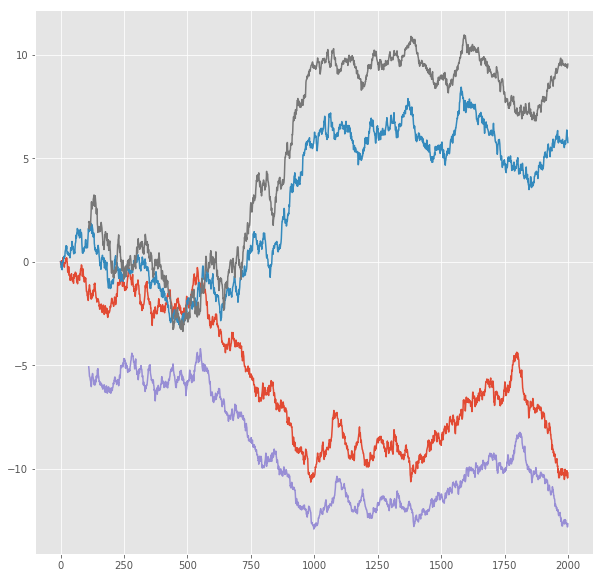

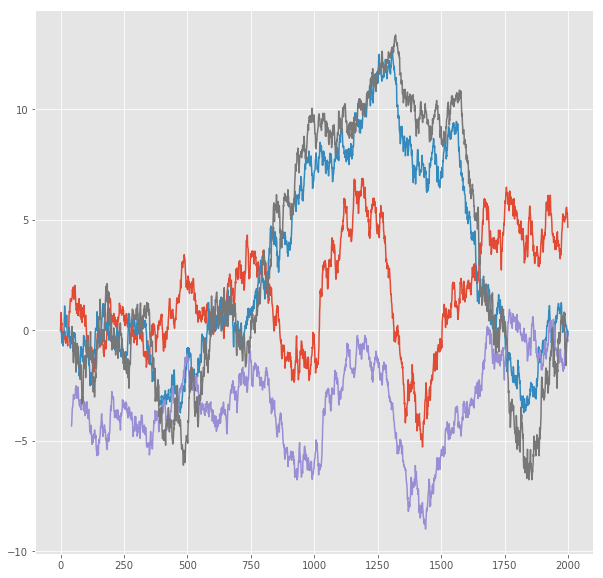

R^2 score for regression on Error: 0.4130
k = 1.0234


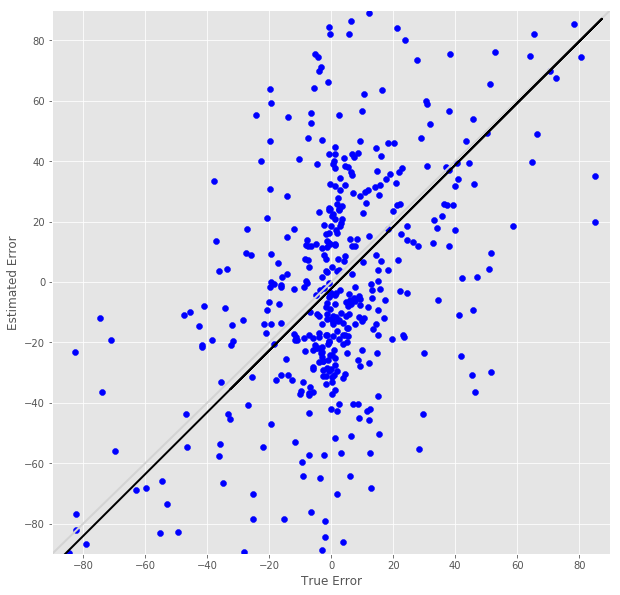

R^2 score for regression on RT: 0.1163
k = 0.3526


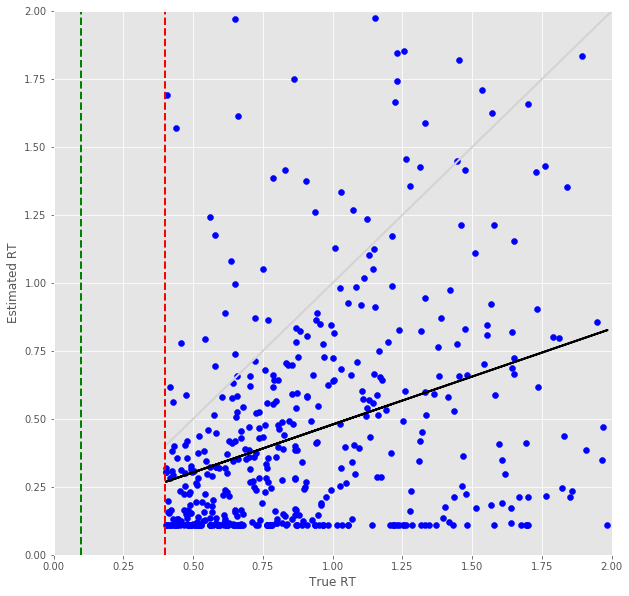

Error Prediction Score: 0.5856 RMSE
RT Prediction Score: 0.6207 RMSE
Error Prediction Corr: 0.6268
RT Prediction Corr: 0.3988
R^2 score for regression on Error: 0.3928
k = 1.0078


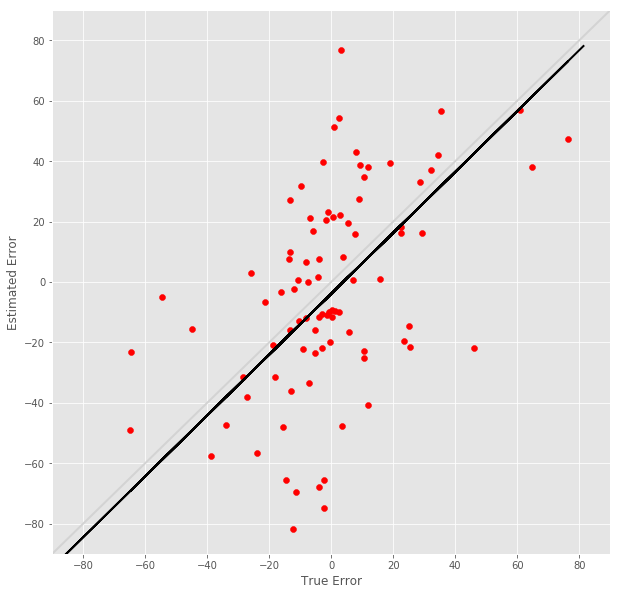

R^2 score for regression on RT: 0.1590
k = 0.3848


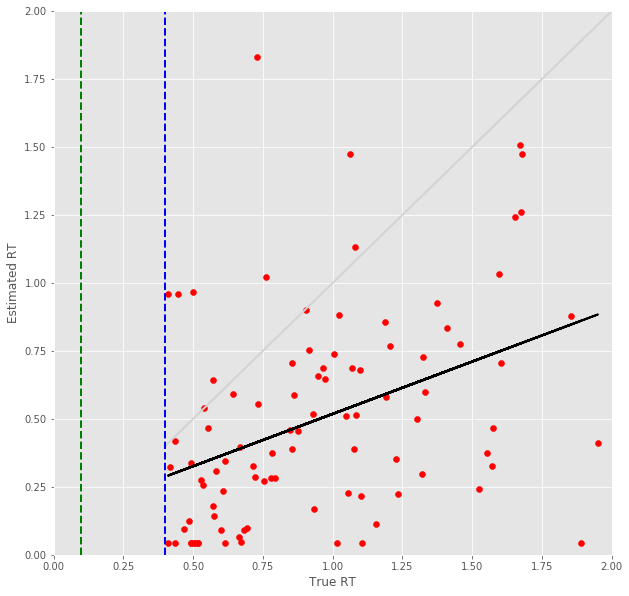

13 -step(s) forecast:
Test Score for 13 -steps forecast: 4.1641 RMSE
Predict Score for 13 -steps forecast: 4.0793 RMSE
Error Test Score for 13 -steps forecast: 0.6689 RMSE
RT Test Score for 13 -steps forecast: 0.6734 RMSE
Error Test Corr for 13 -steps forecast: 0.6332
RT Test Corr for 13 -steps forecast: 0.3197


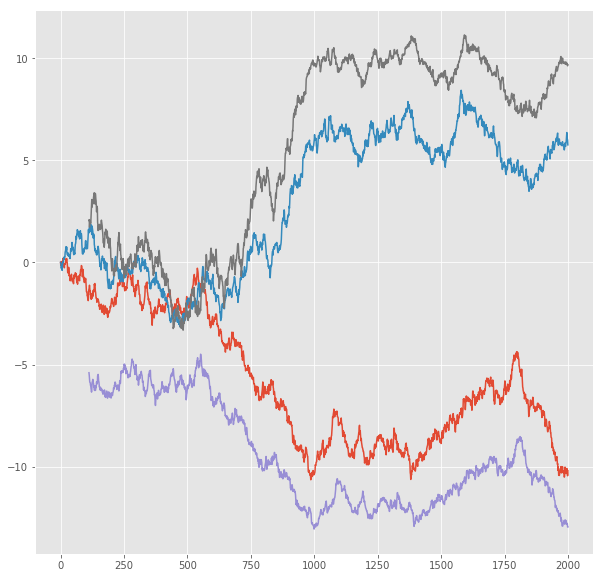

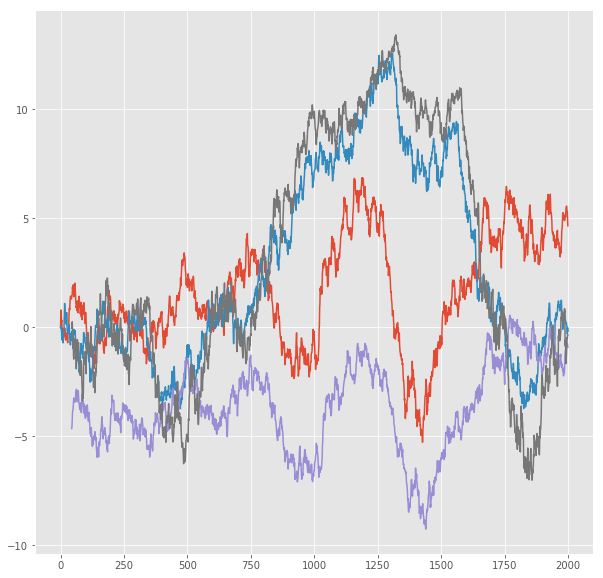

R^2 score for regression on Error: 0.4009
k = 1.0496


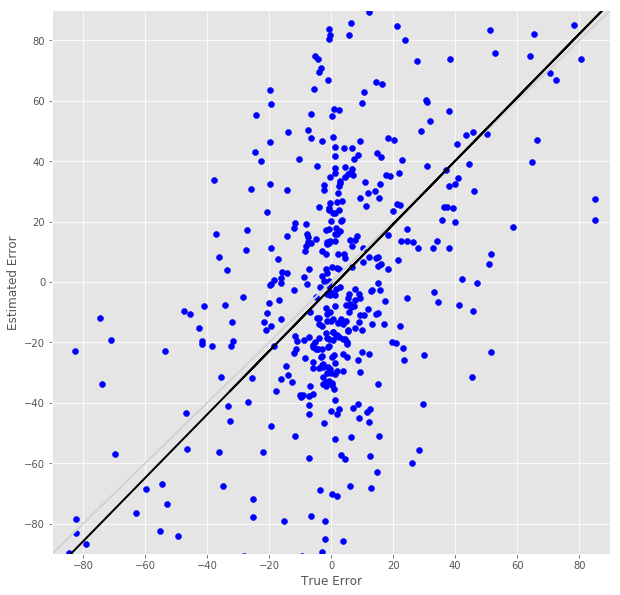

R^2 score for regression on RT: 0.1022
k = 0.3211


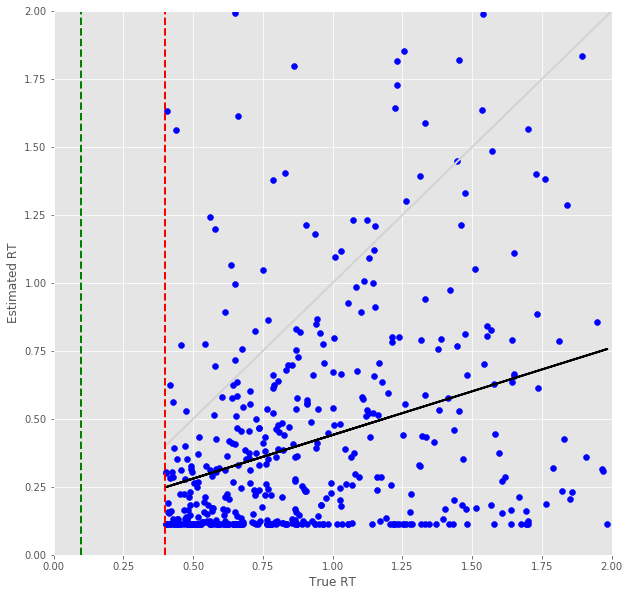

Error Prediction Score: 0.6480 RMSE
RT Prediction Score: 0.6710 RMSE
Error Prediction Corr: 0.5983
RT Prediction Corr: 0.3219
R^2 score for regression on Error: 0.3579
k = 1.0491


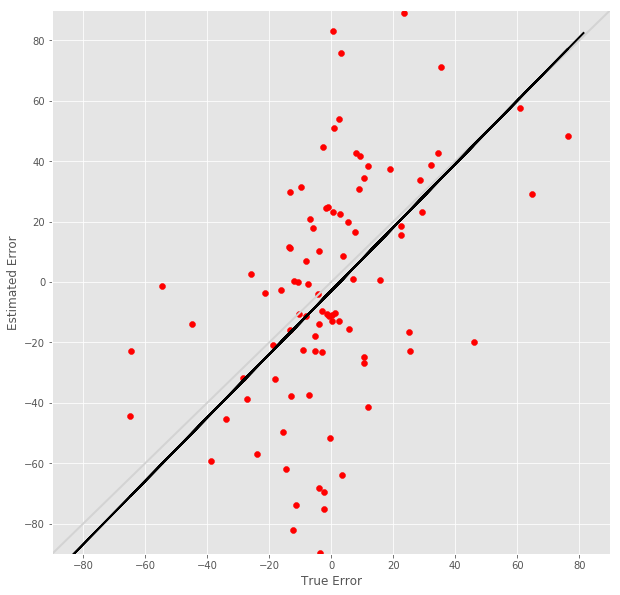

R^2 score for regression on RT: 0.1036
k = 0.3183


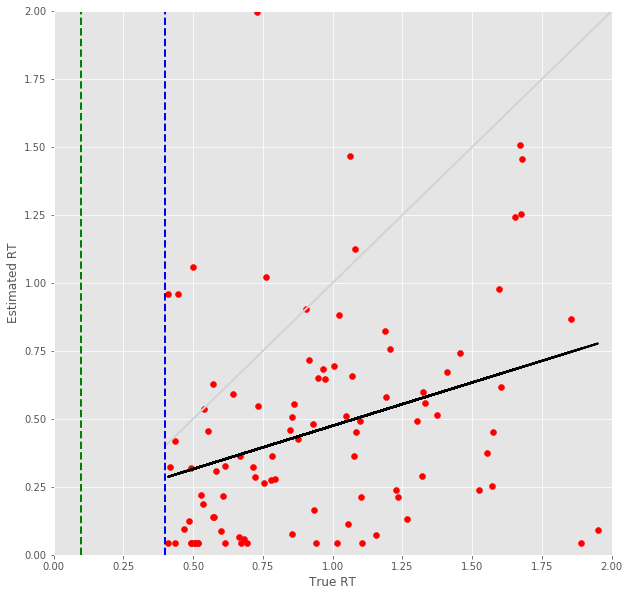

14 -step(s) forecast:
Test Score for 14 -steps forecast: 4.4352 RMSE
Predict Score for 14 -steps forecast: 4.3483 RMSE
Error Test Score for 14 -steps forecast: 0.6913 RMSE
RT Test Score for 14 -steps forecast: 0.6893 RMSE
Error Test Corr for 14 -steps forecast: 0.6201
RT Test Corr for 14 -steps forecast: 0.3256


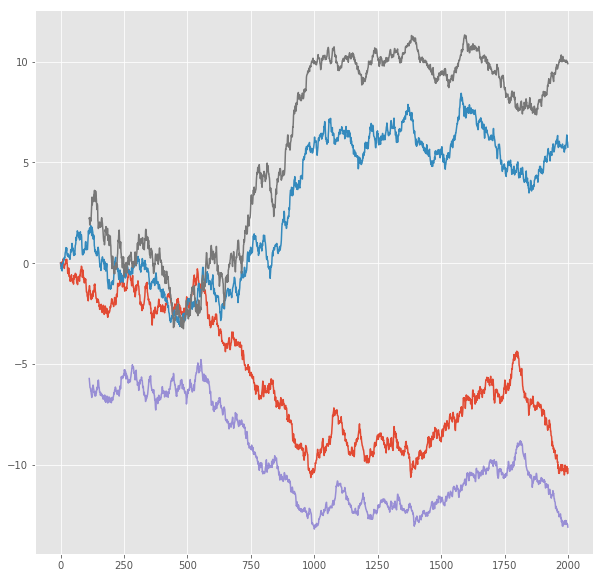

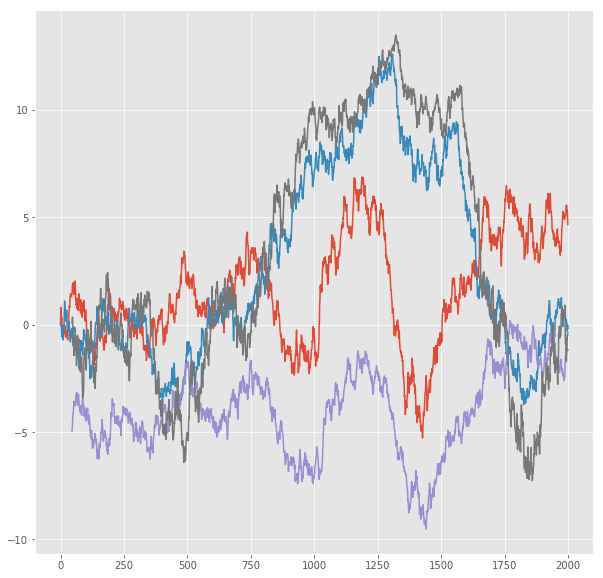

R^2 score for regression on Error: 0.3845
k = 1.0488


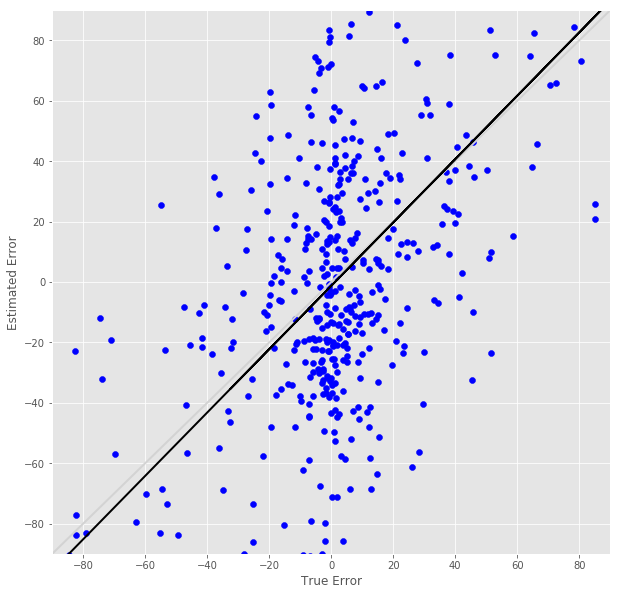

R^2 score for regression on RT: 0.1060
k = 0.3087


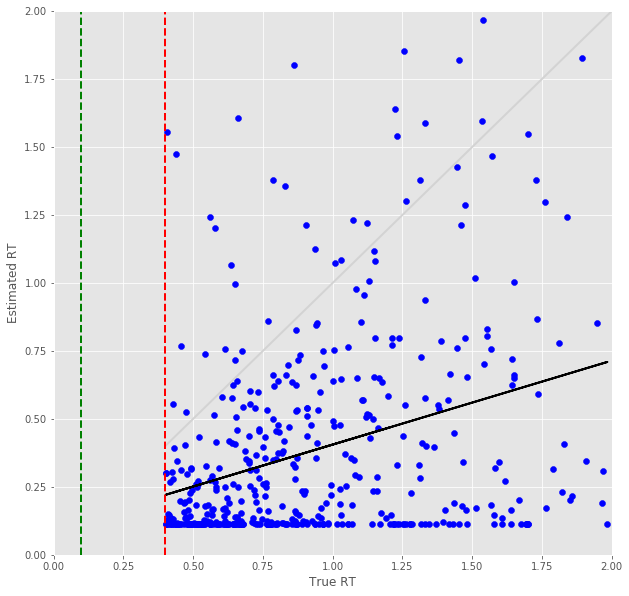

Error Prediction Score: 0.6604 RMSE
RT Prediction Score: 0.6988 RMSE
Error Prediction Corr: 0.5888
RT Prediction Corr: 0.3201
R^2 score for regression on Error: 0.3466
k = 1.0368


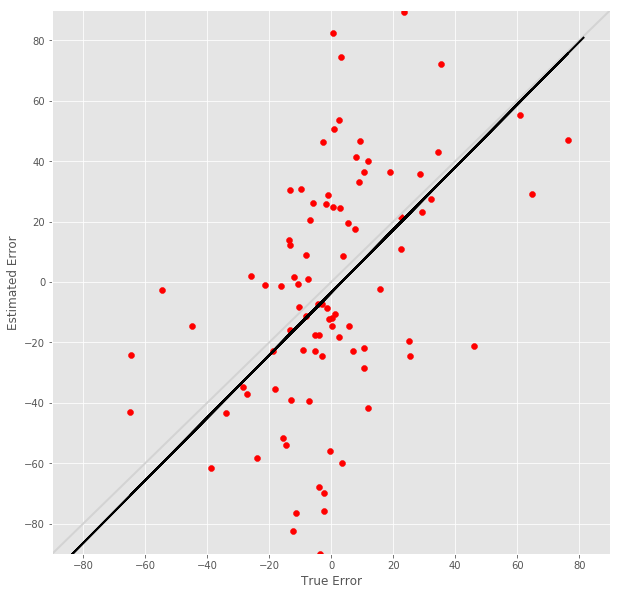

R^2 score for regression on RT: 0.1025
k = 0.2735


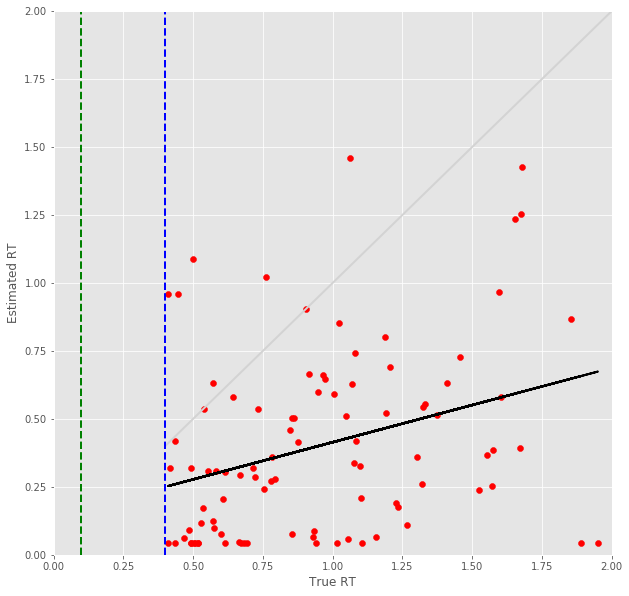

15 -step(s) forecast:
Test Score for 15 -steps forecast: 4.7030 RMSE
Predict Score for 15 -steps forecast: 4.6140 RMSE
Error Test Score for 15 -steps forecast: 0.7142 RMSE
RT Test Score for 15 -steps forecast: 0.7093 RMSE
Error Test Corr for 15 -steps forecast: 0.6094
RT Test Corr for 15 -steps forecast: 0.3282


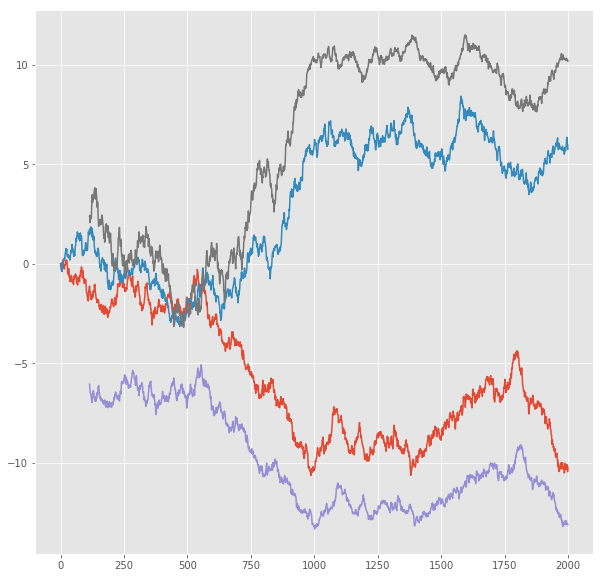

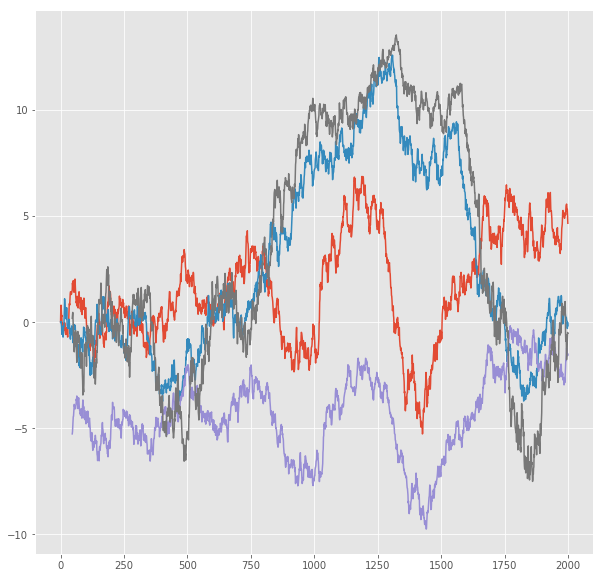

R^2 score for regression on Error: 0.3713
k = 1.0553


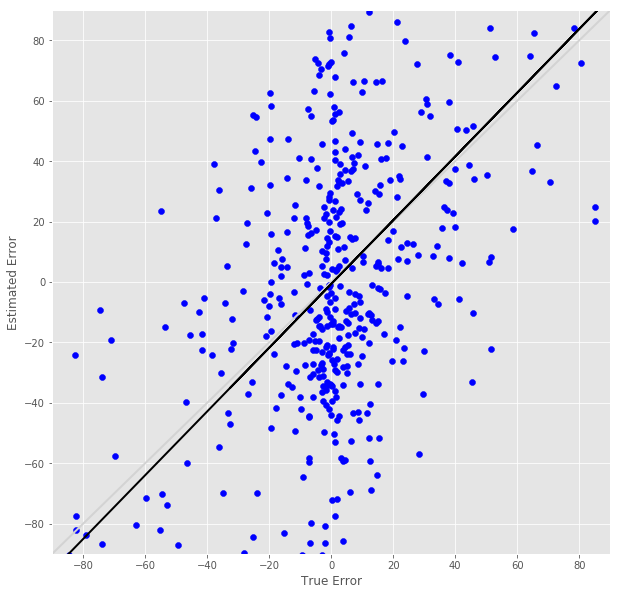

R^2 score for regression on RT: 0.1077
k = 0.2978


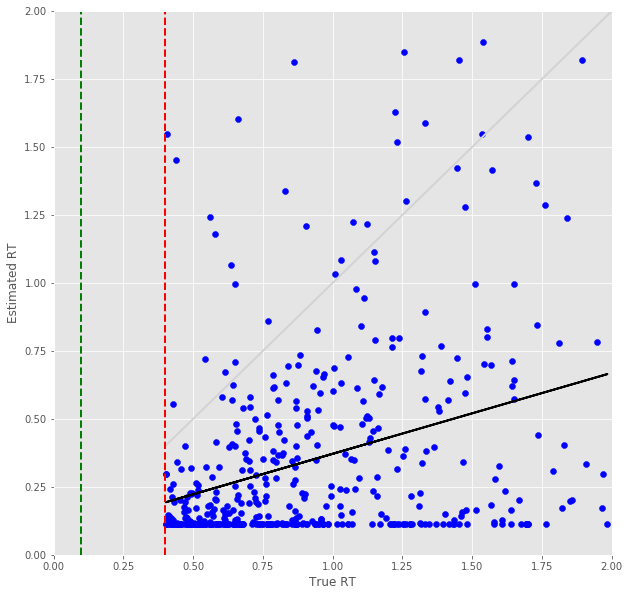

Error Prediction Score: 0.6906 RMSE
RT Prediction Score: 0.7331 RMSE
Error Prediction Corr: 0.5056
RT Prediction Corr: 0.2882
R^2 score for regression on Error: 0.2556
k = 0.8724


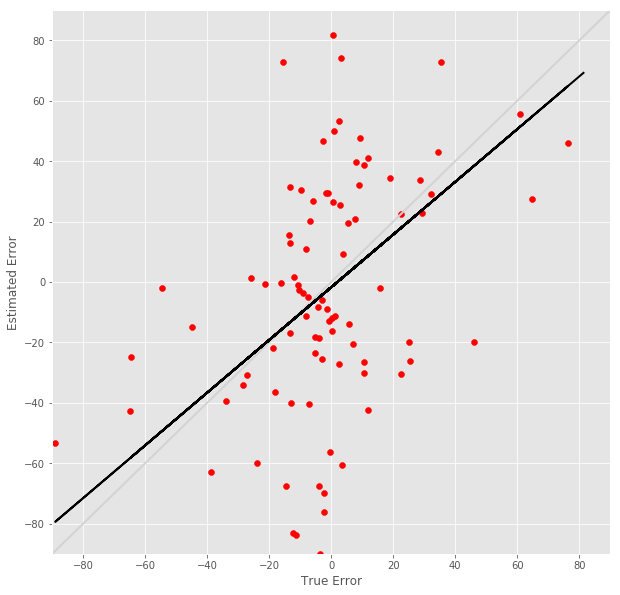

R^2 score for regression on RT: 0.0831
k = 0.2194


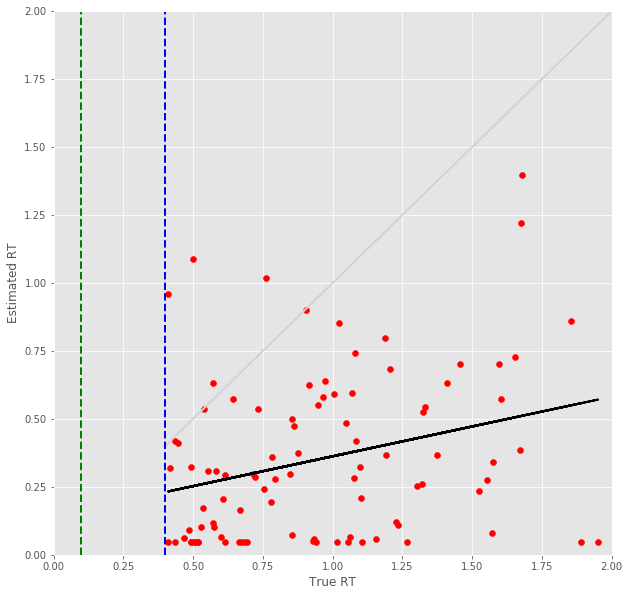

16 -step(s) forecast:
Test Score for 16 -steps forecast: 4.9674 RMSE
Predict Score for 16 -steps forecast: 4.8766 RMSE
Error Test Score for 16 -steps forecast: 0.7338 RMSE
RT Test Score for 16 -steps forecast: 0.7301 RMSE
Error Test Corr for 16 -steps forecast: 0.5859
RT Test Corr for 16 -steps forecast: 0.2940


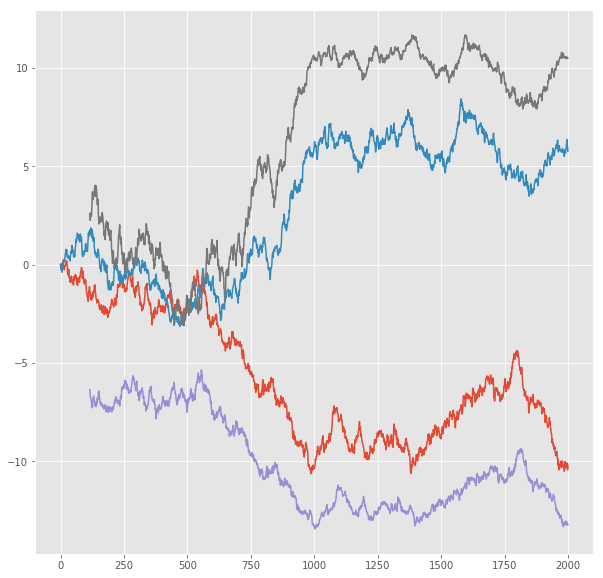

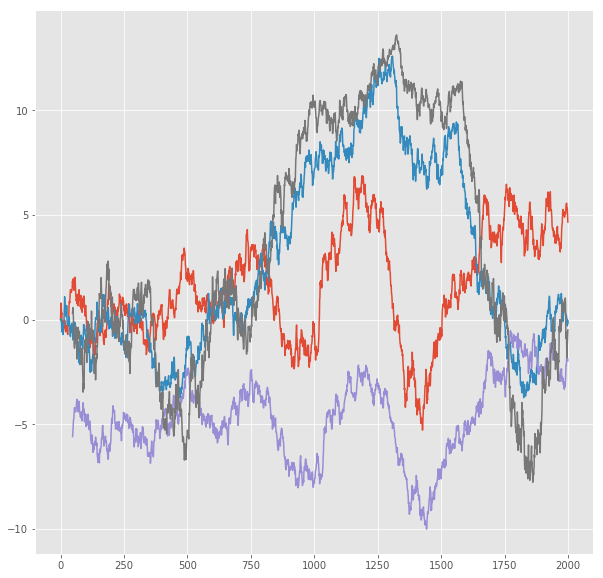

R^2 score for regression on Error: 0.3433
k = 1.0186


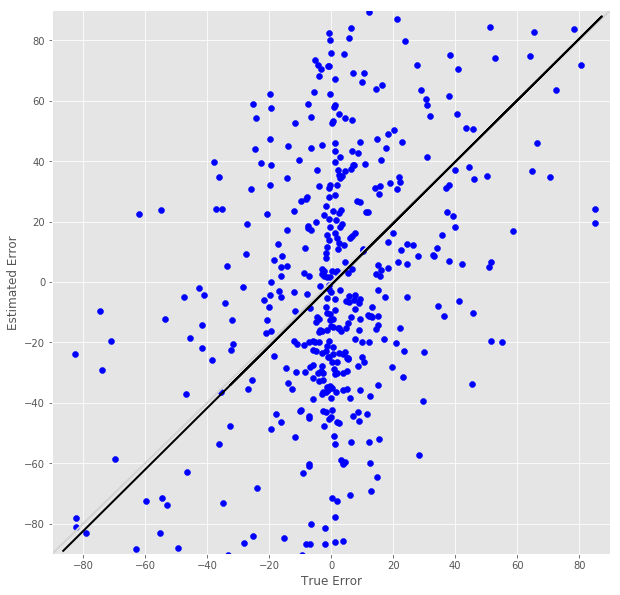

R^2 score for regression on RT: 0.0864
k = 0.2541


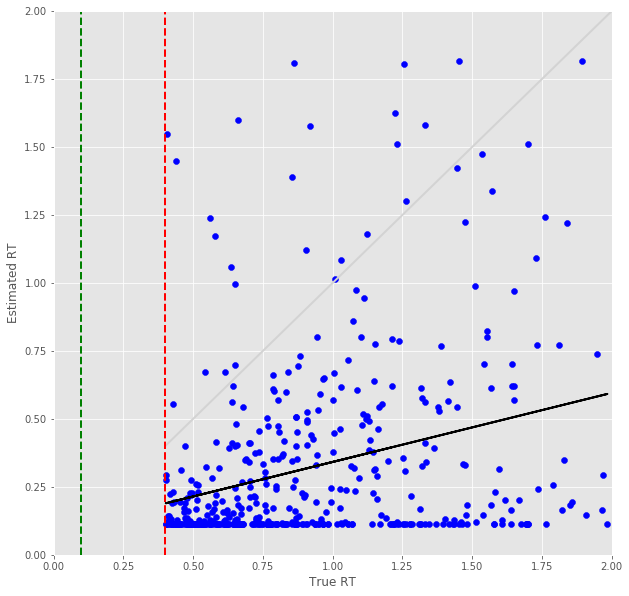

Error Prediction Score: 0.7061 RMSE
RT Prediction Score: 0.7576 RMSE
Error Prediction Corr: 0.5119
RT Prediction Corr: 0.2721
R^2 score for regression on Error: 0.2620
k = 0.9063


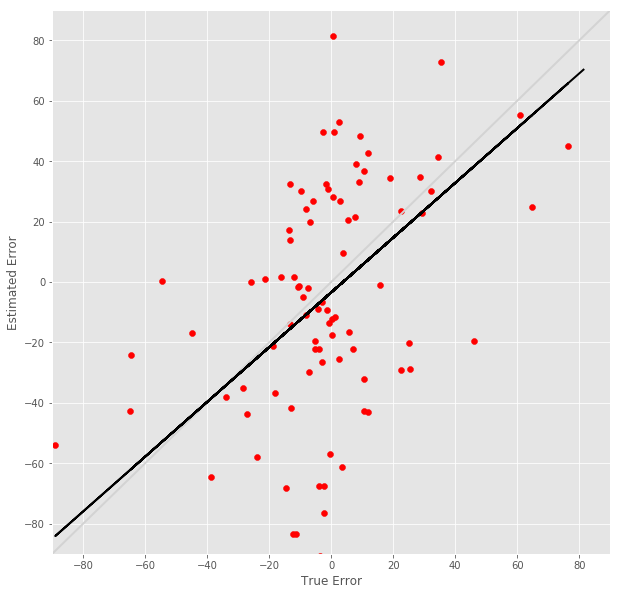

R^2 score for regression on RT: 0.0741
k = 0.1932


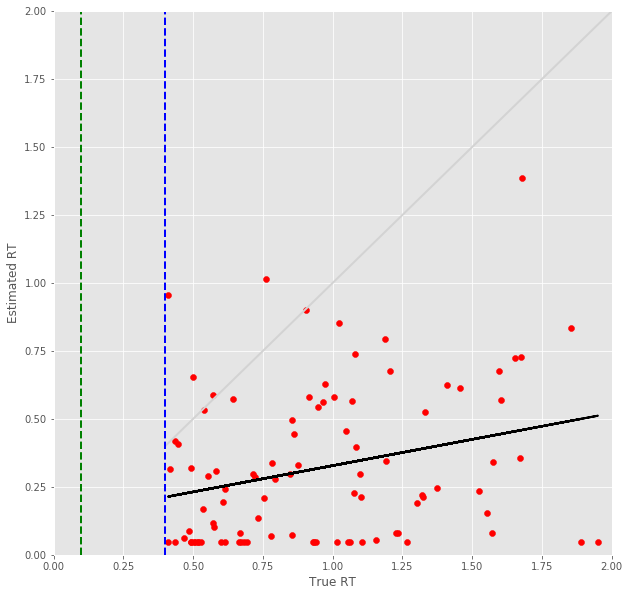

17 -step(s) forecast:
Test Score for 17 -steps forecast: 5.2285 RMSE
Predict Score for 17 -steps forecast: 5.1360 RMSE
Error Test Score for 17 -steps forecast: 0.7522 RMSE
RT Test Score for 17 -steps forecast: 0.7502 RMSE
Error Test Corr for 17 -steps forecast: 0.5659
RT Test Corr for 17 -steps forecast: 0.2725


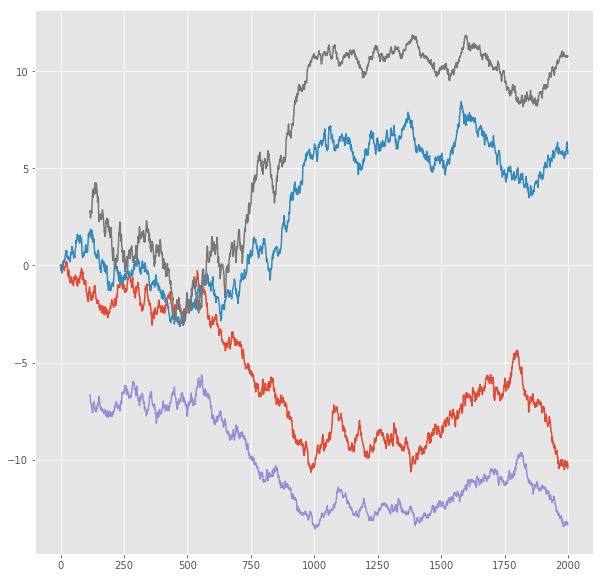

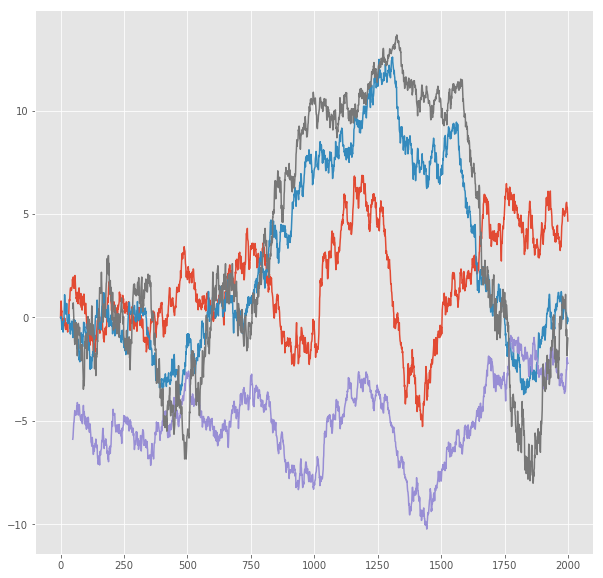

R^2 score for regression on Error: 0.3202
k = 0.9924


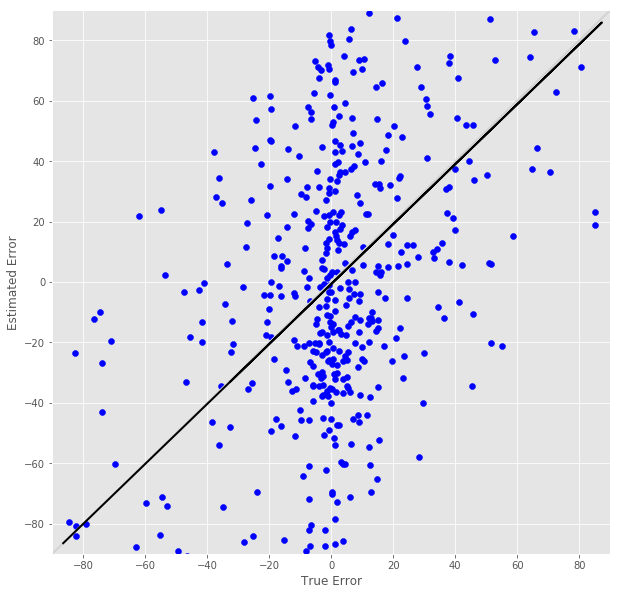

R^2 score for regression on RT: 0.0743
k = 0.2262


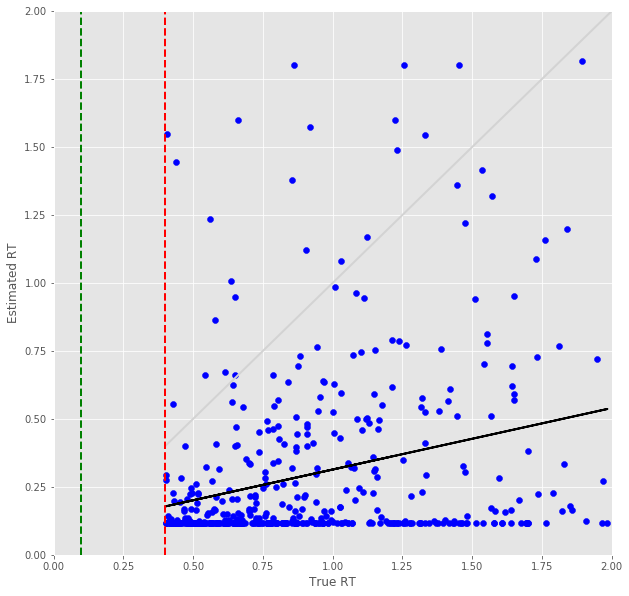

Error Prediction Score: 0.7341 RMSE
RT Prediction Score: 0.7926 RMSE
Error Prediction Corr: 0.4858
RT Prediction Corr: 0.1862
R^2 score for regression on Error: 0.2360
k = 0.8939


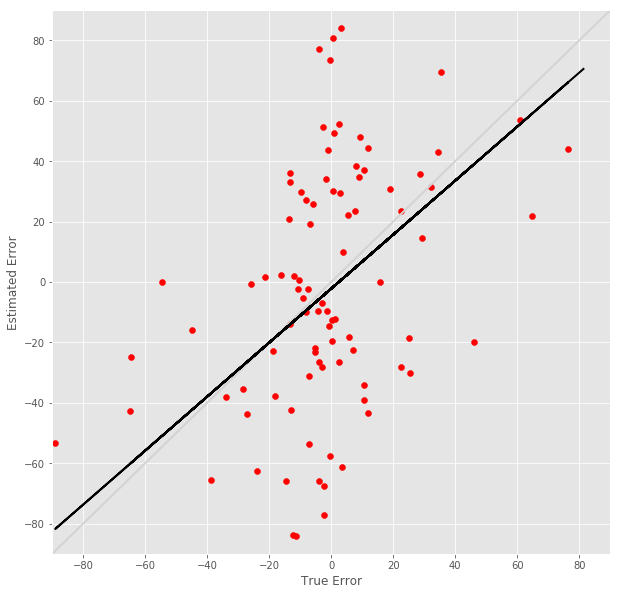

R^2 score for regression on RT: 0.0347
k = 0.1335


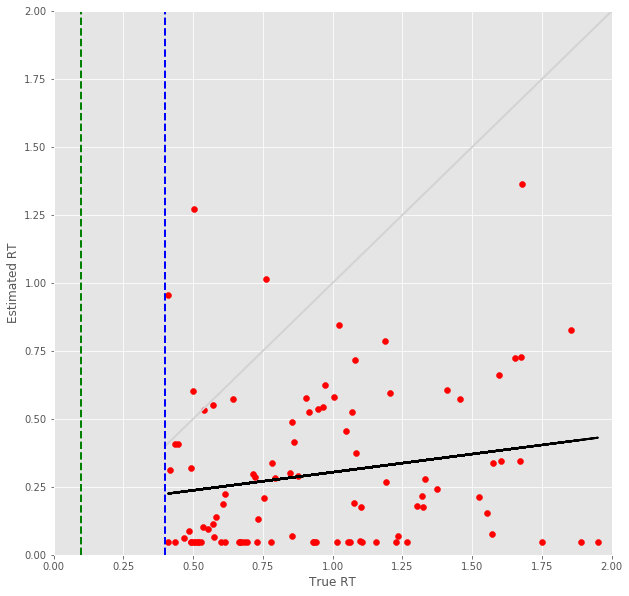

18 -step(s) forecast:
Test Score for 18 -steps forecast: 5.4862 RMSE
Predict Score for 18 -steps forecast: 5.3922 RMSE
Error Test Score for 18 -steps forecast: 0.7694 RMSE
RT Test Score for 18 -steps forecast: 0.7627 RMSE
Error Test Corr for 18 -steps forecast: 0.5602
RT Test Corr for 18 -steps forecast: 0.2942


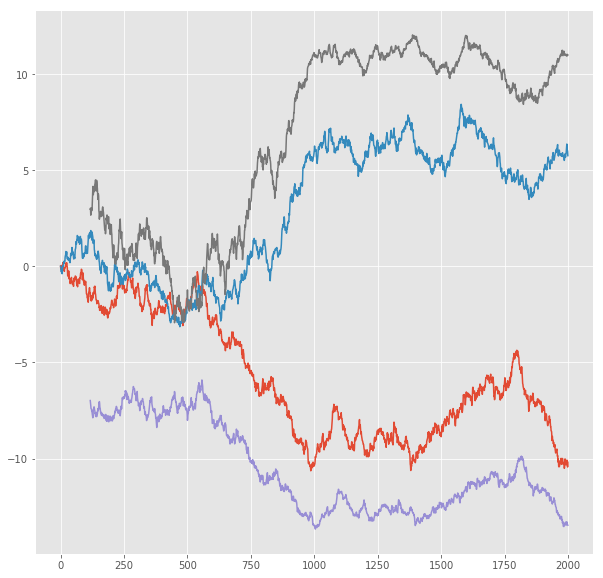

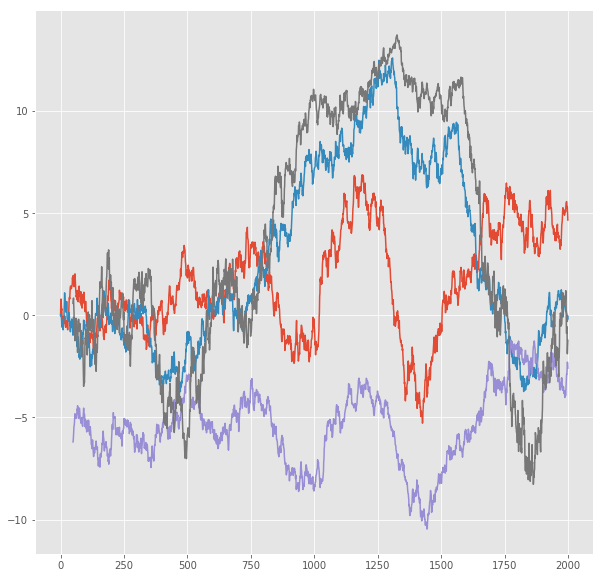

R^2 score for regression on Error: 0.3138
k = 0.9987


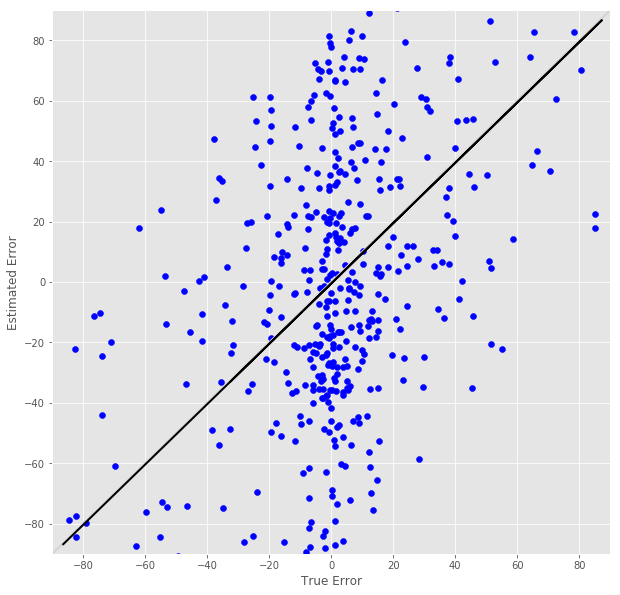

R^2 score for regression on RT: 0.0866
k = 0.2170


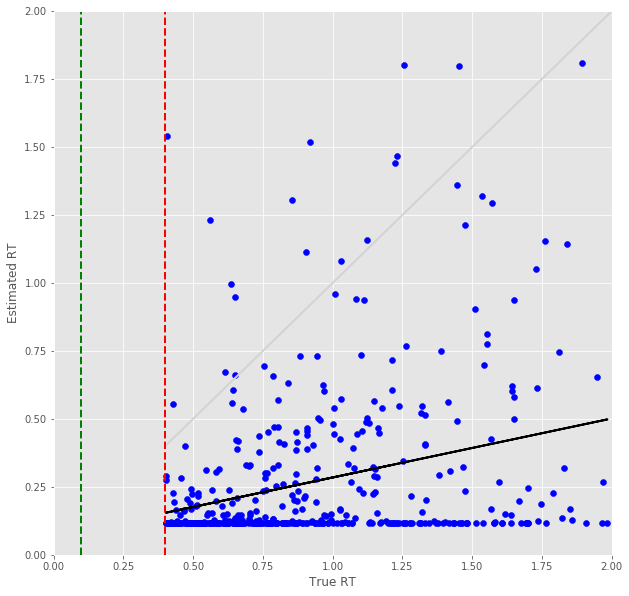

Error Prediction Score: 0.7568 RMSE
RT Prediction Score: 0.8167 RMSE
Error Prediction Corr: 0.4709
RT Prediction Corr: 0.1598
R^2 score for regression on Error: 0.2217
k = 0.8852


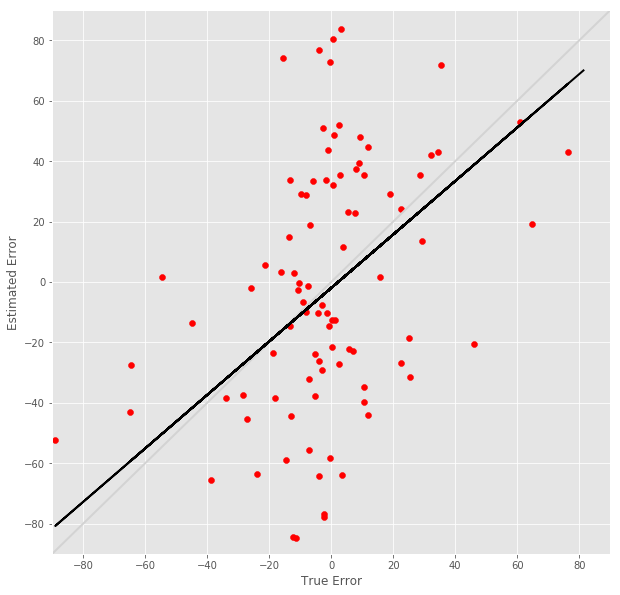

R^2 score for regression on RT: 0.0255
k = 0.1115


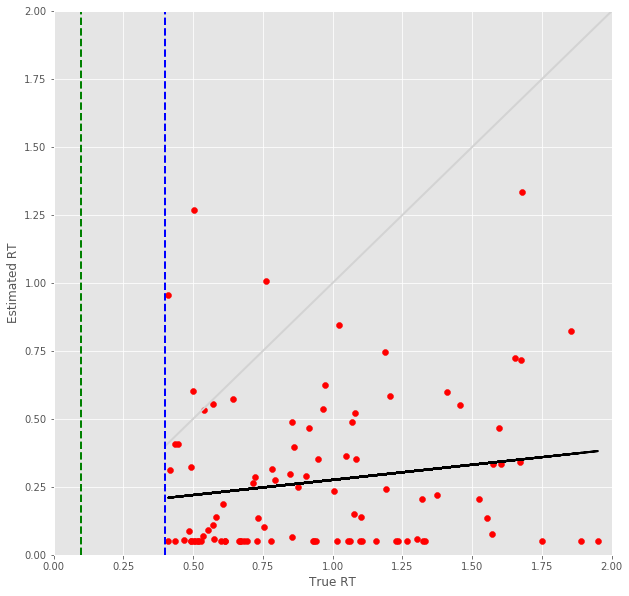

19 -step(s) forecast:
Test Score for 19 -steps forecast: 5.7408 RMSE
Predict Score for 19 -steps forecast: 5.6453 RMSE
Error Test Score for 19 -steps forecast: 0.7779 RMSE
RT Test Score for 19 -steps forecast: 0.7764 RMSE
Error Test Corr for 19 -steps forecast: 0.5634
RT Test Corr for 19 -steps forecast: 0.2829


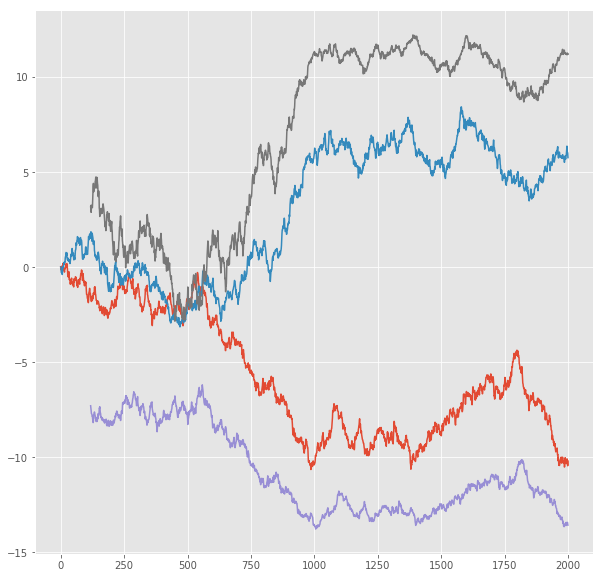

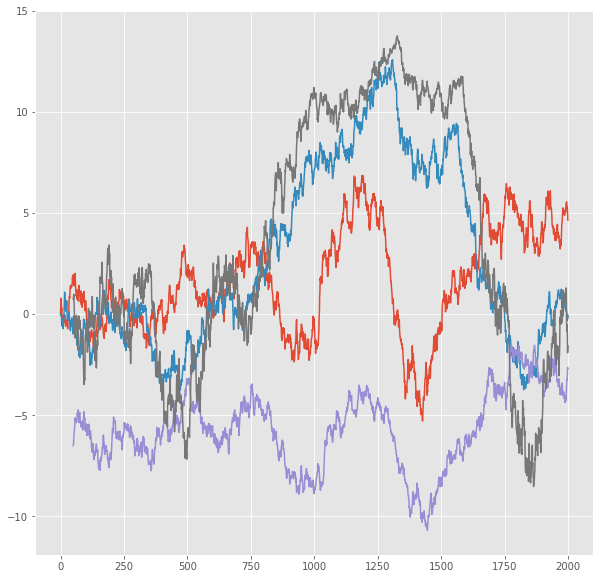

R^2 score for regression on Error: 0.3175
k = 1.0188


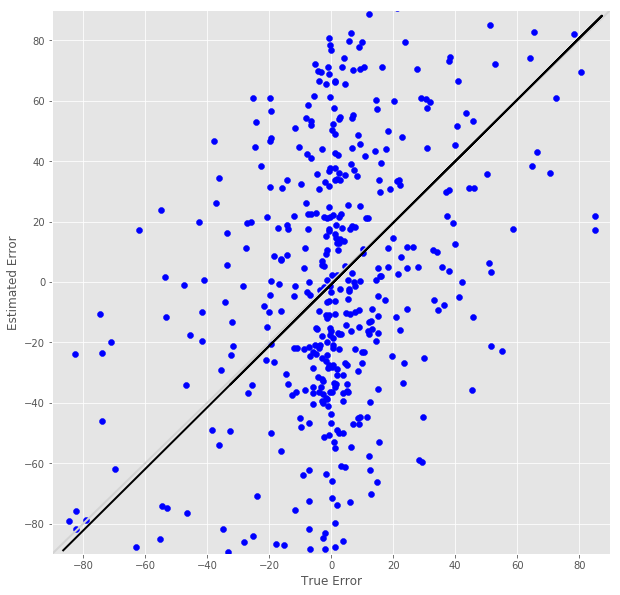

R^2 score for regression on RT: 0.0800
k = 0.1955


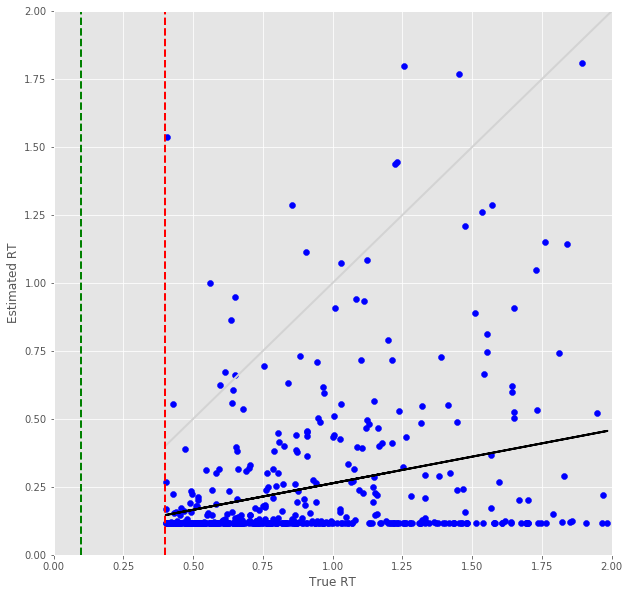

Error Prediction Score: 0.7765 RMSE
RT Prediction Score: 0.8292 RMSE
Error Prediction Corr: 0.4513
RT Prediction Corr: 0.1446
R^2 score for regression on Error: 0.2037
k = 0.8646


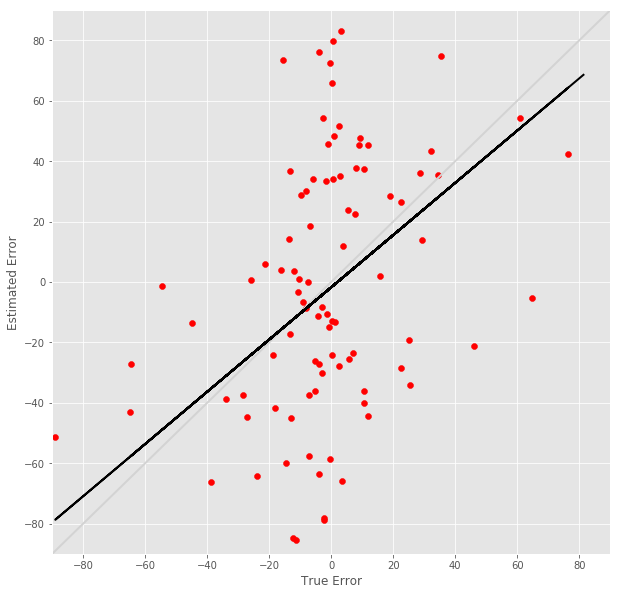

R^2 score for regression on RT: 0.0209
k = 0.0981


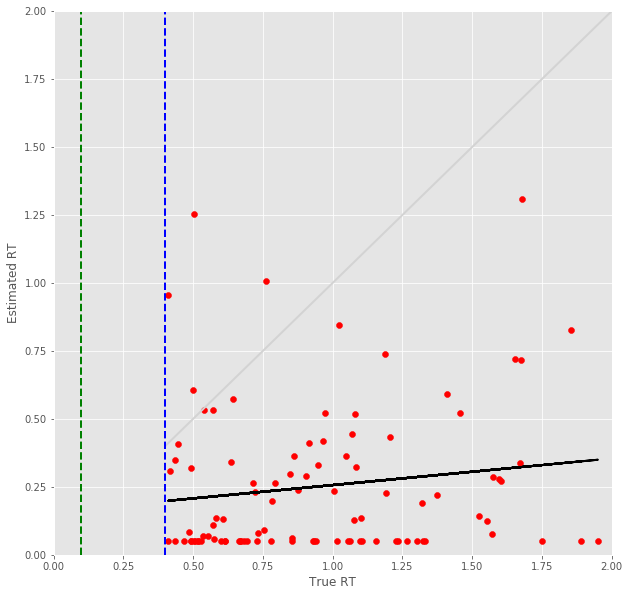

20 -step(s) forecast:
Test Score for 20 -steps forecast: 5.9922 RMSE
Predict Score for 20 -steps forecast: 5.8954 RMSE
Error Test Score for 20 -steps forecast: 0.7978 RMSE
RT Test Score for 20 -steps forecast: 0.7890 RMSE
Error Test Corr for 20 -steps forecast: 0.5450
RT Test Corr for 20 -steps forecast: 0.2943


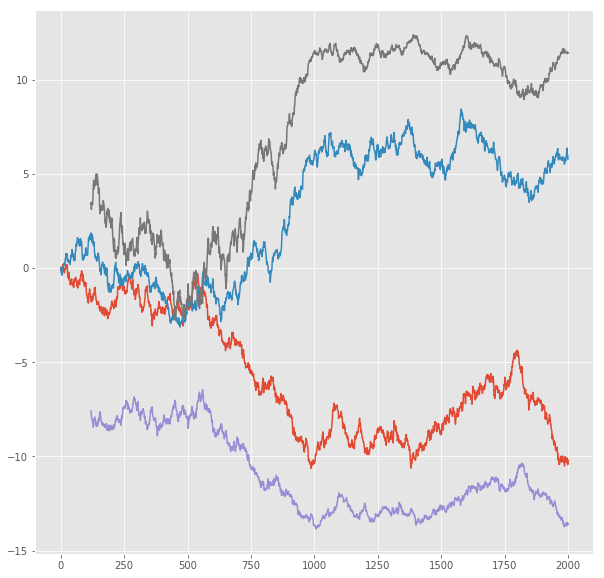

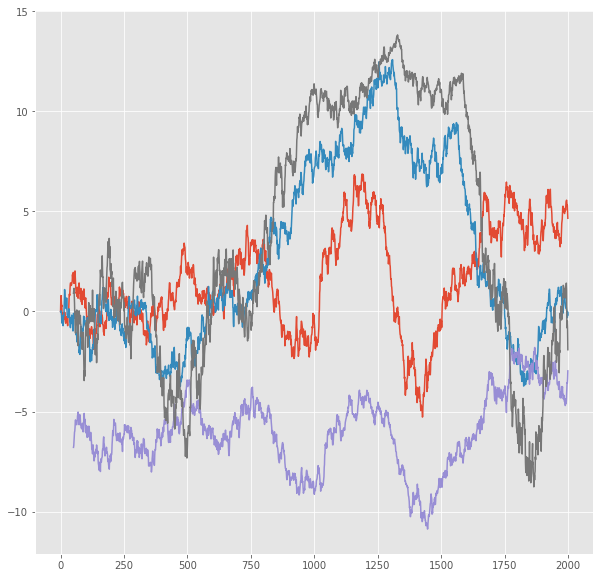

R^2 score for regression on Error: 0.2970
k = 0.9985


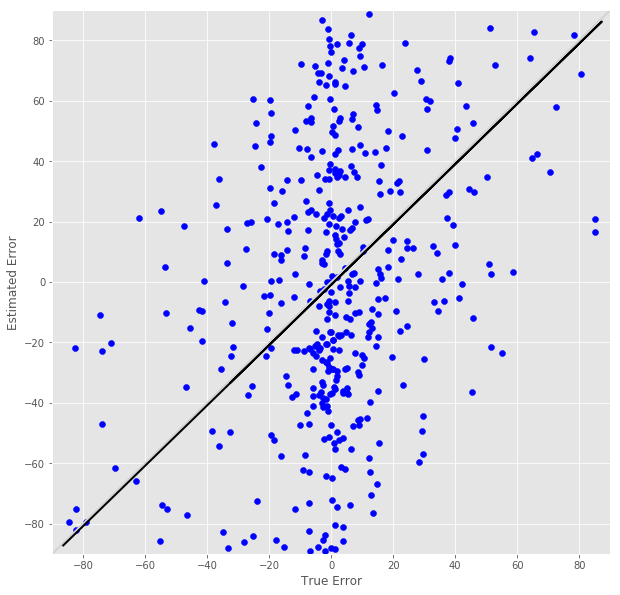

R^2 score for regression on RT: 0.0866
k = 0.1845


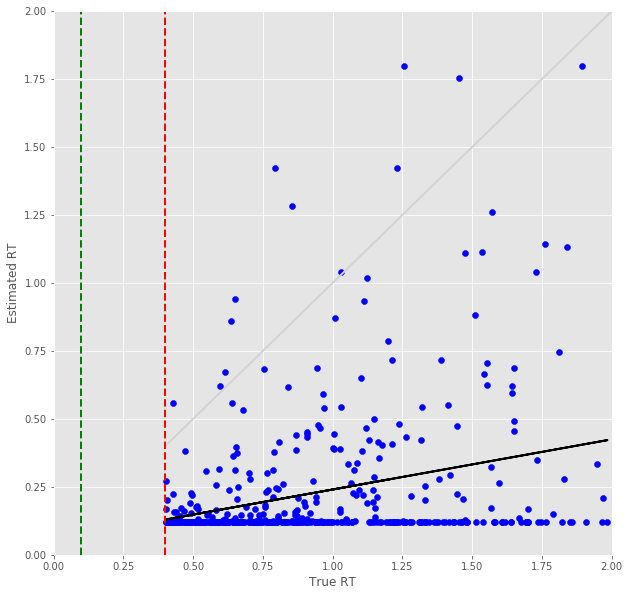

Error Prediction Score: 0.8057 RMSE
RT Prediction Score: 0.8569 RMSE
Error Prediction Corr: 0.4403
RT Prediction Corr: 0.1672
R^2 score for regression on Error: 0.1939
k = 0.8707


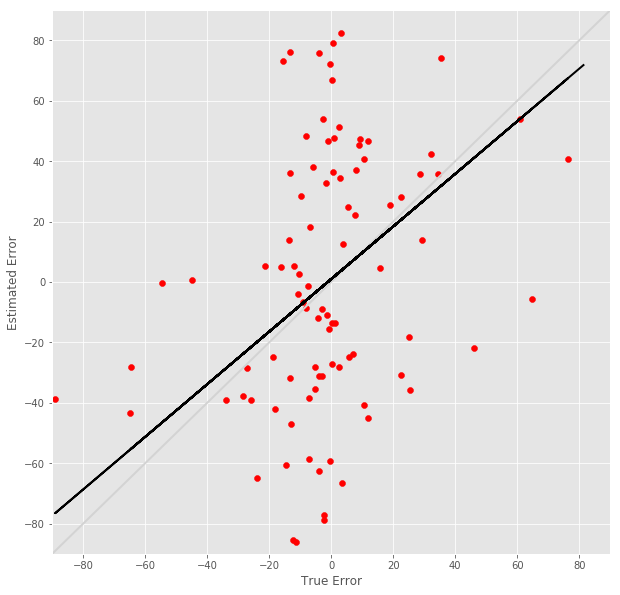

R^2 score for regression on RT: 0.0280
k = 0.1002


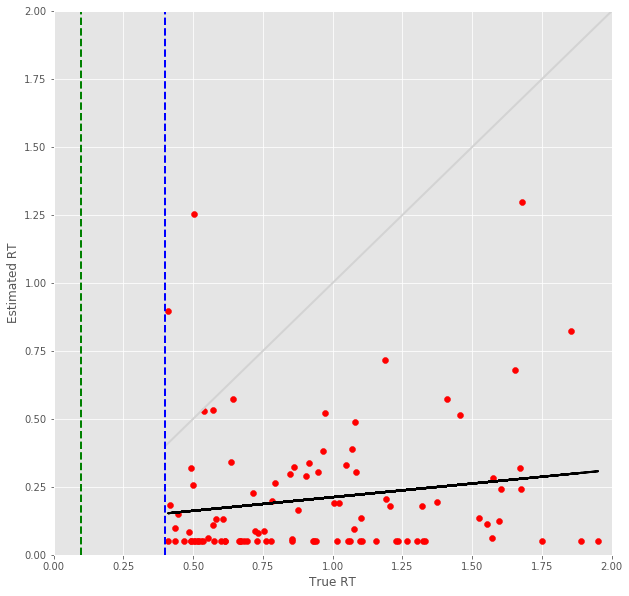

21 -step(s) forecast:
Test Score for 21 -steps forecast: 6.2406 RMSE
Predict Score for 21 -steps forecast: 6.1423 RMSE
Error Test Score for 21 -steps forecast: 0.8077 RMSE
RT Test Score for 21 -steps forecast: 0.7997 RMSE
Error Test Corr for 21 -steps forecast: 0.5379
RT Test Corr for 21 -steps forecast: 0.2902


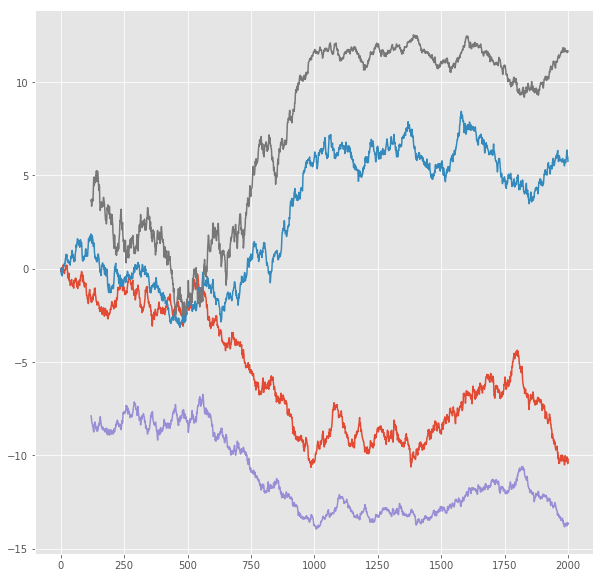

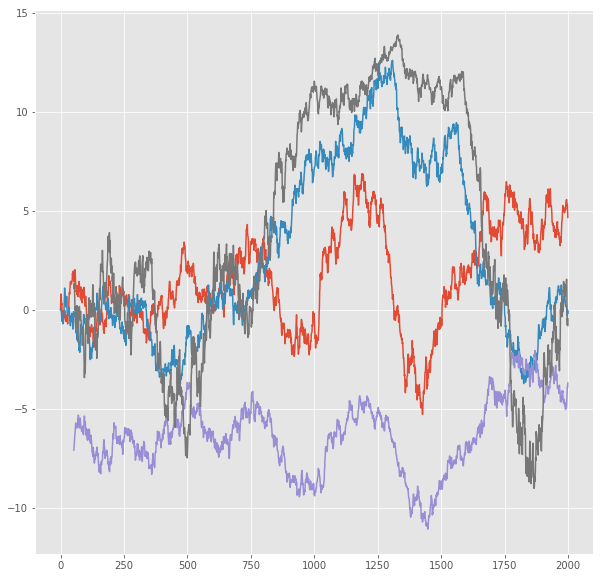

R^2 score for regression on Error: 0.2894
k = 0.9921


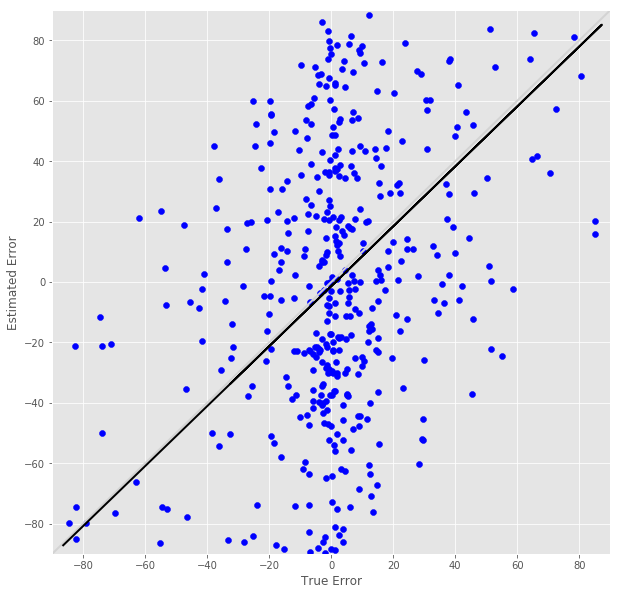

R^2 score for regression on RT: 0.0842
k = 0.1673


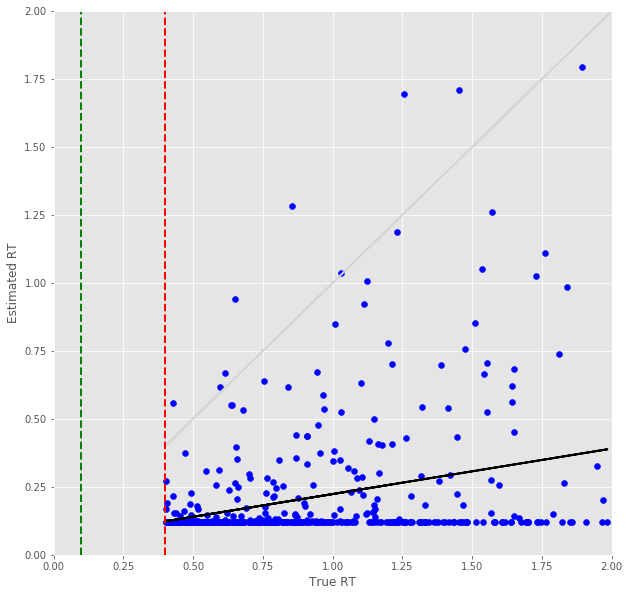

Error Prediction Score: 0.8168 RMSE
RT Prediction Score: 0.8795 RMSE
Error Prediction Corr: 0.4614
RT Prediction Corr: 0.1996
R^2 score for regression on Error: 0.2129
k = 0.9405


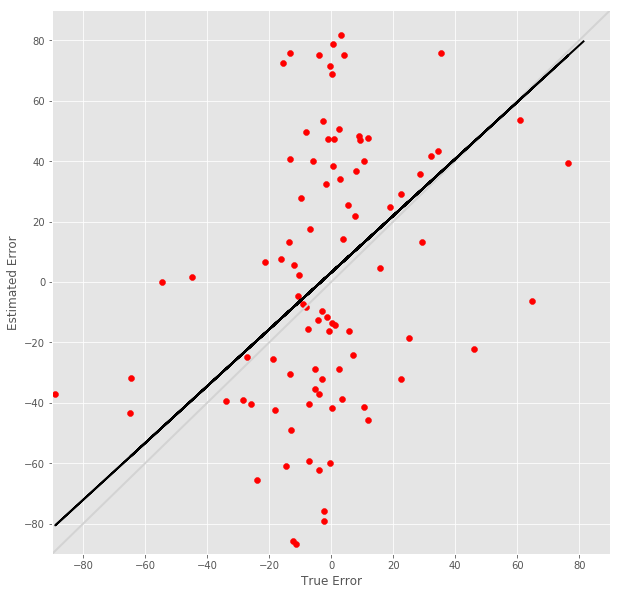

R^2 score for regression on RT: 0.0398
k = 0.1106


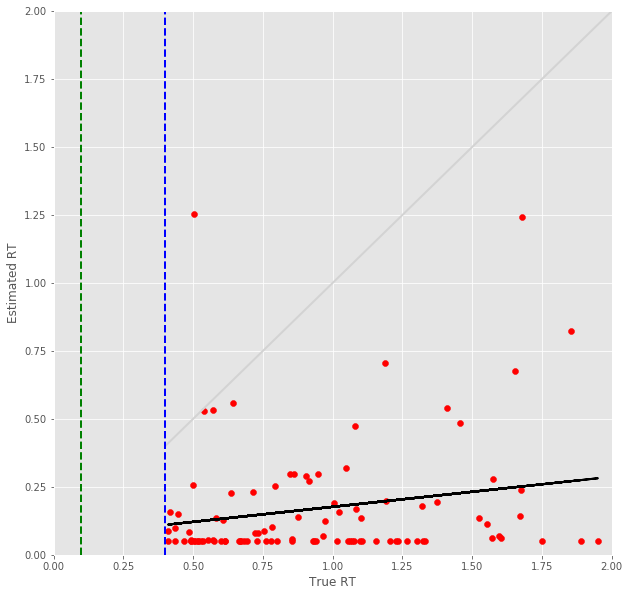

22 -step(s) forecast:
Test Score for 22 -steps forecast: 6.4859 RMSE
Predict Score for 22 -steps forecast: 6.3863 RMSE
Error Test Score for 22 -steps forecast: 0.8153 RMSE
RT Test Score for 22 -steps forecast: 0.8083 RMSE
Error Test Corr for 22 -steps forecast: 0.5294
RT Test Corr for 22 -steps forecast: 0.3069


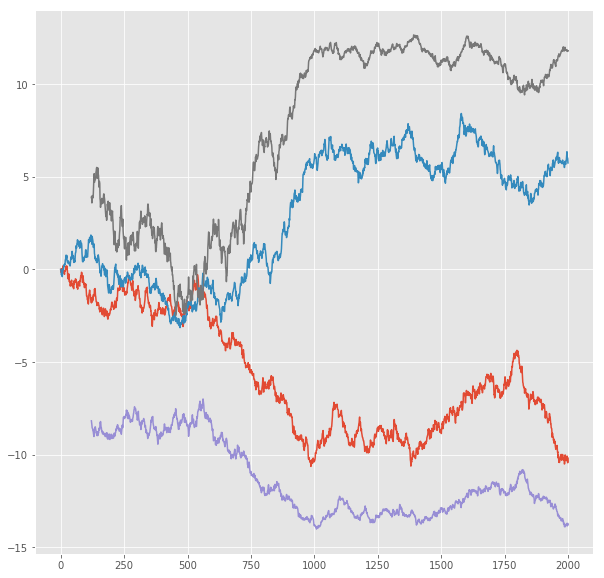

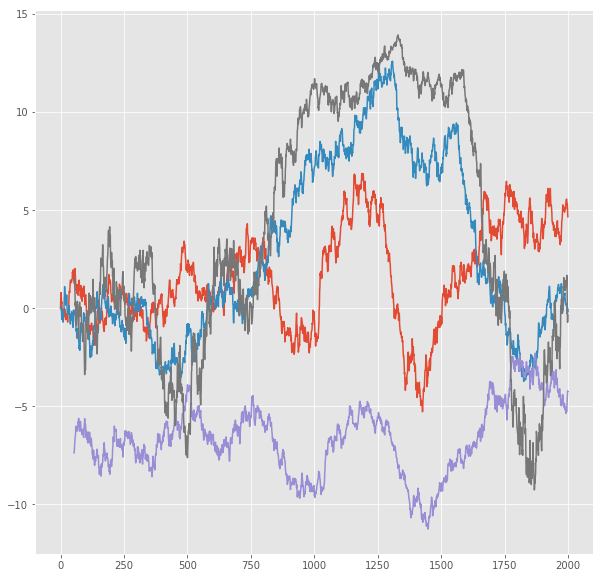

R^2 score for regression on Error: 0.2802
k = 0.9797


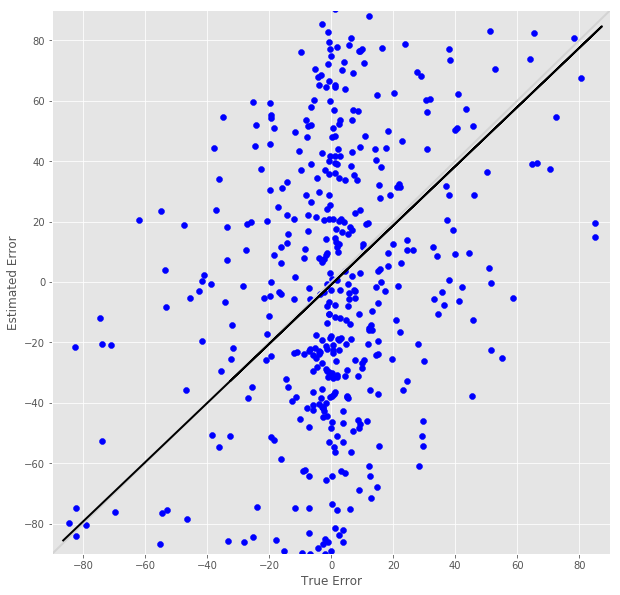

R^2 score for regression on RT: 0.0942
k = 0.1788


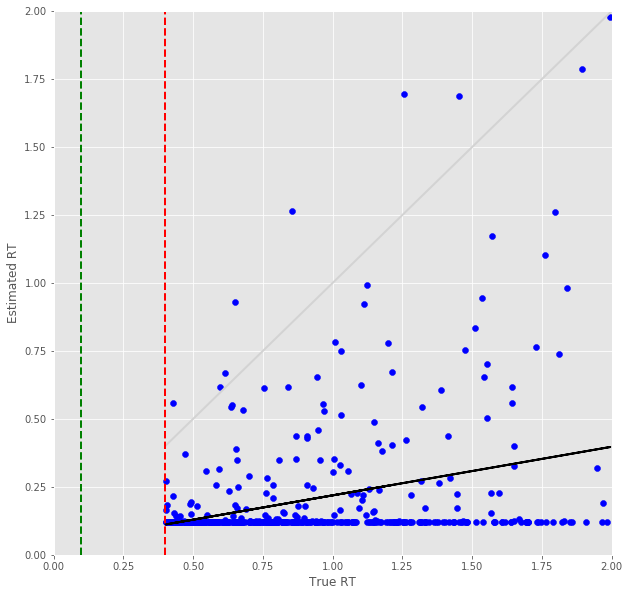

Error Prediction Score: 0.8226 RMSE
RT Prediction Score: 0.9035 RMSE
Error Prediction Corr: 0.4632
RT Prediction Corr: 0.1647
R^2 score for regression on Error: 0.2146
k = 0.9507


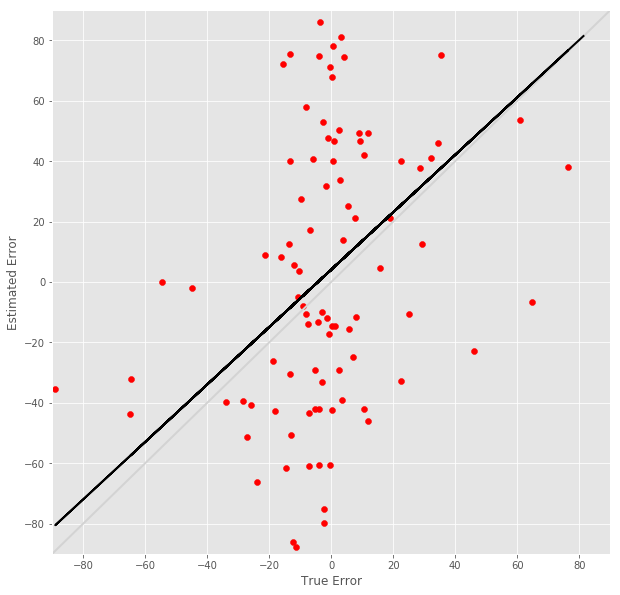

R^2 score for regression on RT: 0.0271
k = 0.0881


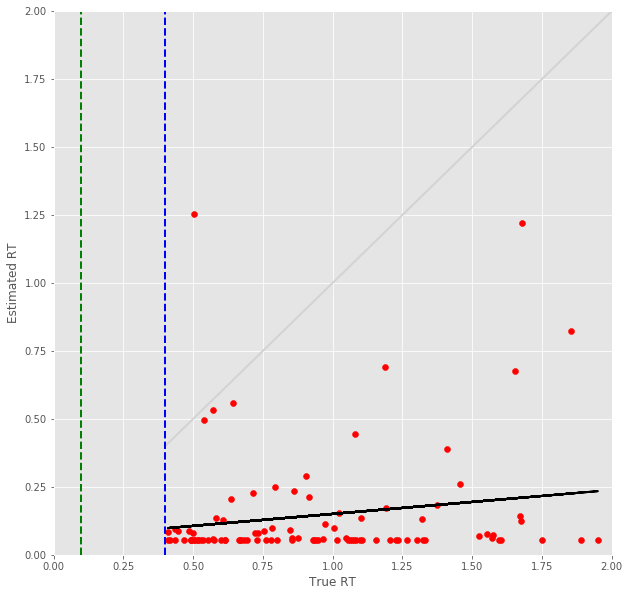

23 -step(s) forecast:
Test Score for 23 -steps forecast: 6.7282 RMSE
Predict Score for 23 -steps forecast: 6.6273 RMSE
Error Test Score for 23 -steps forecast: 0.8241 RMSE
RT Test Score for 23 -steps forecast: 0.8212 RMSE
Error Test Corr for 23 -steps forecast: 0.5242
RT Test Corr for 23 -steps forecast: 0.2699


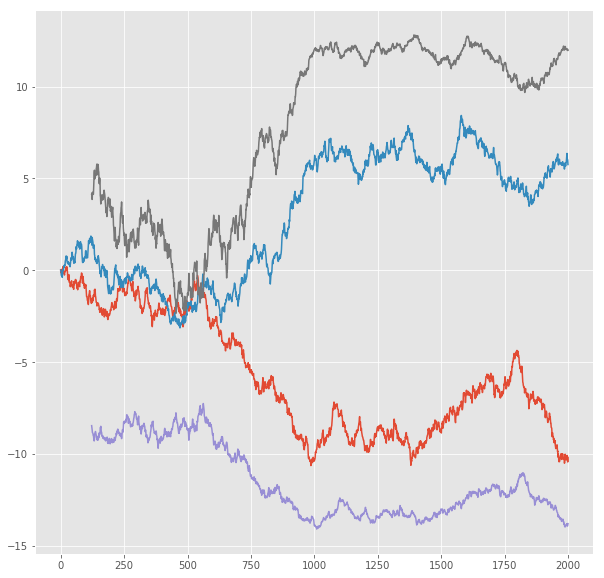

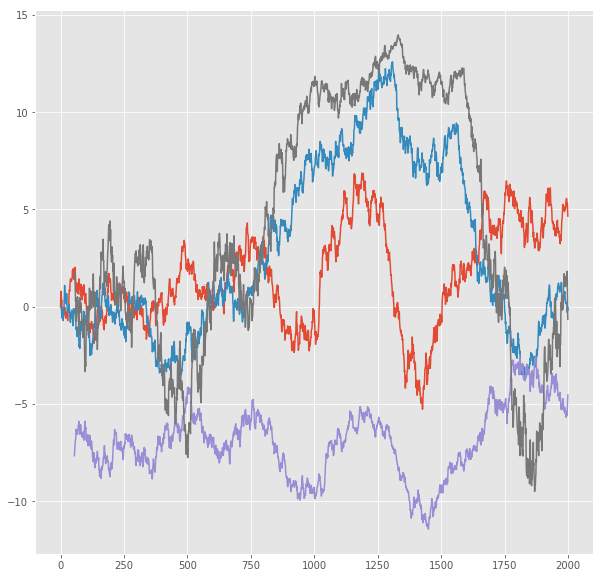

R^2 score for regression on Error: 0.2748
k = 0.9775


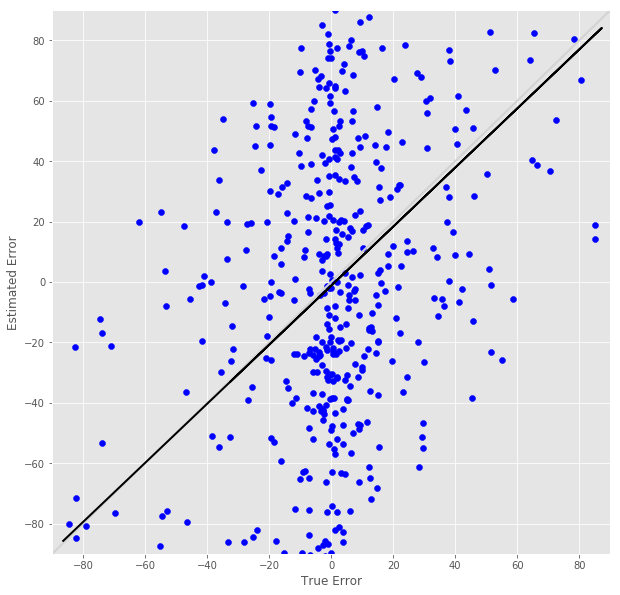

R^2 score for regression on RT: 0.0728
k = 0.1391


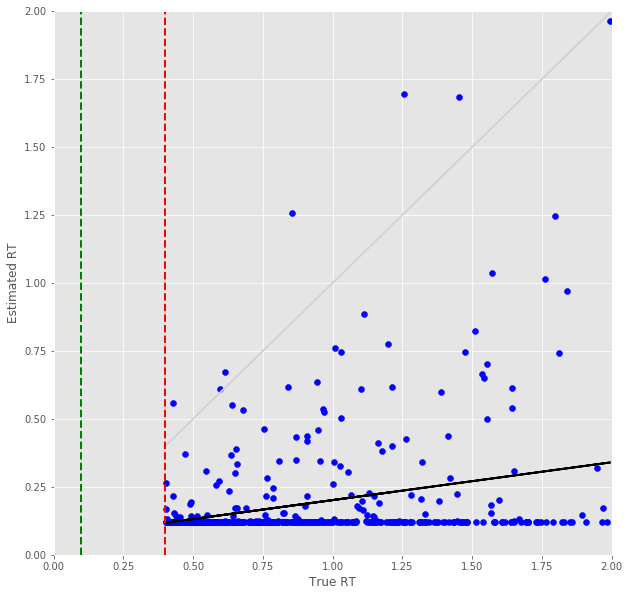

Error Prediction Score: 0.8320 RMSE
RT Prediction Score: 0.9231 RMSE
Error Prediction Corr: 0.4439
RT Prediction Corr: 0.1177
R^2 score for regression on Error: 0.1970
k = 0.9140


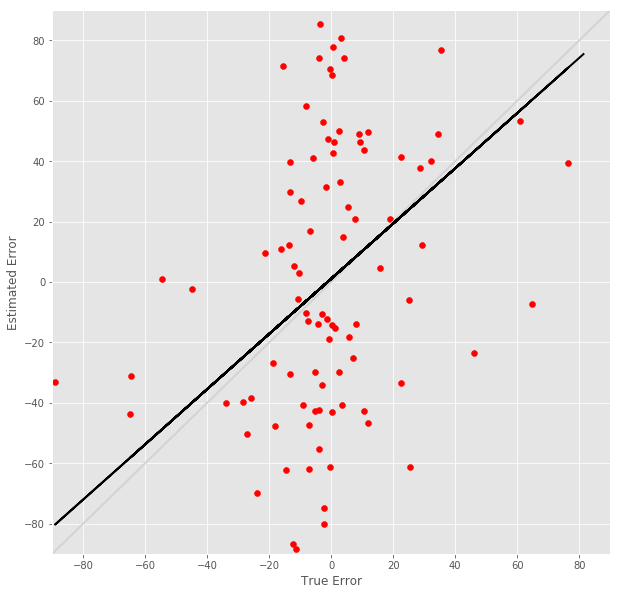

R^2 score for regression on RT: 0.0139
k = 0.0579


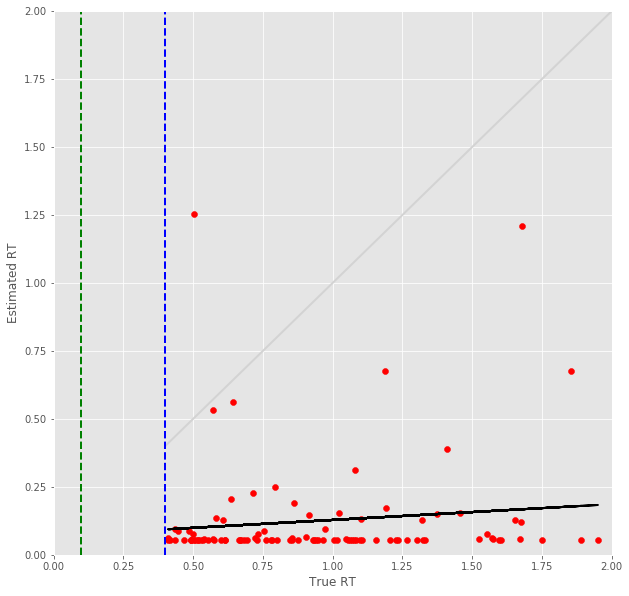

24 -step(s) forecast:
Test Score for 24 -steps forecast: 6.9676 RMSE
Predict Score for 24 -steps forecast: 6.8653 RMSE
Error Test Score for 24 -steps forecast: 0.8341 RMSE
RT Test Score for 24 -steps forecast: 0.8292 RMSE
Error Test Corr for 24 -steps forecast: 0.5277
RT Test Corr for 24 -steps forecast: 0.2697


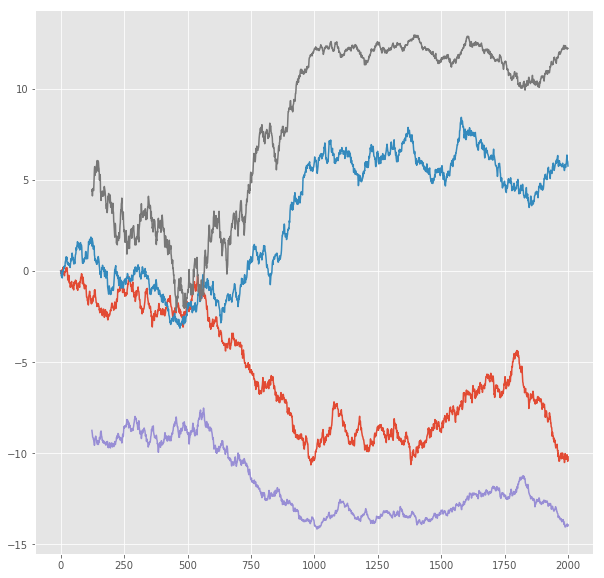

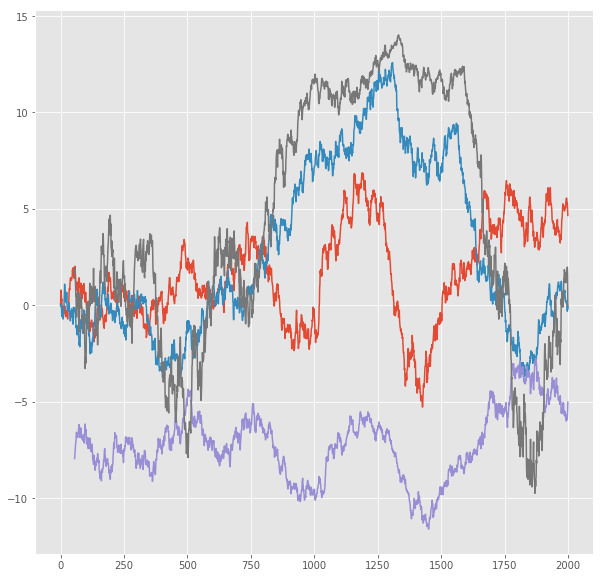

R^2 score for regression on Error: 0.2784
k = 1.0006


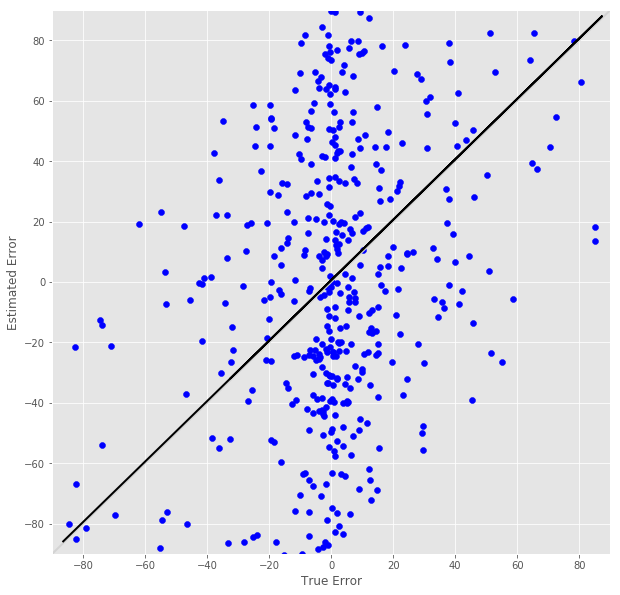

R^2 score for regression on RT: 0.0728
k = 0.1244


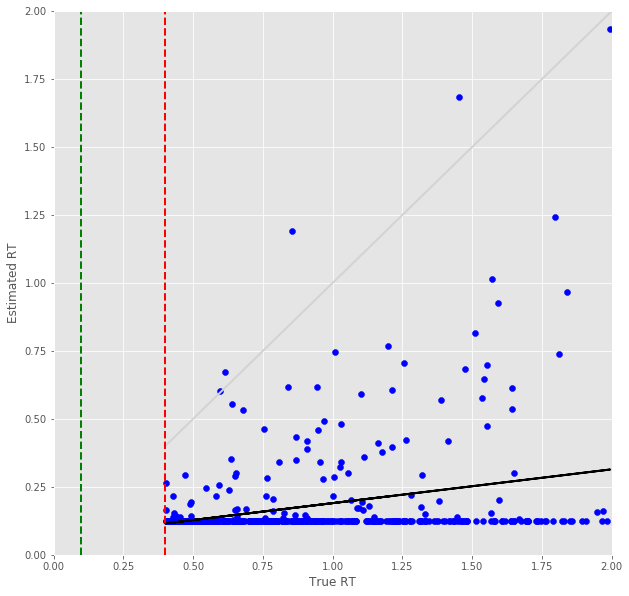

Error Prediction Score: 0.8473 RMSE
RT Prediction Score: 0.9293 RMSE
Error Prediction Corr: 0.4566
RT Prediction Corr: 0.2452
R^2 score for regression on Error: 0.2085
k = 0.9628


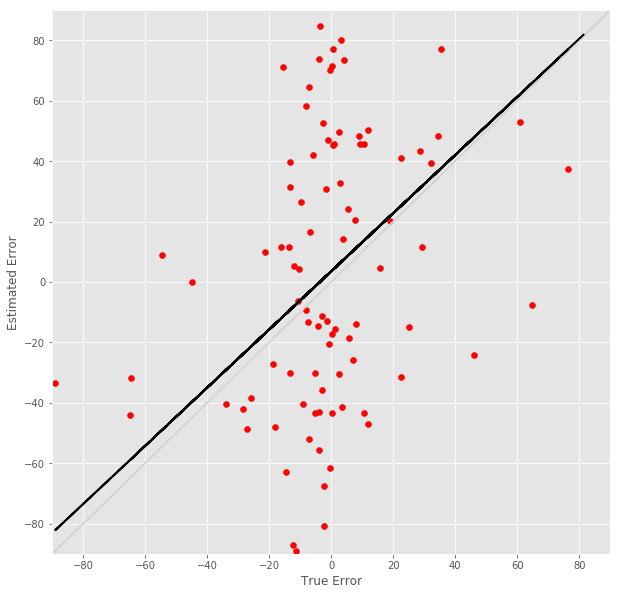

R^2 score for regression on RT: 0.0601
k = 0.0875


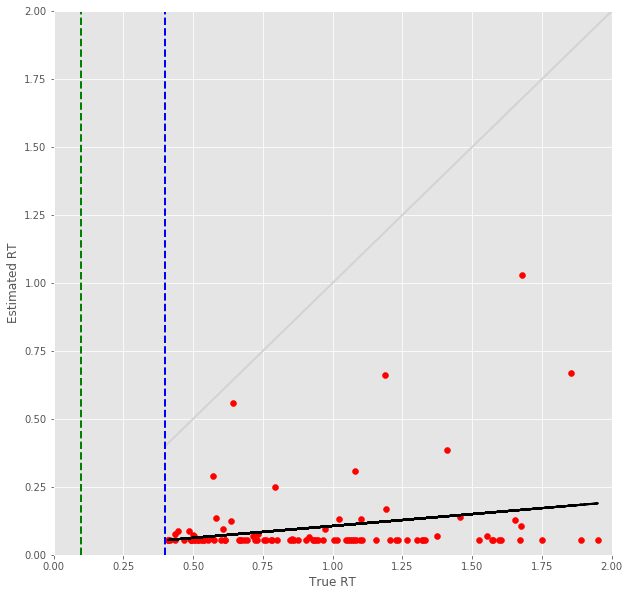

25 -step(s) forecast:
Test Score for 25 -steps forecast: 7.2041 RMSE
Predict Score for 25 -steps forecast: 7.1004 RMSE
Error Test Score for 25 -steps forecast: 0.8467 RMSE
RT Test Score for 25 -steps forecast: 0.8392 RMSE
Error Test Corr for 25 -steps forecast: 0.5130
RT Test Corr for 25 -steps forecast: 0.2592


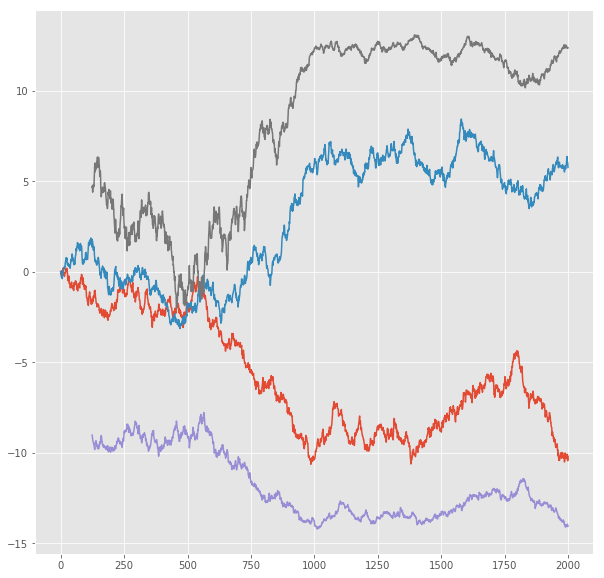

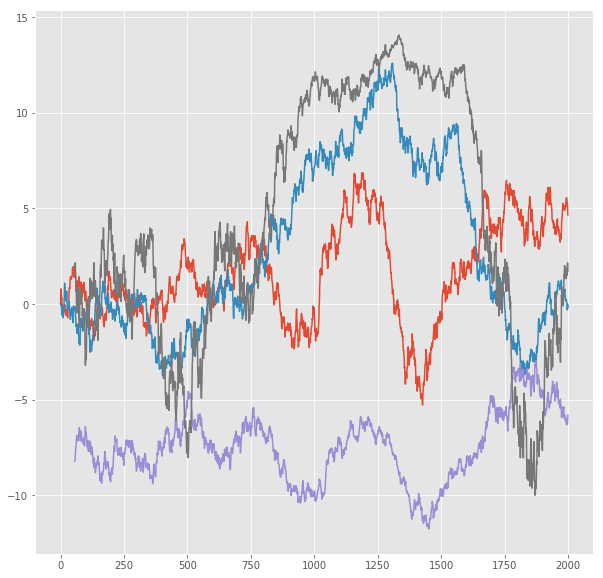

R^2 score for regression on Error: 0.2632
k = 0.9772


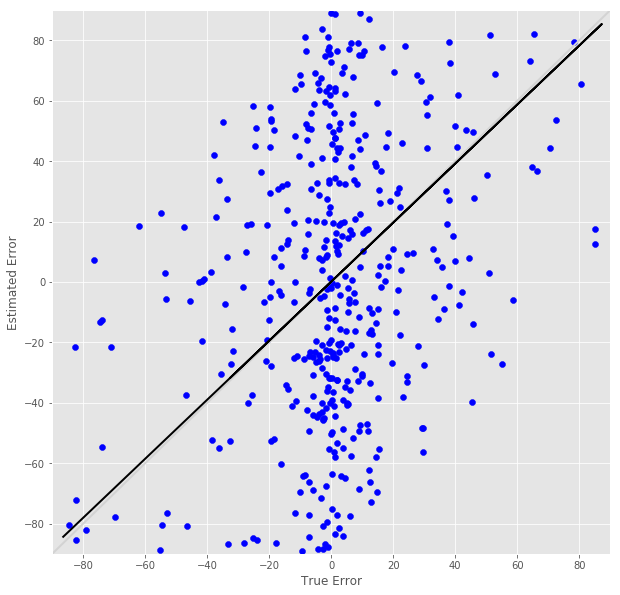

R^2 score for regression on RT: 0.0672
k = 0.1048


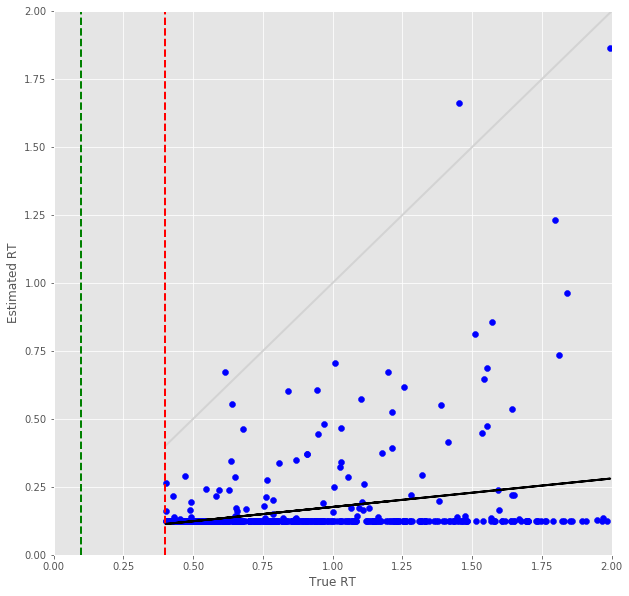

Error Prediction Score: 0.8535 RMSE
RT Prediction Score: 0.9336 RMSE
Error Prediction Corr: 0.4526
RT Prediction Corr: 0.2364
R^2 score for regression on Error: 0.2048
k = 0.9597


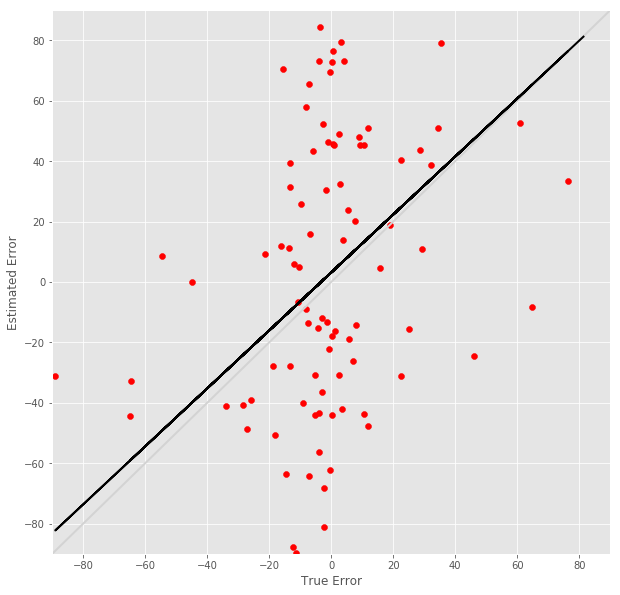

R^2 score for regression on RT: 0.0559
k = 0.0807


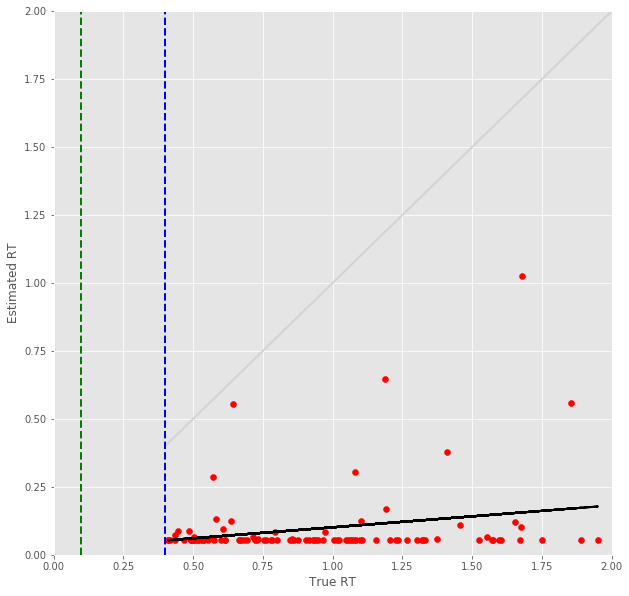

26 -step(s) forecast:
Test Score for 26 -steps forecast: 7.4378 RMSE
Predict Score for 26 -steps forecast: 7.3326 RMSE
Error Test Score for 26 -steps forecast: 0.8535 RMSE
RT Test Score for 26 -steps forecast: 0.8485 RMSE
Error Test Corr for 26 -steps forecast: 0.5088
RT Test Corr for 26 -steps forecast: 0.2152


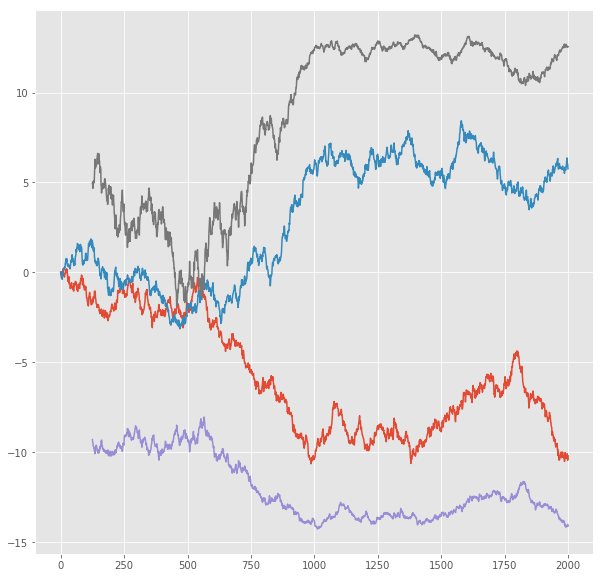

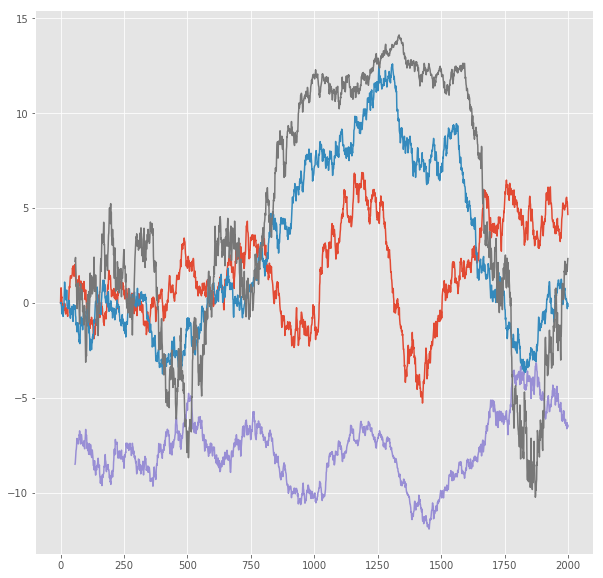

R^2 score for regression on Error: 0.2589
k = 0.9741


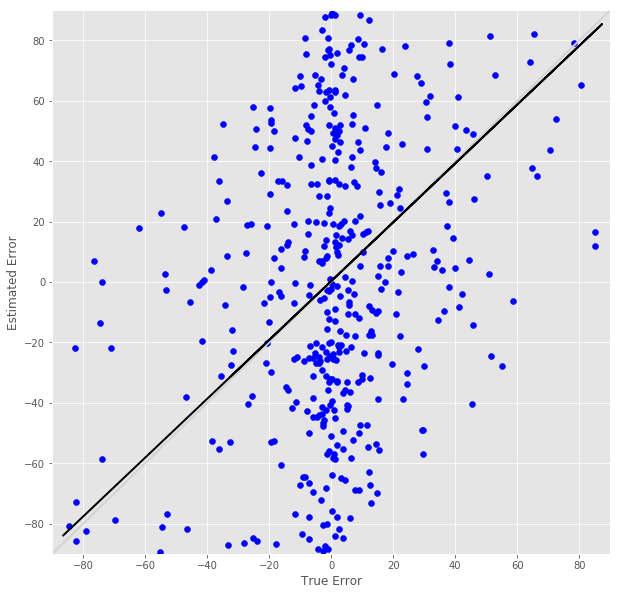

R^2 score for regression on RT: 0.0463
k = 0.0781


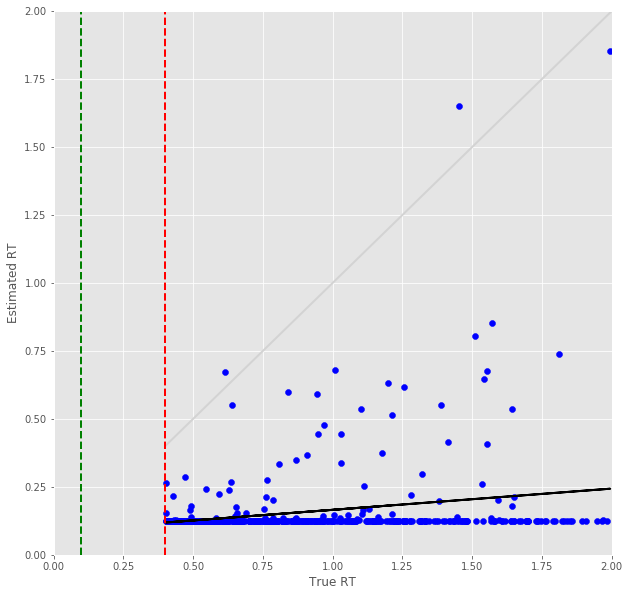

Error Prediction Score: 0.8536 RMSE
RT Prediction Score: 0.9377 RMSE
Error Prediction Corr: 0.4412
RT Prediction Corr: 0.2526
R^2 score for regression on Error: 0.1947
k = 0.9298


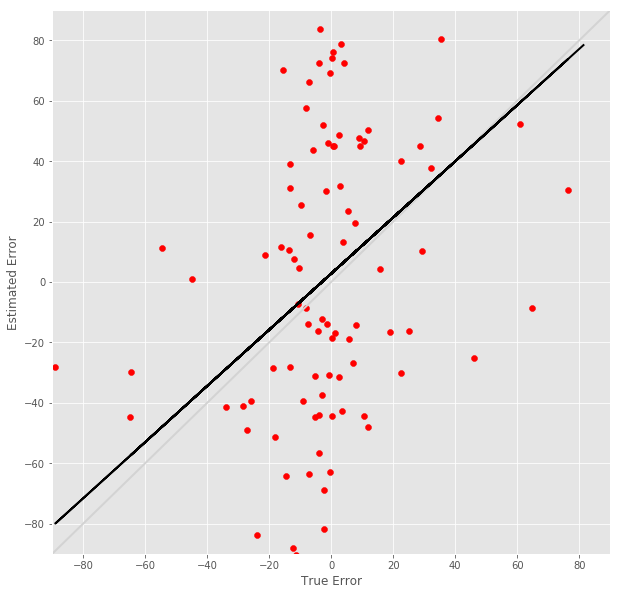

R^2 score for regression on RT: 0.0638
k = 0.0801


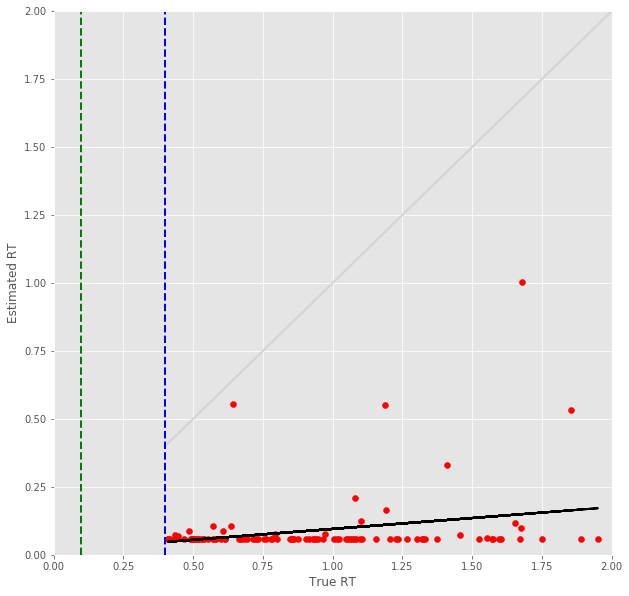

27 -step(s) forecast:
Test Score for 27 -steps forecast: 7.6686 RMSE
Predict Score for 27 -steps forecast: 7.5619 RMSE
Error Test Score for 27 -steps forecast: 0.8608 RMSE
RT Test Score for 27 -steps forecast: 0.8551 RMSE
Error Test Corr for 27 -steps forecast: 0.5041
RT Test Corr for 27 -steps forecast: 0.1981


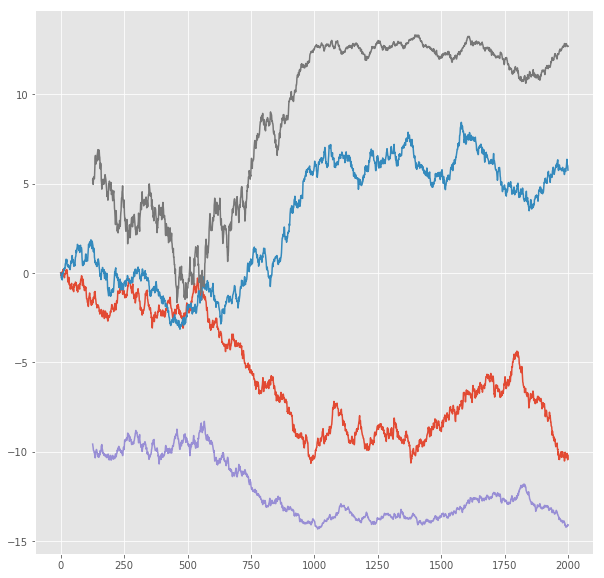

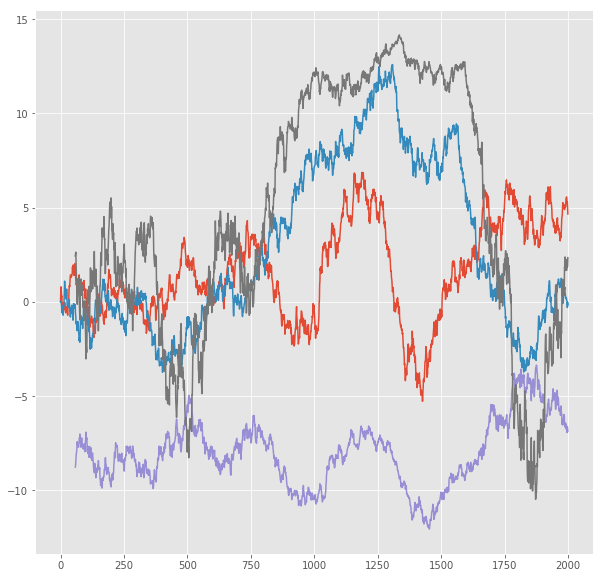

R^2 score for regression on Error: 0.2541
k = 0.9710


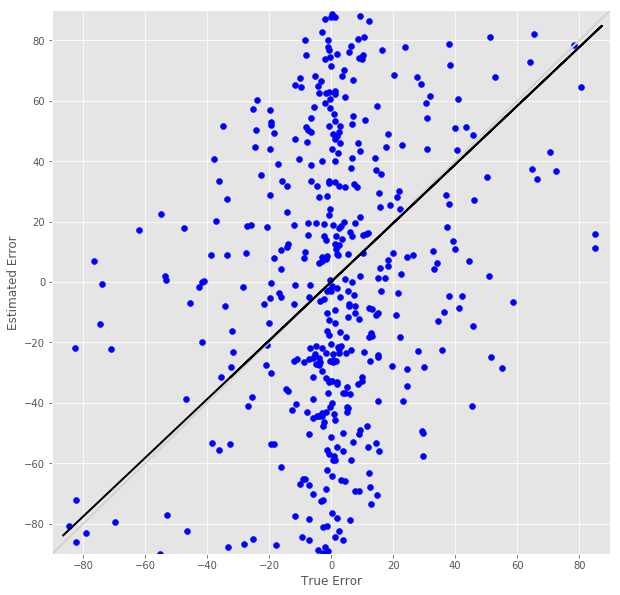

R^2 score for regression on RT: 0.0392
k = 0.0628


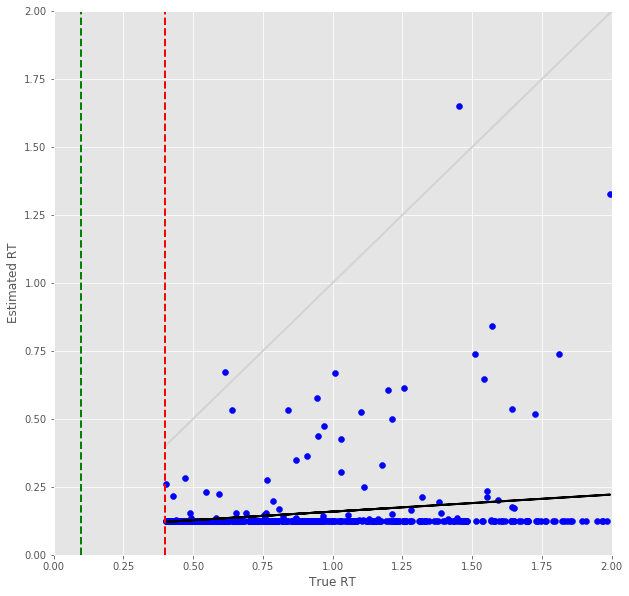

Error Prediction Score: 0.8646 RMSE
RT Prediction Score: 0.9438 RMSE
Error Prediction Corr: 0.4418
RT Prediction Corr: 0.2614
R^2 score for regression on Error: 0.1952
k = 0.9444


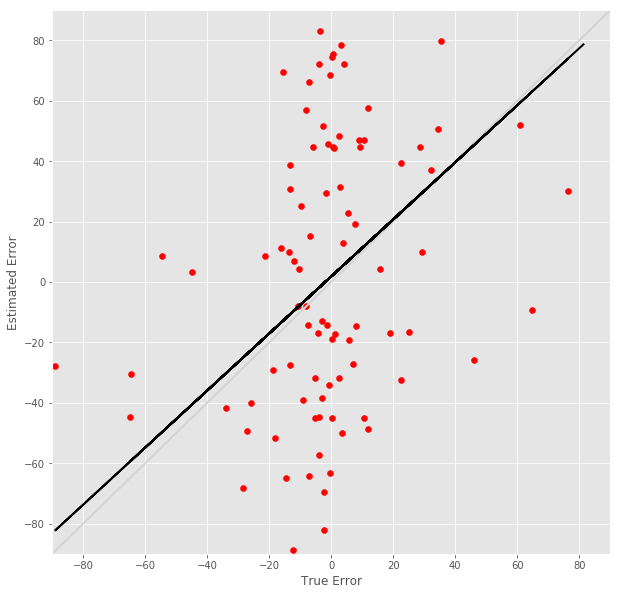

R^2 score for regression on RT: 0.0683
k = 0.0740


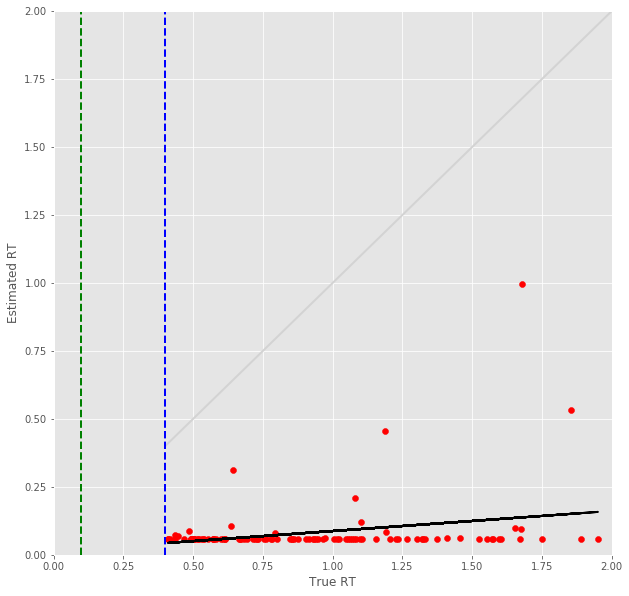

28 -step(s) forecast:
Test Score for 28 -steps forecast: 7.8966 RMSE
Predict Score for 28 -steps forecast: 7.7883 RMSE
Error Test Score for 28 -steps forecast: 0.8653 RMSE
RT Test Score for 28 -steps forecast: 0.8637 RMSE
Error Test Corr for 28 -steps forecast: 0.4990
RT Test Corr for 28 -steps forecast: 0.1559


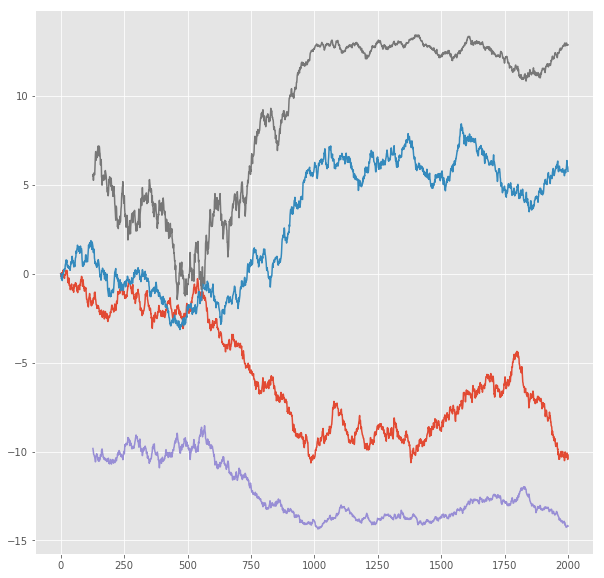

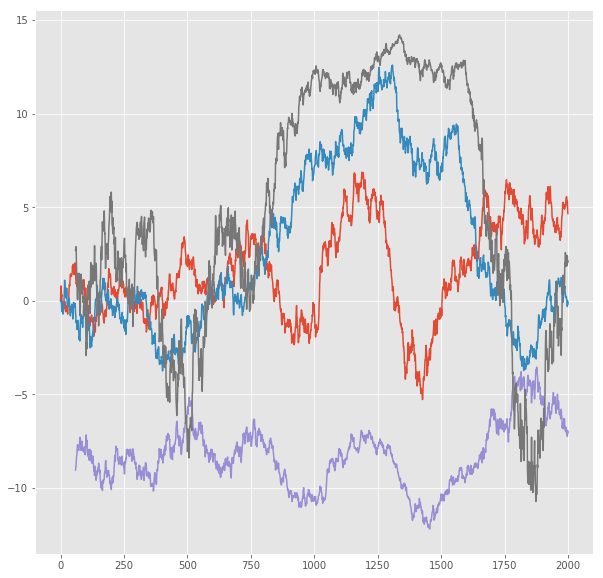

R^2 score for regression on Error: 0.2490
k = 0.9630


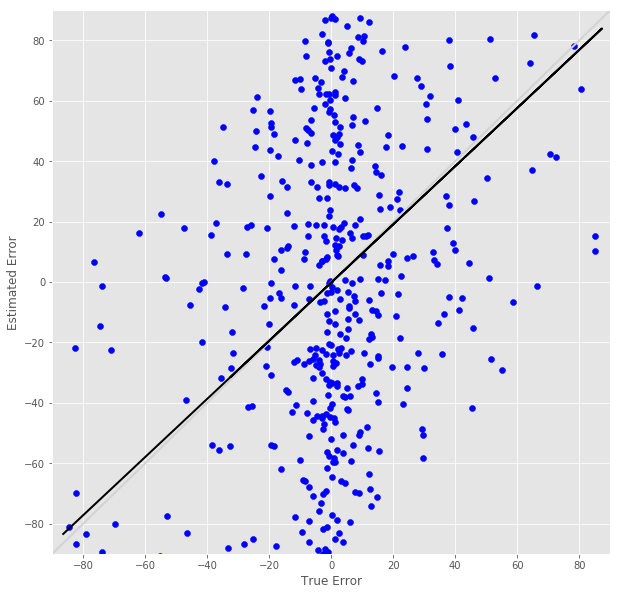

R^2 score for regression on RT: 0.0243
k = 0.0328


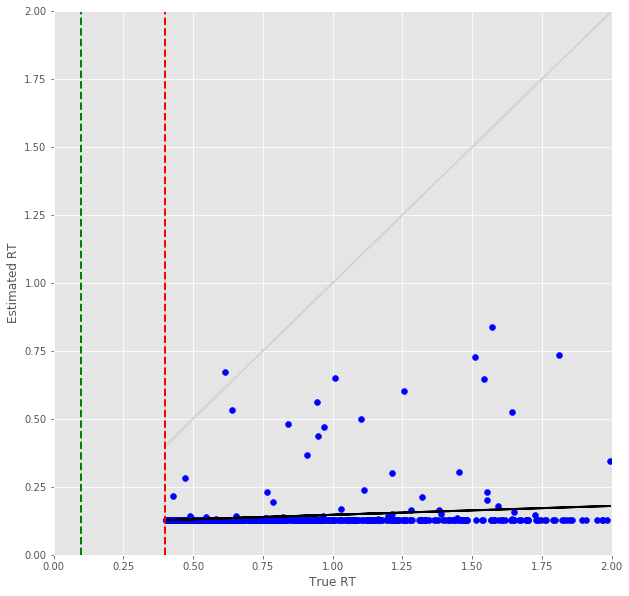

Error Prediction Score: 0.8821 RMSE
RT Prediction Score: 0.9592 RMSE
Error Prediction Corr: 0.4228
RT Prediction Corr: 0.1876
R^2 score for regression on Error: 0.1787
k = 0.9127


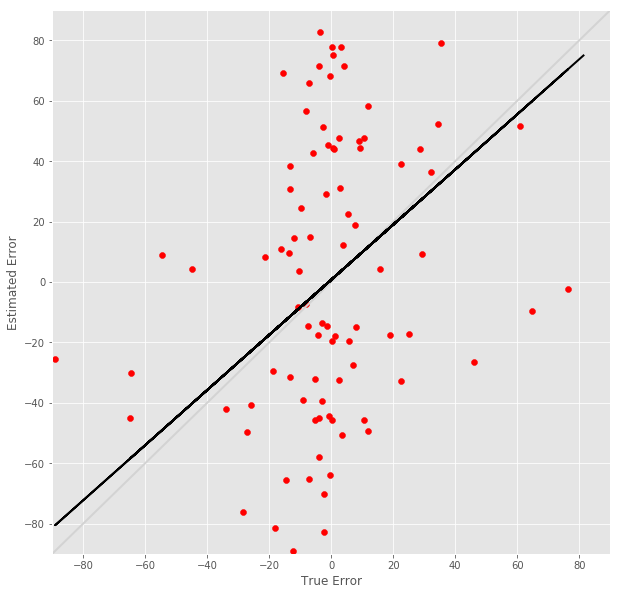

R^2 score for regression on RT: 0.0352
k = 0.0427


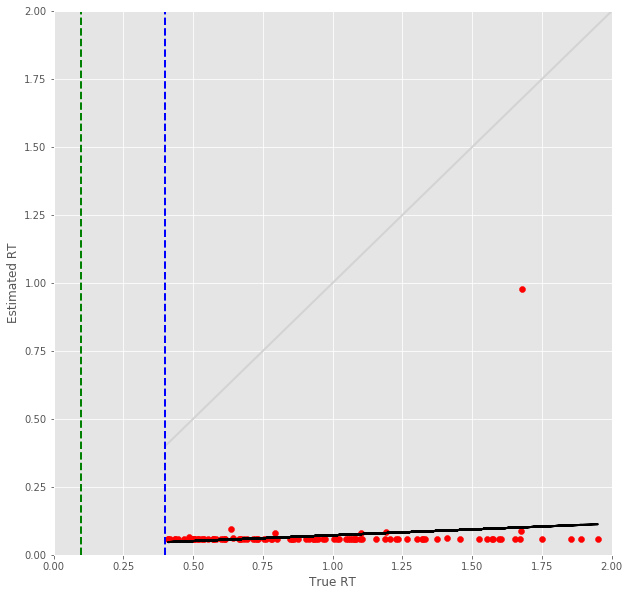

29 -step(s) forecast:
Test Score for 29 -steps forecast: 8.1218 RMSE
Predict Score for 29 -steps forecast: 8.0119 RMSE
Error Test Score for 29 -steps forecast: 0.8710 RMSE
RT Test Score for 29 -steps forecast: 0.8687 RMSE
Error Test Corr for 29 -steps forecast: 0.4956
RT Test Corr for 29 -steps forecast: 0.1160


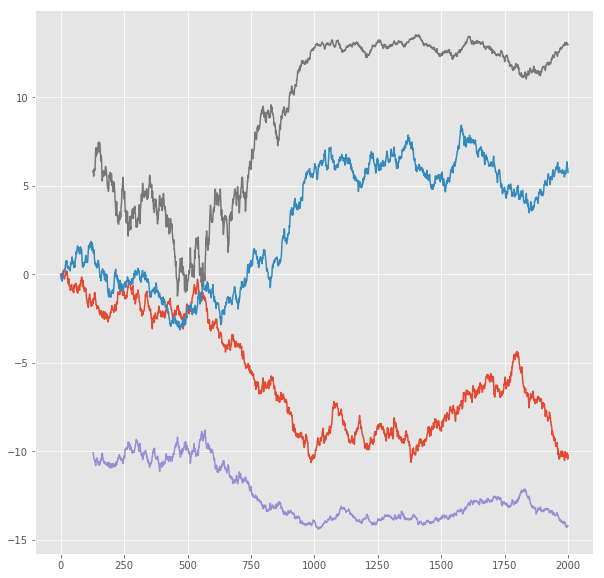

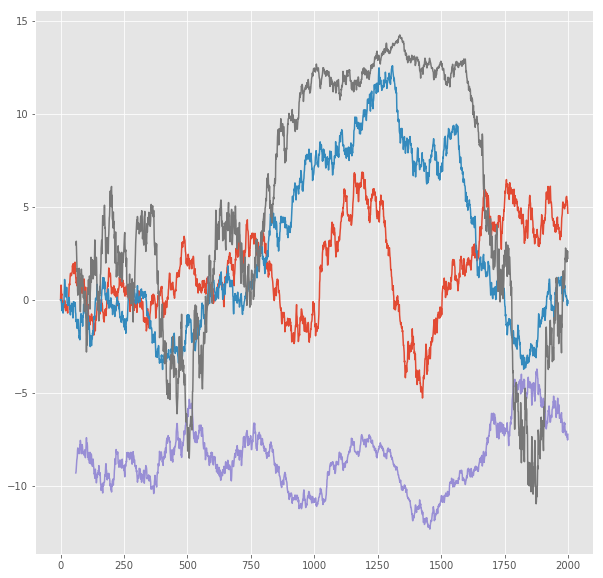

R^2 score for regression on Error: 0.2456
k = 0.9605


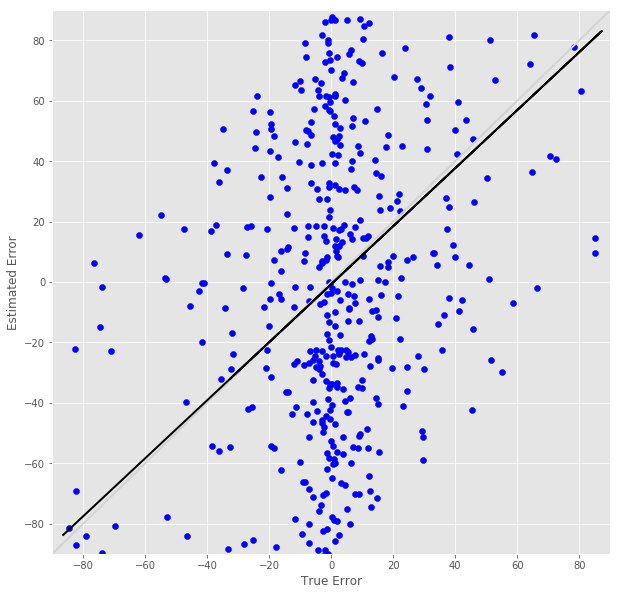

R^2 score for regression on RT: 0.0135
k = 0.0197


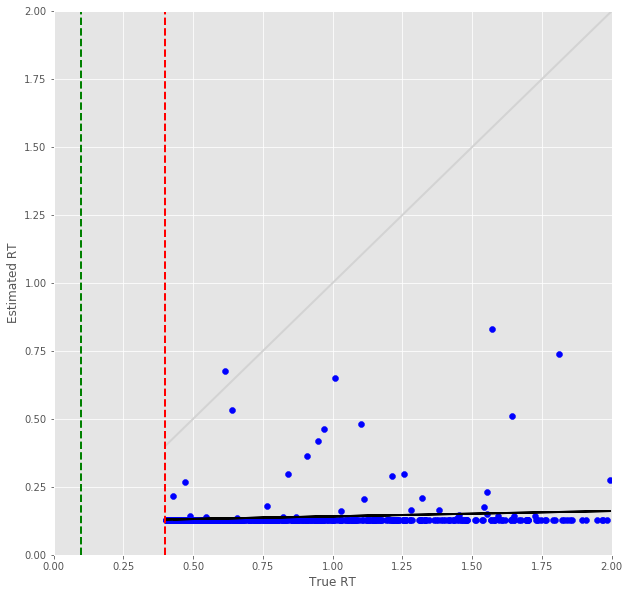

Error Prediction Score: 0.8838 RMSE
RT Prediction Score: 0.9591 RMSE
Error Prediction Corr: 0.4212
RT Prediction Corr: 0.1879
R^2 score for regression on Error: 0.1774
k = 0.9104


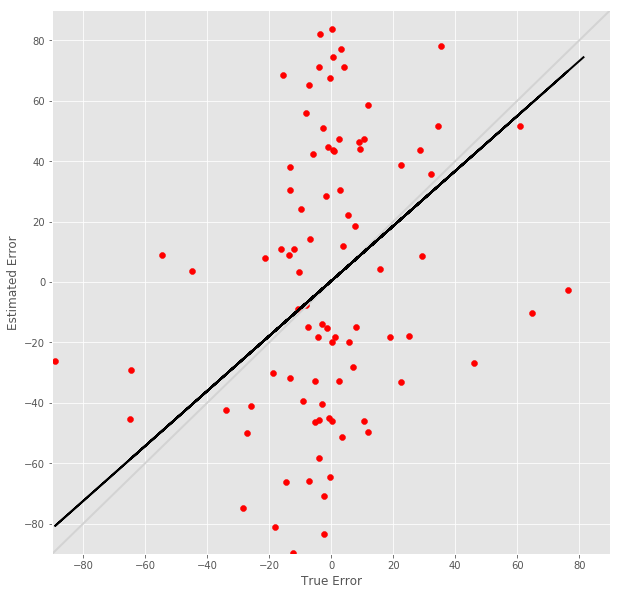

R^2 score for regression on RT: 0.0353
k = 0.0421


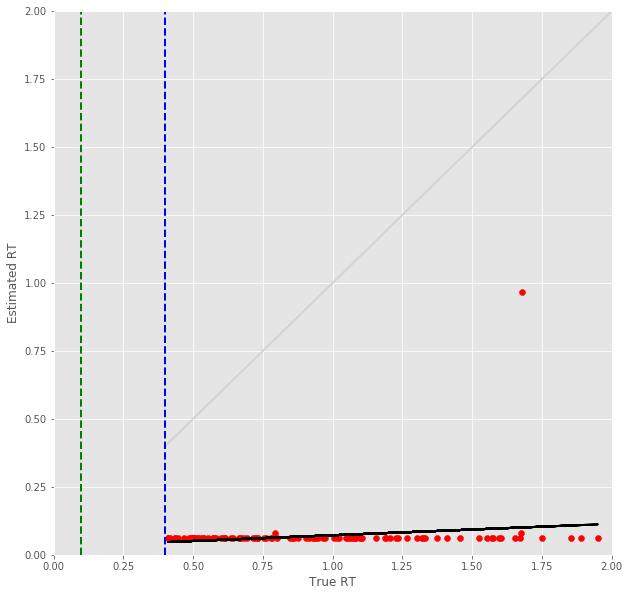

30 -step(s) forecast:
Test Score for 30 -steps forecast: 8.3441 RMSE
Predict Score for 30 -steps forecast: 8.2325 RMSE
Error Test Score for 30 -steps forecast: 0.8765 RMSE
RT Test Score for 30 -steps forecast: 0.8717 RMSE
Error Test Corr for 30 -steps forecast: 0.4907
RT Test Corr for 30 -steps forecast: 0.0736


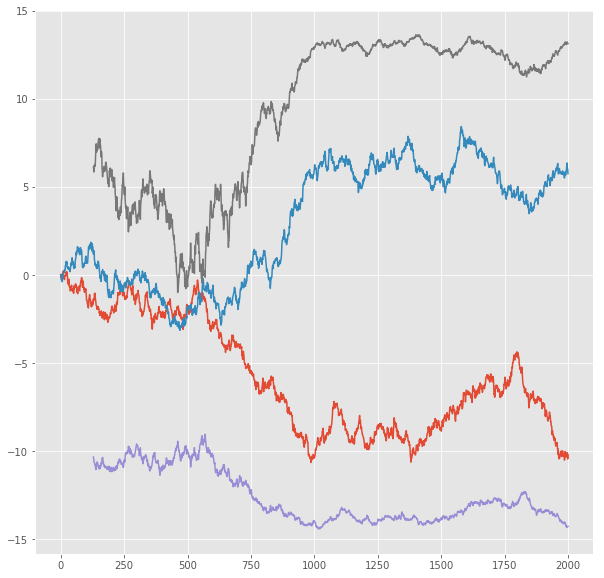

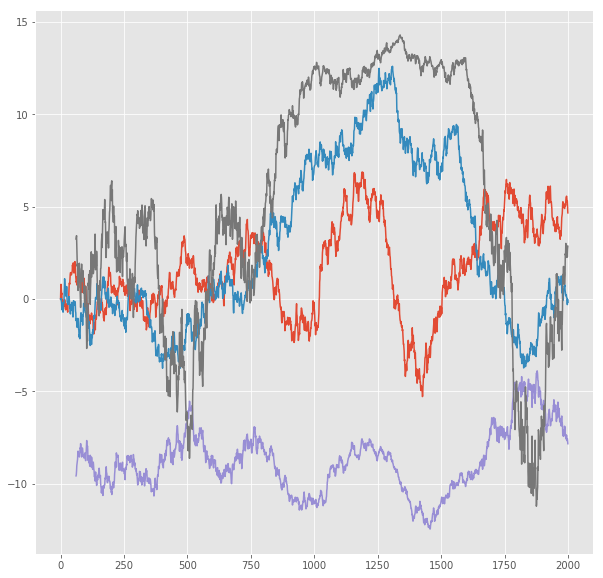

R^2 score for regression on Error: 0.2408
k = 0.9536


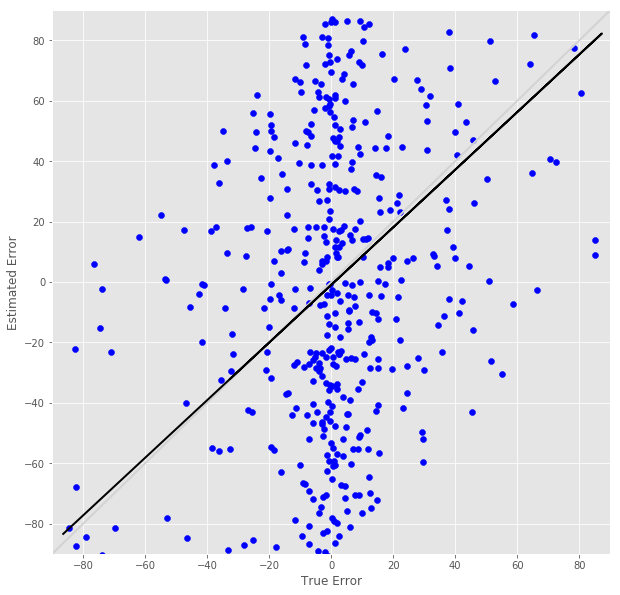

R^2 score for regression on RT: 0.0054
k = 0.0103


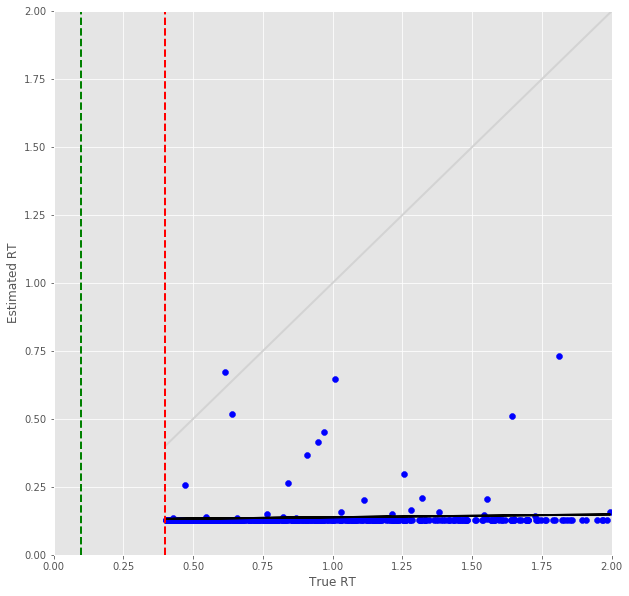

Error Prediction Score: 0.8937 RMSE
RT Prediction Score: 0.9696 RMSE
Error Prediction Corr: 0.4134
RT Prediction Corr: 0.1059
R^2 score for regression on Error: 0.1709
k = 0.8999


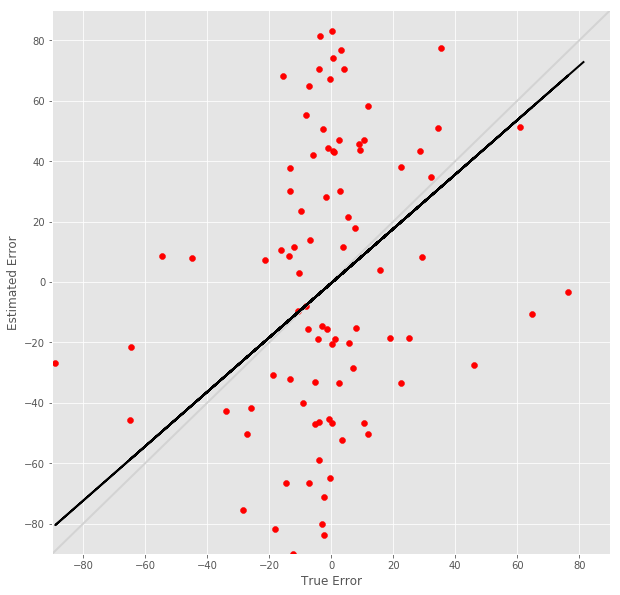

R^2 score for regression on RT: 0.0112
k = 0.0002


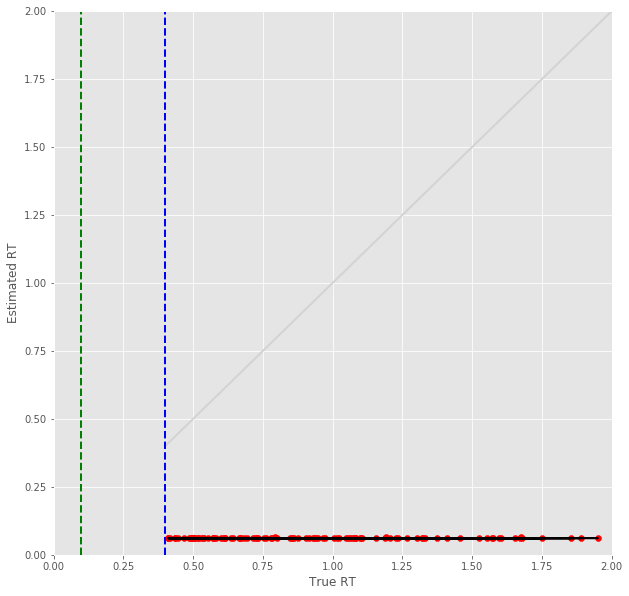

31 -step(s) forecast:
Test Score for 31 -steps forecast: 8.5636 RMSE
Predict Score for 31 -steps forecast: 8.4503 RMSE
Error Test Score for 31 -steps forecast: 0.8833 RMSE
RT Test Score for 31 -steps forecast: 0.8750 RMSE
Error Test Corr for 31 -steps forecast: 0.4824
RT Test Corr for 31 -steps forecast: 0.0753


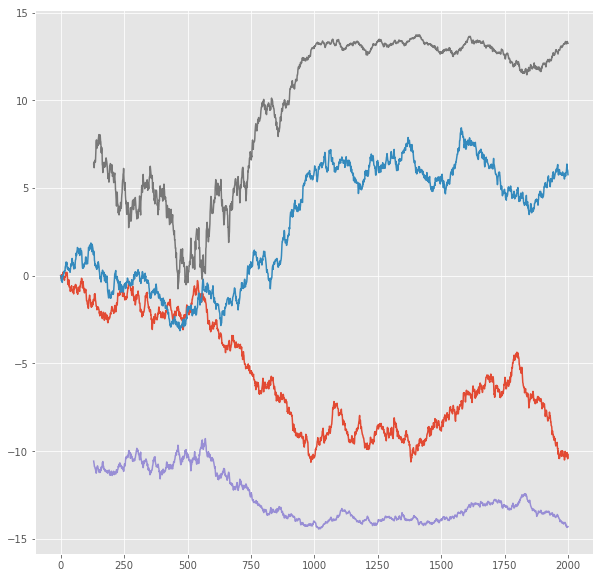

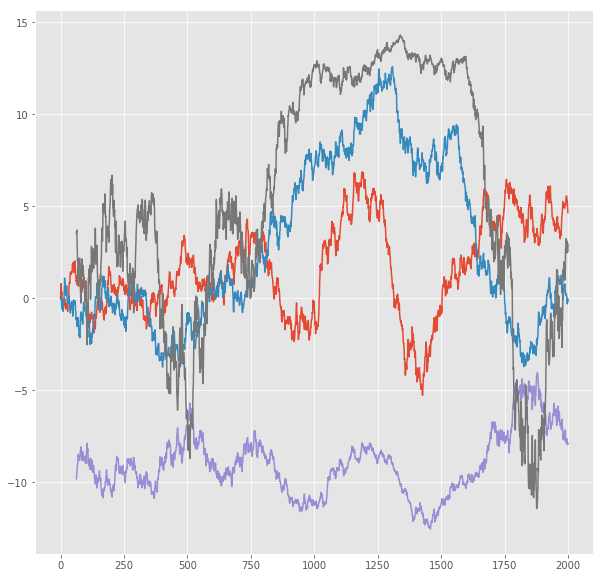

R^2 score for regression on Error: 0.2327
k = 0.9405


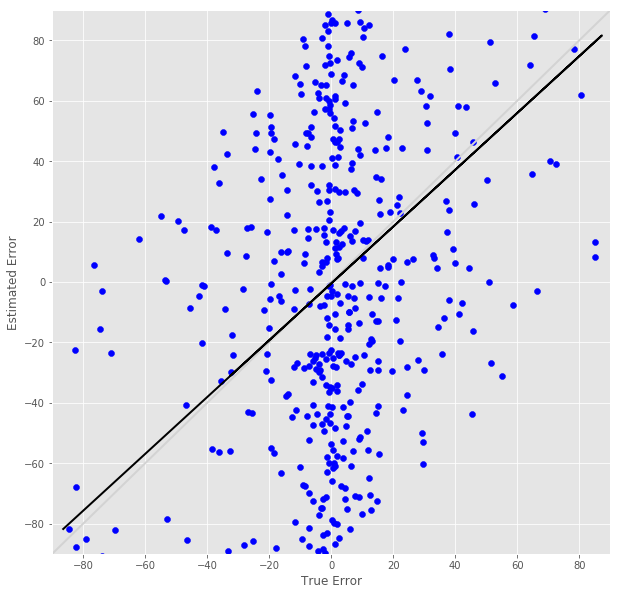

R^2 score for regression on RT: 0.0057
k = 0.0081


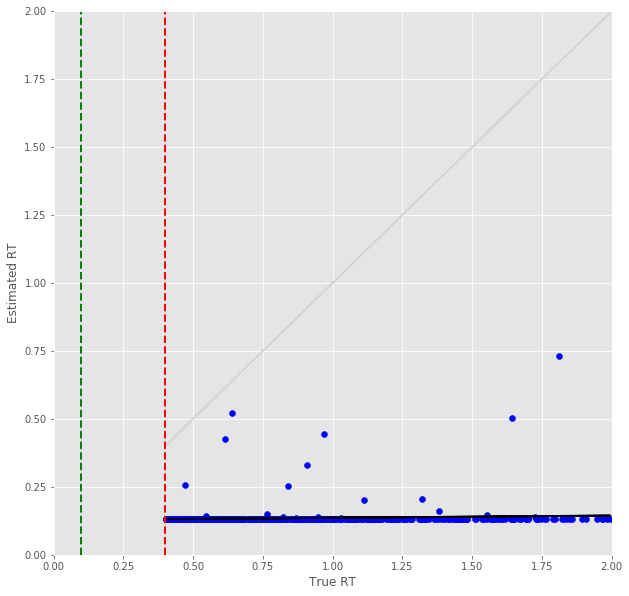

Error Prediction Score: 0.8941 RMSE
RT Prediction Score: 0.9688 RMSE
Error Prediction Corr: 0.4124
RT Prediction Corr: 0.1743
R^2 score for regression on Error: 0.1701
k = 0.8975


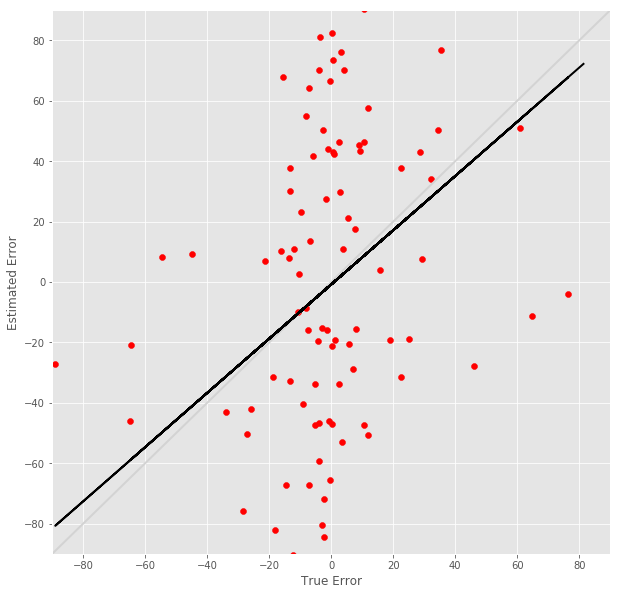

R^2 score for regression on RT: 0.0304
k = 0.0001


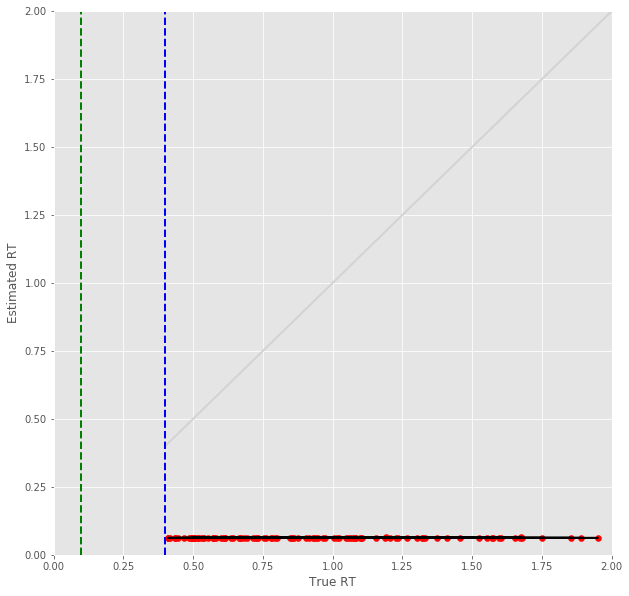

32 -step(s) forecast:
Test Score for 32 -steps forecast: 8.7801 RMSE
Predict Score for 32 -steps forecast: 8.6651 RMSE
Error Test Score for 32 -steps forecast: 0.8890 RMSE
RT Test Score for 32 -steps forecast: 0.8768 RMSE
Error Test Corr for 32 -steps forecast: 0.4835
RT Test Corr for 32 -steps forecast: 0.0965


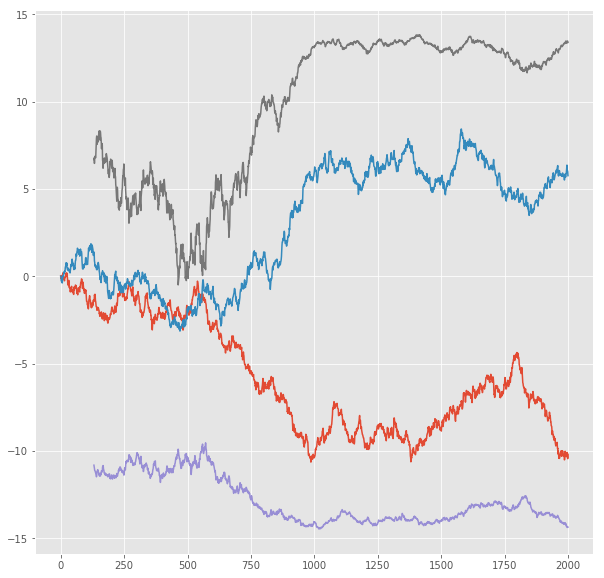

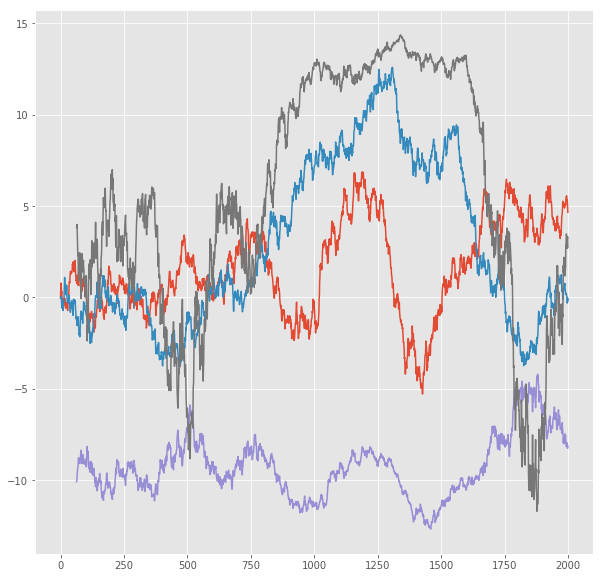

R^2 score for regression on Error: 0.2338
k = 0.9498


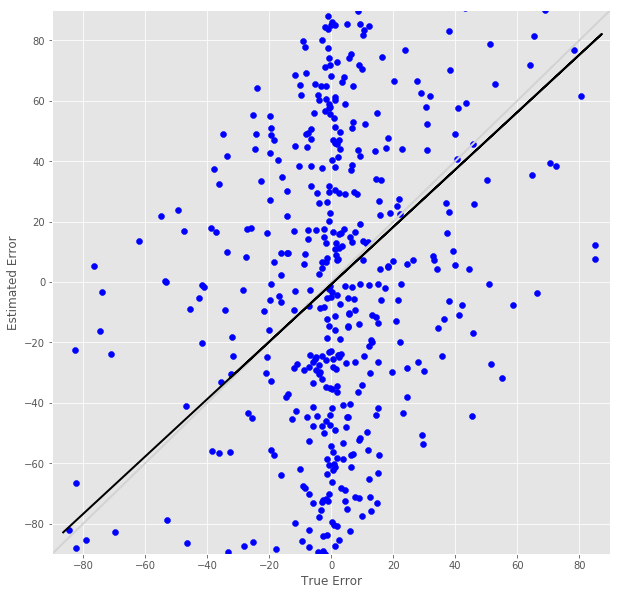

R^2 score for regression on RT: 0.0093
k = 0.0068


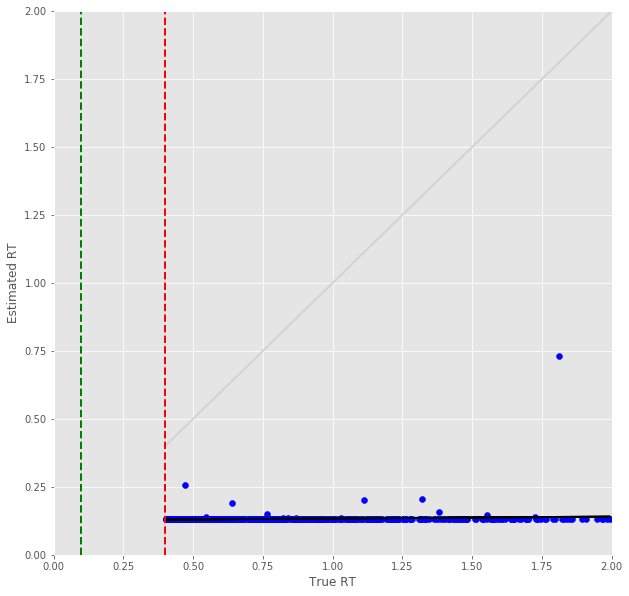

Error Prediction Score: 0.8944 RMSE
RT Prediction Score: 0.9679 RMSE
Error Prediction Corr: 0.4122
RT Prediction Corr: 0.1830
R^2 score for regression on Error: 0.1699
k = 0.8971


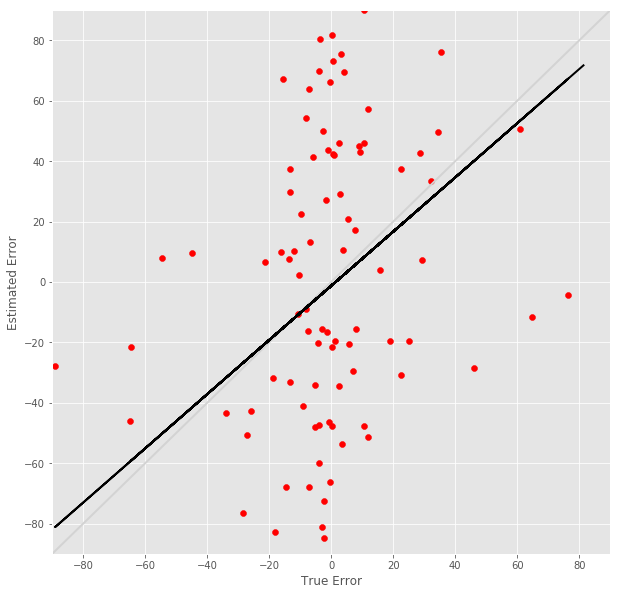

R^2 score for regression on RT: 0.0335
k = 0.0000


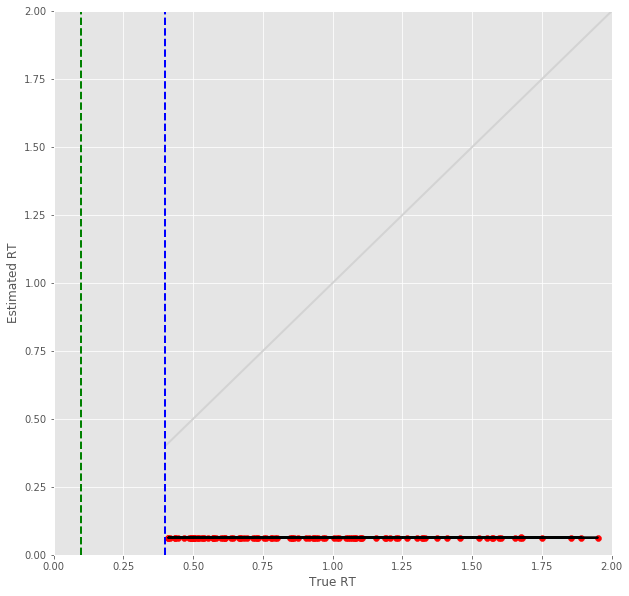

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

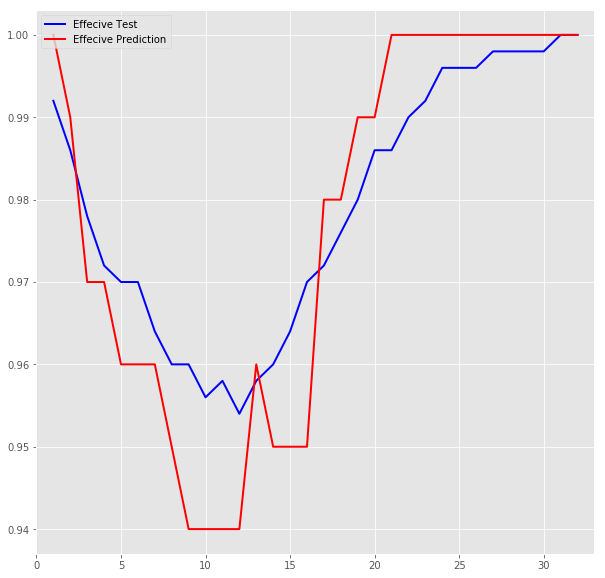

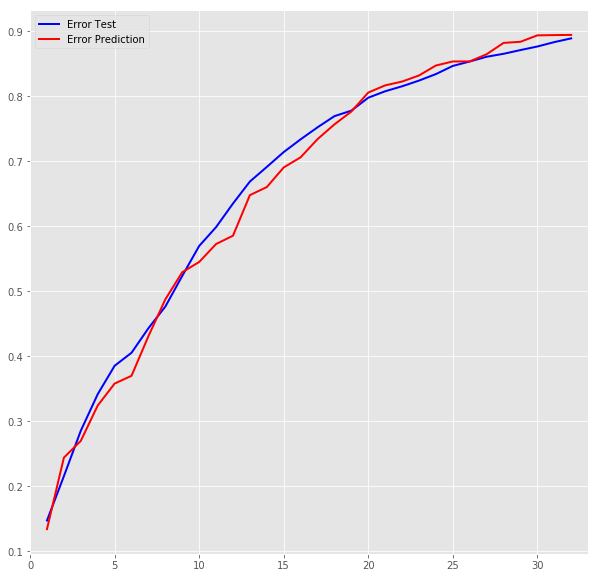

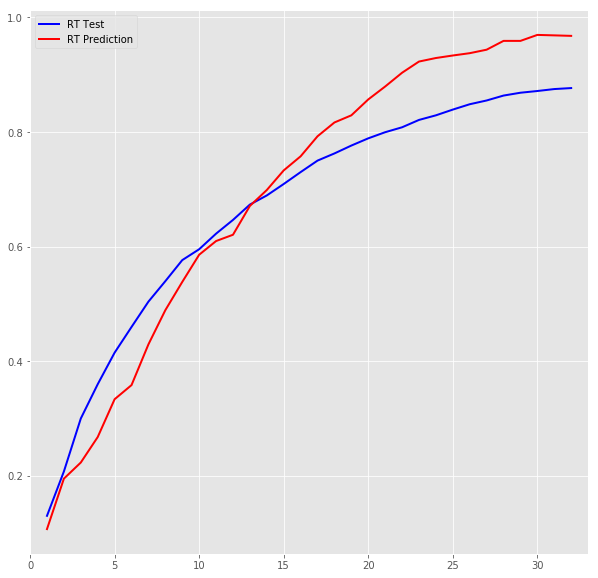

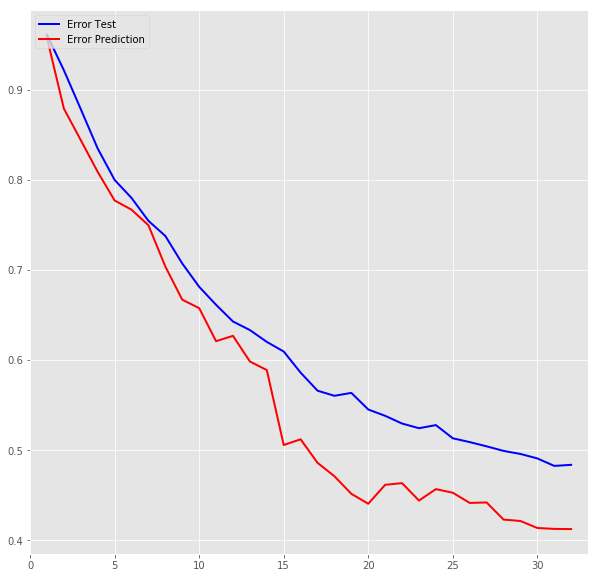

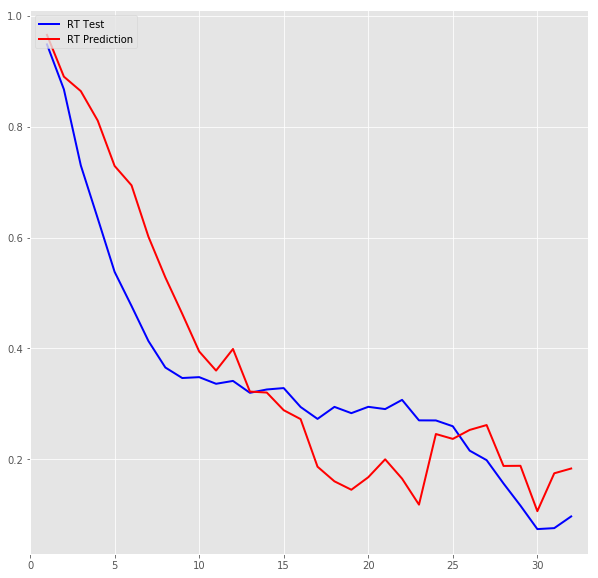

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
